In [1]:
import asyncio
import datetime
import os
import threading
import time
import csv
import base64
from collections import deque
import nest_asyncio

from arduino_iot_cloud import ArduinoCloudClient
import numpy as np
import cv2  # OpenCV for image capture
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import dash
from dash import dcc, html, Input, Output, State
from dash.exceptions import PreventUpdate

# Apply nest_asyncio to allow asyncio to run within another event loop
nest_asyncio.apply()

# --- Arduino Cloud Configuration ---
DEVICE_ID = "7c085c20-b2ad-4248-88cb-fa699d451afe"
SECRET_KEY = "XqwDz6uY8og9oQzGj6NFUThHL"

# --- Data Storage ---
MAX_DATA_POINTS = 300  # Buffer for 10 seconds of data at ~30Hz
data_history = {
    "timestamp": deque(maxlen=MAX_DATA_POINTS),
    "x": deque(maxlen=MAX_DATA_POINTS),
    "y": deque(maxlen=MAX_DATA_POINTS),
    "z": deque(maxlen=MAX_DATA_POINTS),
}

# Buffer for incomplete data points
pending_data = {"x": None, "y": None, "z": None}
data_lock = threading.Lock()
last_update_time = time.time()

# File management
sequence_number = 1
data_dir = "activity_data"
os.makedirs(data_dir, exist_ok=True)

# Annotation file
annotation_file = os.path.join(data_dir, "annotations.csv")
with open(annotation_file, 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(["filename", "activity_label"])

# Activity types (0: no-activity, 1: activity1, 2: activity2)
current_activity = 0  # Default to no activity

# Global variables for dashboard
latest_image_path = None
latest_data_filename = None
dash_update_event = threading.Event()

# --- Arduino Client and Data Collection Logic ---
def on_data_received(client, name, value):
    """Callback to handle incoming data and update the shared deque."""
    global last_update_time
    
    with data_lock:
        if name == "py_x":
            pending_data["x"] = value
        elif name == "py_y":
            pending_data["y"] = value
        elif name == "py_z":
            pending_data["z"] = value
        
        # Only update when we have all three values
        if all(v is not None for v in pending_data.values()):
            current_time = datetime.datetime.now()
            data_history["timestamp"].append(current_time)
            data_history["x"].append(pending_data["x"])
            data_history["y"].append(pending_data["y"])
            data_history["z"].append(pending_data["z"])
            
            # Reset pending data
            pending_data["x"] = None
            pending_data["y"] = None
            pending_data["z"] = None
            
            last_update_time = time.time()

async def arduino_client_main():
    """Main async function to run the Arduino client."""
    client = ArduinoCloudClient(device_id=DEVICE_ID, username=DEVICE_ID, password=SECRET_KEY)
    
    # Register properties and their callbacks
    client.register("py_x", on_write=lambda c, v: on_data_received(c, "py_x", v))
    client.register("py_y", on_write=lambda c, v: on_data_received(c, "py_y", v))
    client.register("py_z", on_write=lambda c, v: on_data_received(c, "py_z", v))

    print("Starting Arduino Cloud client in a background thread...")
    await client.start()
    
    # Keep the client running
    while True:
        await asyncio.sleep(0.01)  # Very short sleep for responsiveness

def start_arduino_client_thread():
    """Starts the asyncio event loop for the client in a new thread."""
    loop = asyncio.new_event_loop()
    asyncio.set_event_loop(loop)
    loop.run_until_complete(arduino_client_main())

# --- Image Capture and Data Saving Functions ---
def capture_image():
    """Capture an image from the webcam and return the image data."""
    cap = cv2.VideoCapture(0)  # 0 for default camera
    
    if not cap.isOpened():
        print("Error: Could not open webcam")
        return None
    
    # Set camera resolution
    cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
    cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)
    
    # Capture frame
    ret, frame = cap.read()
    
    # Release the camera
    cap.release()
    
    if ret:
        return frame
    else:
        print("Error: Could not capture image")
        return None

def save_data_and_image():
    """Save the current data buffer to CSV and capture an image."""
    global sequence_number, latest_image_path, latest_data_filename
    
    with data_lock:
        if len(data_history["timestamp"]) == 0:
            print("No data to save")
            return
        
        # Create timestamp for filename
        timestamp = datetime.datetime.now().strftime("%Y%m%d%H%M%S")
        filename_base = f"{sequence_number:04d}_{timestamp}"
        
        # Save accelerometer data to CSV
        csv_filename = os.path.join(data_dir, f"{filename_base}.csv")
        with open(csv_filename, 'w', newline='') as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(["timestamp", "x", "y", "z"])
            
            for i in range(len(data_history["timestamp"])):
                writer.writerow([
                    data_history["timestamp"][i].strftime("%Y-%m-%d %H:%M:%S.%f"),
                    data_history["x"][i],
                    data_history["y"][i],
                    data_history["z"][i]
                ])
        
        # Capture and save image
        image = capture_image()
        if image is not None:
            image_filename = os.path.join(data_dir, f"{filename_base}.jpg")
            cv2.imwrite(image_filename, image)
            latest_image_path = image_filename
            print(f"Saved image: {image_filename}")
        
        # Add to annotation file
        with open(annotation_file, 'a', newline='') as annfile:
            writer = csv.writer(annfile)
            writer.writerow([f"{filename_base}.csv", current_activity])

        save_analysis()
        
        latest_data_filename = csv_filename
        sequence_number += 1
        
        # Signal the dashboard to update
        dash_update_event.set()
        
        print(f"Saved data and image for activity {current_activity} (sequence {sequence_number - 1})")

def save_analysis():
    """Generate a summary of activity data and save it to a text file."""
    data_files = [f for f in os.listdir(data_dir) if f.endswith('.csv') and not f.startswith('annotations')]
    if not data_files:
        return

    annotations = pd.read_csv(annotation_file)

    # Merge all CSVs into one DataFrame
    all_data = []
    for file in data_files:
        file_path = os.path.join(data_dir, file)
        try:
            df = pd.read_csv(file_path)
            df['filename'] = file
            all_data.append(df)
        except:
            continue

    if not all_data:
        return

    merged = pd.concat(all_data, ignore_index=True)

    # Calculate averages
    avg_x = merged['x'].mean()
    avg_y = merged['y'].mean()
    avg_z = merged['z'].mean()

    # Count activity labels
    label_counts = annotations['activity_label'].value_counts().to_dict()
    count_0 = label_counts.get(0, 0)
    count_1 = label_counts.get(1, 0)
    count_2 = label_counts.get(2, 0)

    summary_path = os.path.join(data_dir, "analysis_summary.txt")
    with open(summary_path, "w") as f:
        f.write("Activity Data Analysis Summary\n")
        f.write("="*40 + "\n\n")
        f.write(f"Average X: {avg_x:.3f}\n")
        f.write(f"Average Y: {avg_y:.3f}\n")
        f.write(f"Average Z: {avg_z:.3f}\n\n")
        f.write("Activity Counts:\n")
        f.write(f"  No Activity (0): {count_0}\n")
        f.write(f"  Waving (1): {count_1}\n")
        f.write(f"  Shaking (2): {count_2}\n")

    print(f"Analysis summary updated: {summary_path}")


# --- Data Collection Loop ---
def data_collection_loop():
    """Main loop for data collection. Saves data automatically every 10 seconds."""
    print("Starting data collection loop...")
    print("Data will be automatically saved every 10 seconds.")
    
    last_save_time = time.time()
    save_interval = 10  # Save every 10 seconds
    
    try:
        while True:
            current_time = time.time()
            # Save data periodically
            if current_time - last_save_time >= save_interval:
                save_data_and_image()
                last_save_time = current_time
            
            # Display current data status
            with data_lock:
                data_count = len(data_history["timestamp"])
            
            # The 'current_activity' is always 0 here, which is fine. We will fix it manually later.
            print(f"\rData points: {data_count}, Activity: {current_activity}, Next save in: {int(save_interval - (current_time - last_save_time))}s", end="")
            
            time.sleep(0.1)  # Short sleep to prevent high CPU usage
            
    except KeyboardInterrupt:
        print("\nData collection interrupted by user")
    
    print("Data collection completed")

# --- Dashboard Functions ---
def create_dashboard():
    """Create and configure the Dash dashboard."""
    app = dash.Dash(__name__)
    
    # Define the layout
    app.layout = html.Div([
        html.H1("Smartphone Accelerometer Data with Activity Images", 
                style={'textAlign': 'center', 'color': '#2c3e50', 'marginBottom': '20px'}),
        
        # Status indicator
        html.Div([
            html.Div(id='status-indicator', style={
                'height': '20px', 
                'width': '20px', 
                'backgroundColor': 'gray', 
                'borderRadius': '50%',
                'display': 'inline-block',
                'marginLeft': '20px'
            }),
            html.Span(id='status-text', style={'marginLeft': '10px'}),
            html.Span(" | Activity: ", style={'marginLeft': '20px'}),
            html.Span(id='activity-display', style={'fontWeight': 'bold'})
        ], style={'marginBottom': '20px'}),
        
        # Main content area
        html.Div([
            # Left column for accelerometer data
            html.Div([
                html.H3("Accelerometer Data"),
                dcc.Graph(id='combined-plot', style={'height': '400px'}),
                html.Div([
                    dcc.Graph(id='x-plot', style={'height': '250px', 'width': '32%', 'display': 'inline-block'}),
                    dcc.Graph(id='y-plot', style={'height': '250px', 'width': '32%', 'display': 'inline-block', 'marginLeft': '2%'}),
                    dcc.Graph(id='z-plot', style={'height': '250px', 'width': '32%', 'display': 'inline-block', 'marginLeft': '2%'}),
                ]),
            ], style={'width': '65%', 'display': 'inline-block', 'verticalAlign': 'top'}),
            
            # Right column for activity image
            html.Div([
                html.H3("Captured Activity Image"),
                html.Img(id='activity-image', style={'width': '100%', 'border': '1px solid #ddd', 'borderRadius': '4px'}),
                html.Div([
                    html.Button('Save Current Data & Image', id='save-button', n_clicks=0,
                               style={'marginTop': '10px', 'padding': '10px', 'backgroundColor': '#4CAF50', 'color': 'white', 'border': 'none', 'borderRadius': '4px'})
                ], style={'textAlign': 'center', 'marginTop': '10px'})
            ], style={'width': '32%', 'display': 'inline-block', 'marginLeft': '2%', 'verticalAlign': 'top'}),
        ]),
        
        # Hidden div to trigger updates
        html.Div(id='dummy-update', style={'display': 'none'}),
        
        # Interval component
        dcc.Interval(
            id='interval-component',
            interval=1000,  # Update every second
            n_intervals=0
        ),
    ], style={'padding': '20px', 'fontFamily': 'Arial, sans-serif'})
    
    # Callback to update status indicator
    @app.callback(
        [Output('status-indicator', 'style'), Output('status-text', 'children')],
        Input('interval-component', 'n_intervals')
    )
    def update_status(n):
        current_time = time.time()
        time_diff = current_time - last_update_time
        
        status_style = {
            'height': '20px', 
            'width': '20px', 
            'borderRadius': '50%',
            'display': 'inline-block',
            'marginLeft': '20px'
        }
        
        if time_diff < 2:  # Updated in last 2 seconds
            status_style['backgroundColor'] = 'green'
            status_text = "Receiving data (updated {:.1f}s ago)".format(time_diff)
        elif time_diff < 5:
            status_style['backgroundColor'] = 'orange'
            status_text = "Slow data (updated {:.1f}s ago)".format(time_diff)
        else:
            status_style['backgroundColor'] = 'red'
            status_text = "No recent data (updated {:.1f}s ago)".format(time_diff)
            
        return status_style, status_text
    
    # Callback to update activity display
    @app.callback(
        Output('activity-display', 'children'),
        Input('interval-component', 'n_intervals')
    )
    def update_activity_display(n):
        activity_names = {
            0: "No Activity",
            1: "Waving",
            2: "Activity 2 Shaking"
        }
        return activity_names.get(current_activity, "Unknown")
    
    # Callback to update the combined plot
    @app.callback(
        Output('combined-plot', 'figure'),
        Input('interval-component', 'n_intervals')
    )
    def update_combined_plot(n):
        with data_lock:
            timestamps = list(data_history["timestamp"])
            x_data = list(data_history["x"])
            y_data = list(data_history["y"])
            z_data = list(data_history["z"])
        
        fig = go.Figure()
        
        if timestamps and x_data:
            fig.add_trace(go.Scatter(
                x=timestamps, y=x_data,
                name='X-axis',
                line=dict(color='#e74c3c')
            ))
            
        if timestamps and y_data:
            fig.add_trace(go.Scatter(
                x=timestamps, y=y_data,
                name='Y-axis',
                line=dict(color='#2ecc71')
            ))
            
        if timestamps and z_data:
            fig.add_trace(go.Scatter(
                x=timestamps, y=z_data,
                name='Z-axis',
                line=dict(color='#3498db')
            ))
        
        fig.update_layout(
            title='Combined Accelerometer Data',
            xaxis_title='Time',
            yaxis_title='Acceleration (m/s²)',
            legend_title='Axis',
            template='plotly_white',
            hovermode='x unified',
            uirevision='constant'  # Preserves UI state during updates
        )
        
        return fig
    
    # Callback for X-axis plot
    @app.callback(
        Output('x-plot', 'figure'),
        Input('interval-component', 'n_intervals')
    )
    def update_x_plot(n):
        with data_lock:
            timestamps = list(data_history["timestamp"])
            x_data = list(data_history["x"])
        
        fig = go.Figure()
        
        if timestamps and x_data:
            fig.add_trace(go.Scatter(
                x=timestamps, y=x_data,
                name='X-axis',
                line=dict(color='#e74c3c')
            ))
        
        fig.update_layout(
            title='X-Axis Acceleration',
            xaxis_title='Time',
            yaxis_title='Acceleration (m/s²)',
            template='plotly_white',
            uirevision='constant'
        )
        
        return fig
    
    # Callback for Y-axis plot
    @app.callback(
        Output('y-plot', 'figure'),
        Input('interval-component', 'n_intervals')
    )
    def update_y_plot(n):
        with data_lock:
            timestamps = list(data_history["timestamp"])
            y_data = list(data_history["y"])
        
        fig = go.Figure()
        
        if timestamps and y_data:
            fig.add_trace(go.Scatter(
                x=timestamps, y=y_data,
                name='Y-axis',
                line=dict(color='#2ecc71')
            ))
        
        fig.update_layout(
            title='Y-Axis Acceleration',
            xaxis_title='Time',
            yaxis_title='Acceleration (m/s²)',
            template='plotly_white',
            uirevision='constant'
        )
        
        return fig
    
    # Callback for Z-axis plot
    @app.callback(
        Output('z-plot', 'figure'),
        Input('interval-component', 'n_intervals')
    )
    def update_z_plot(n):
        with data_lock:
            timestamps = list(data_history["timestamp"])
            z_data = list(data_history["z"])
        
        fig = go.Figure()
        
        if timestamps and z_data:
            fig.add_trace(go.Scatter(
                x=timestamps, y=z_data,
                name='Z-axis',
                line=dict(color='#3498db')
            ))
        
        fig.update_layout(
            title='Z-Axis Acceleration',
            xaxis_title='Time',
            yaxis_title='Acceleration (m/s²)',
            template='plotly_white',
            uirevision='constant'
        )
        
        return fig
    
    # Callback to update activity image
    @app.callback(
        Output('activity-image', 'src'),
        Input('interval-component', 'n_intervals')
    )
    def update_activity_image(n):
        if latest_image_path and os.path.exists(latest_image_path):
            # Encode image to base64 for display in Dash
            with open(latest_image_path, 'rb') as f:
                image_data = f.read()
                encoded_image = base64.b64encode(image_data).decode('ascii')
                return f'data:image/jpeg;base64,{encoded_image}'
        return ''
    
    # Callback for save button
    @app.callback(
        Output('dummy-update', 'children'),
        Input('save-button', 'n_clicks'),
        prevent_initial_call=True
    )
    def handle_save_button(n_clicks):
        if n_clicks > 0:
            save_data_and_image()
        return ''
    
    return app


# --- Main Application Execution ---
if __name__ == '__main__':
    # 1. Start the Arduino data collection in a daemon thread
    arduino_thread = threading.Thread(target=start_arduino_client_thread, daemon=True)
    arduino_thread.start()
    
    # Give the Arduino client a moment to initialize
    time.sleep(2)
    
    # 2. Start data collection in a separate thread
    collection_thread = threading.Thread(target=data_collection_loop, daemon=True)
    collection_thread.start()
    
    # 3. Create and run the Dash dashboard
    print("Starting Dash dashboard...")
    app = create_dashboard()
    app.run(debug=True, jupyter_mode="tab")
    
    print("Task 8.3D completed successfully!")
    print(f"Data saved in: {data_dir}")
    print(f"Annotation file: {annotation_file}")


C:\Users\letan\anaconda3\envs\clean_env\Lib\site-packages\requests\__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


Starting Arduino Cloud client in a background thread...


ERROR:root:task: connection_task raised exception: .


Starting data collection loop...
Data will be automatically saved every 10 seconds.
Data points: 0, Activity: 0, Next save in: 9sStarting Dash dashboard...
Dash app running on http://127.0.0.1:8050/


<IPython.core.display.Javascript object>

Task 8.3D completed successfully!
Data saved in: activity_data
Annotation file: activity_data\annotations.csv
Data points: 0, Activity: 0, Next save in: 8s

ERROR:root:task: discovery raised exception: .


Data points: 3, Activity: 0, Next save in: 0sSaved image: activity_data\0001_20250921213007.jpg
Analysis summary updated: activity_data\analysis_summary.txt
Saved data and image for activity 0 (sequence 1)
Data points: 6, Activity: 0, Next save in: 0sSaved image: activity_data\0002_20250921213017.jpg
Analysis summary updated: activity_data\analysis_summary.txt
Saved data and image for activity 0 (sequence 2)
Data points: 9, Activity: 0, Next save in: 0sSaved image: activity_data\0003_20250921213027.jpg
Analysis summary updated: activity_data\analysis_summary.txt
Saved data and image for activity 0 (sequence 3)
Data points: 12, Activity: 0, Next save in: 0sSaved image: activity_data\0004_20250921213037.jpg
Analysis summary updated: activity_data\analysis_summary.txt
Saved data and image for activity 0 (sequence 4)
Data points: 15, Activity: 0, Next save in: 0sSaved image: activity_data\0005_20250921213047.jpg
Analysis summary updated: activity_data\analysis_summary.txt
Saved data and im

Found 181 files to annotate. Let's begin!
Instructions:
  - A plot and an image will be displayed for each data file.
  - In the TERMINAL, enter the correct activity label.
  - Options: '0' (No Activity), '1' (Waving), '2' (Shaking)
  - Enter 's' to skip, or 'q' to quit and save progress.
------------------------------


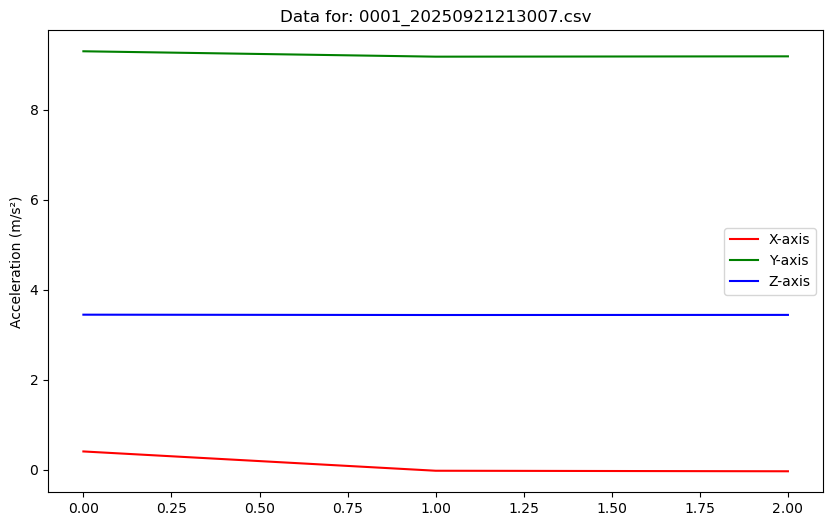

Enter label for 0001_20250921213007 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


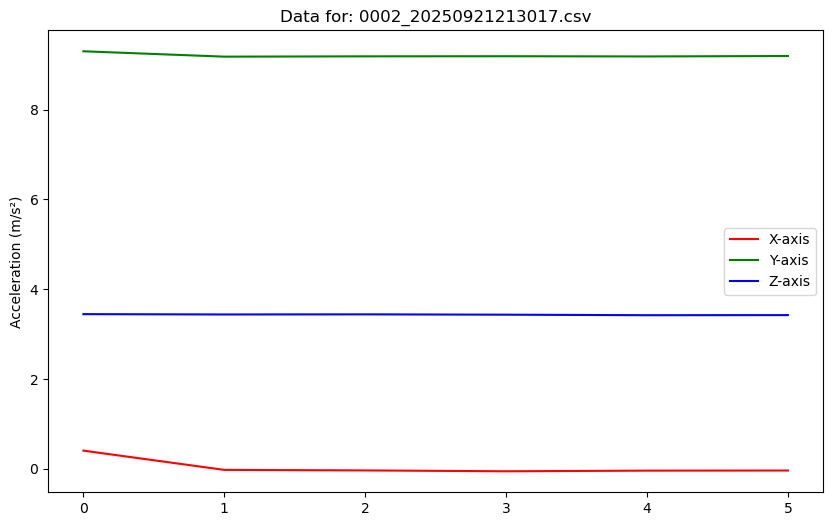

Enter label for 0002_20250921213017 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


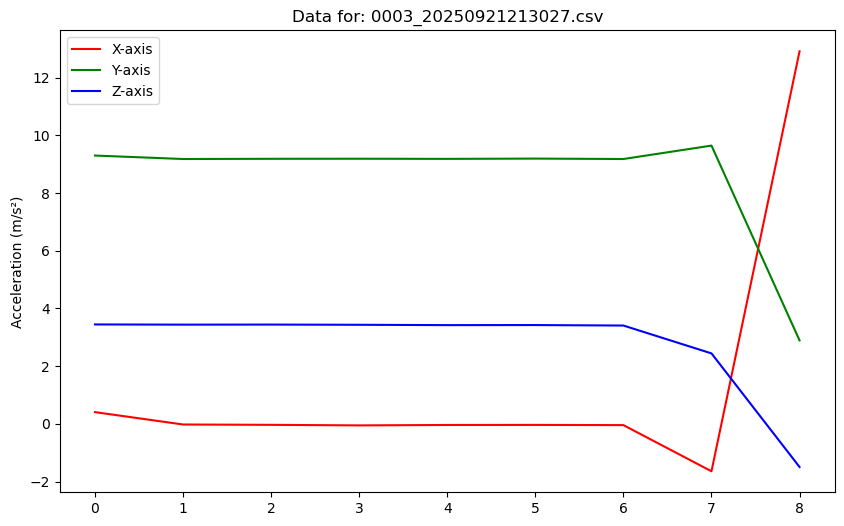

Enter label for 0003_20250921213027 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


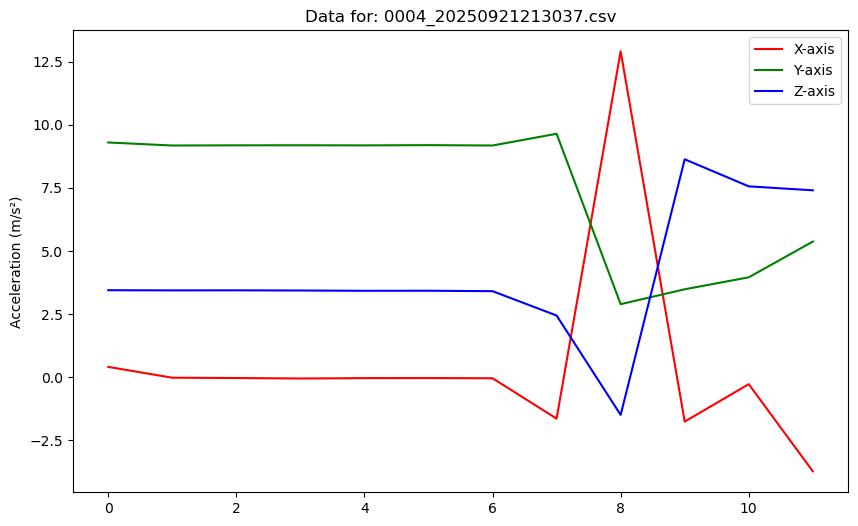

Enter label for 0004_20250921213037 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


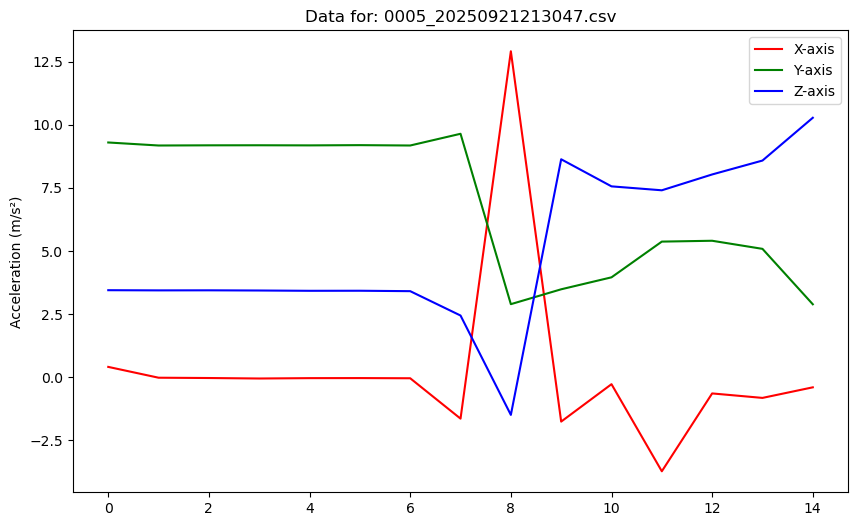

Enter label for 0005_20250921213047 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


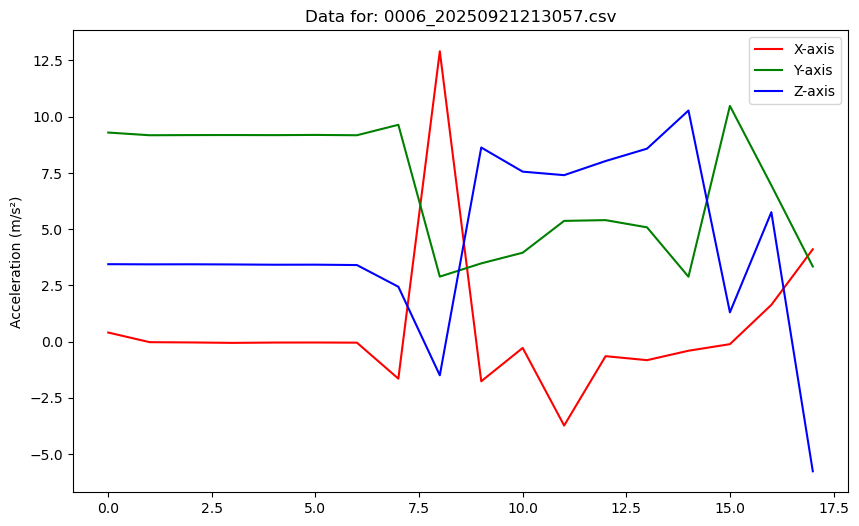

Enter label for 0006_20250921213057 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


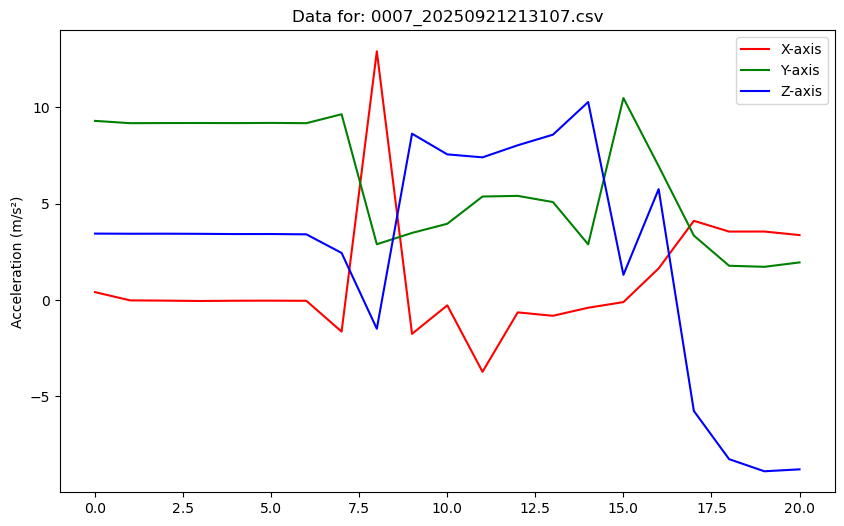

Enter label for 0007_20250921213107 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


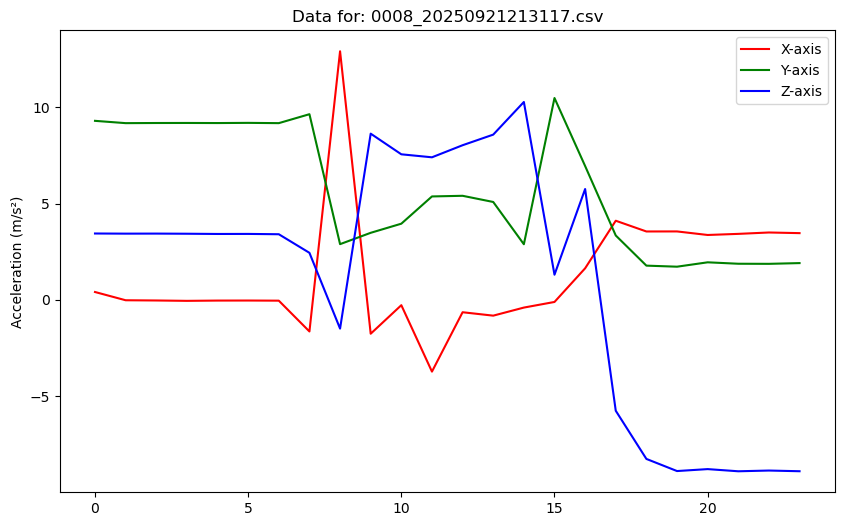

Enter label for 0008_20250921213117 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


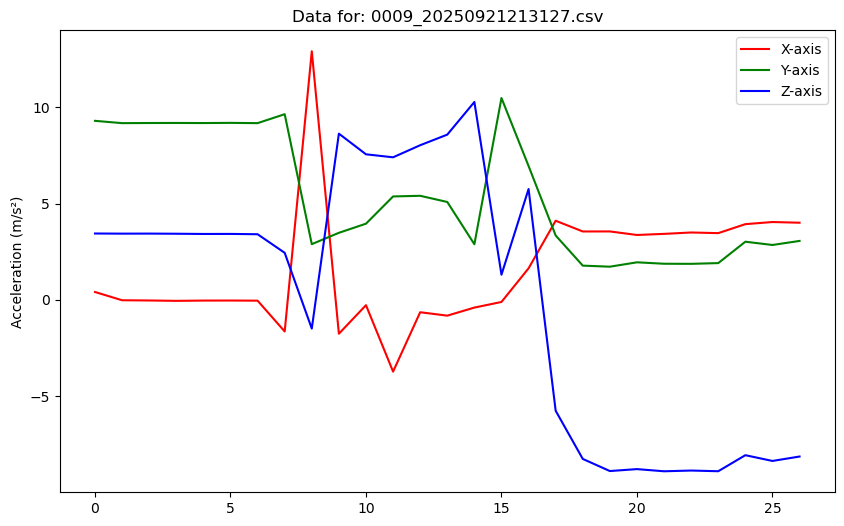

Enter label for 0009_20250921213127 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


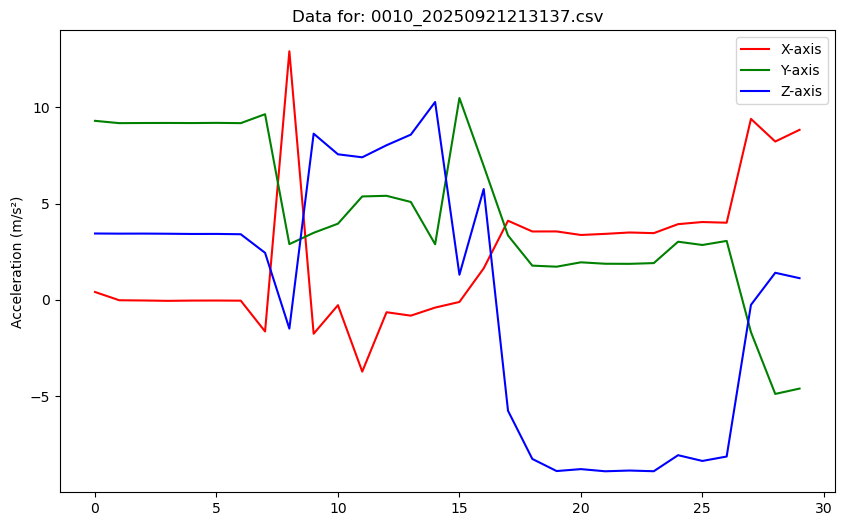

Enter label for 0010_20250921213137 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


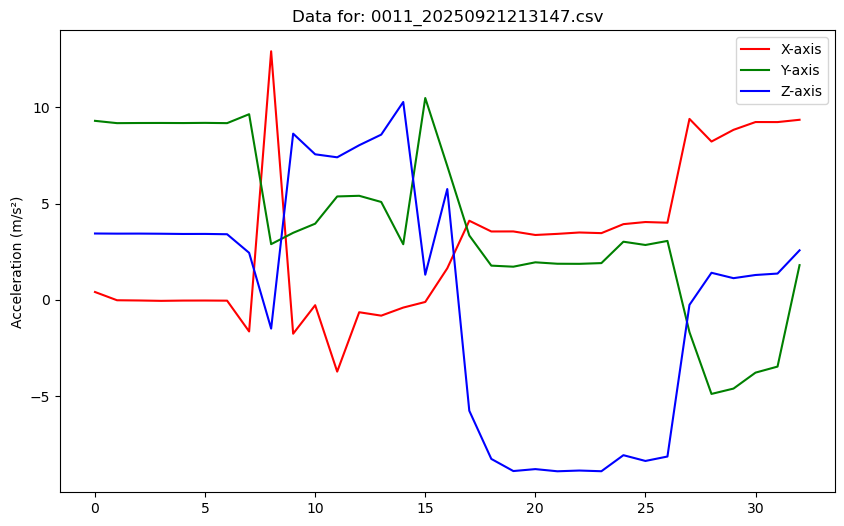

Enter label for 0011_20250921213147 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


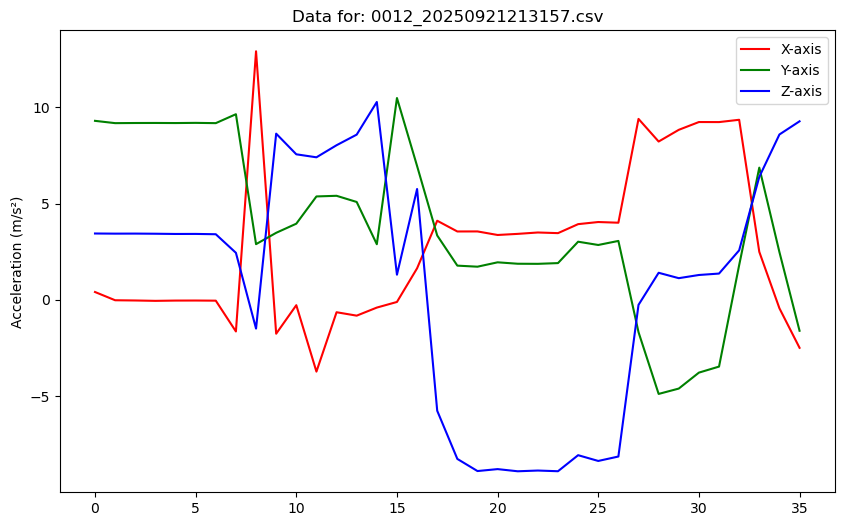

Enter label for 0012_20250921213157 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


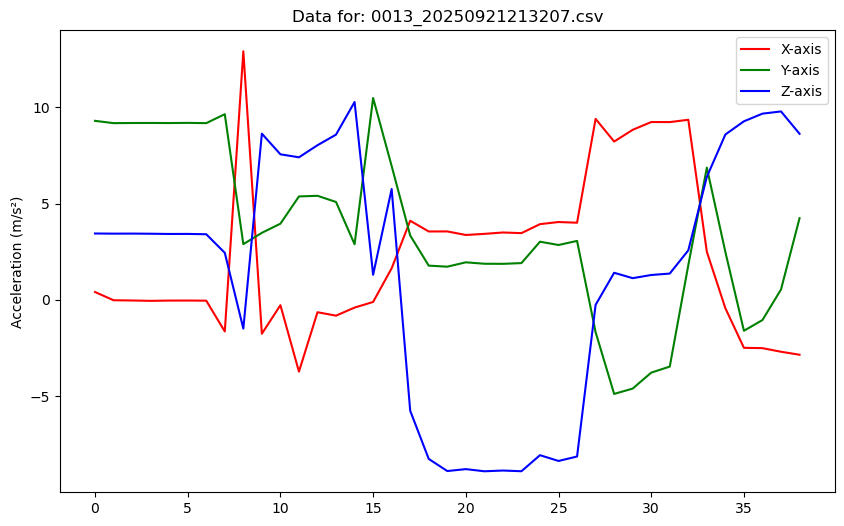

Enter label for 0013_20250921213207 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


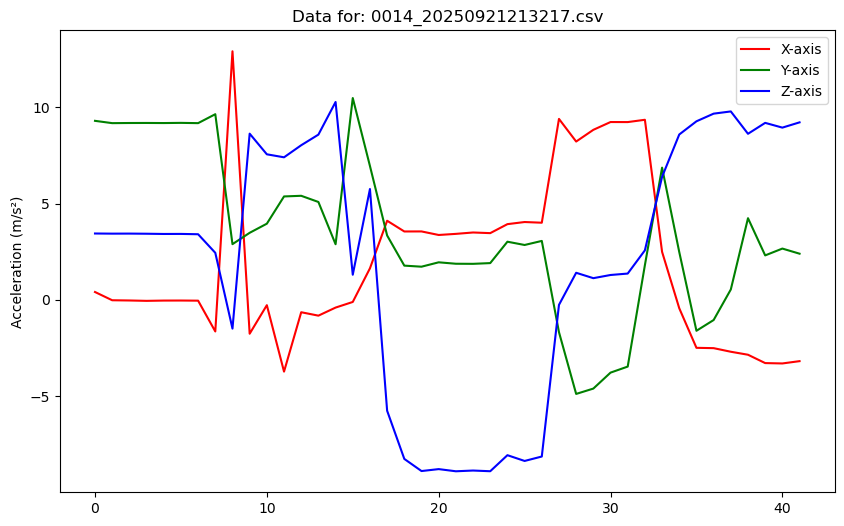

Enter label for 0014_20250921213217 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


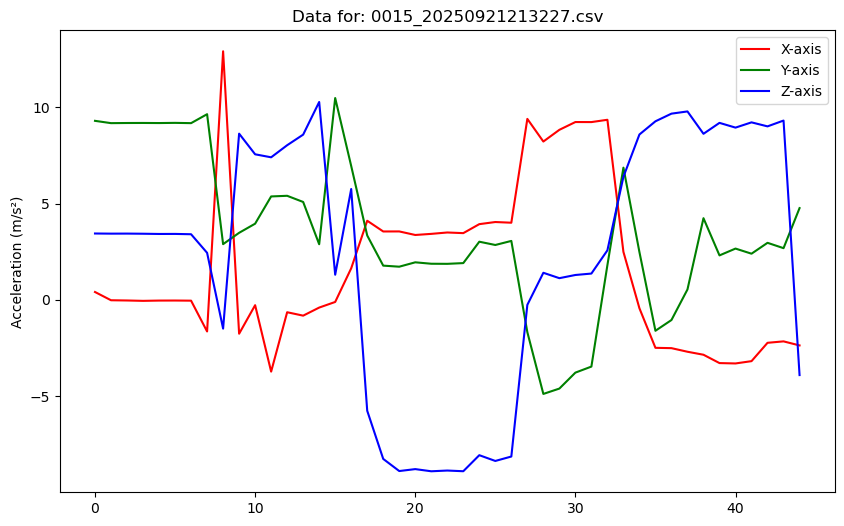

Enter label for 0015_20250921213227 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


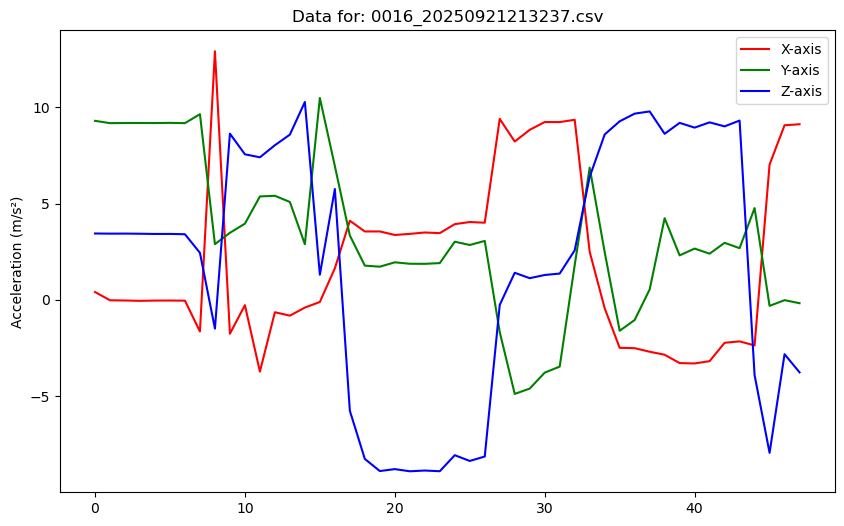

Enter label for 0016_20250921213237 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


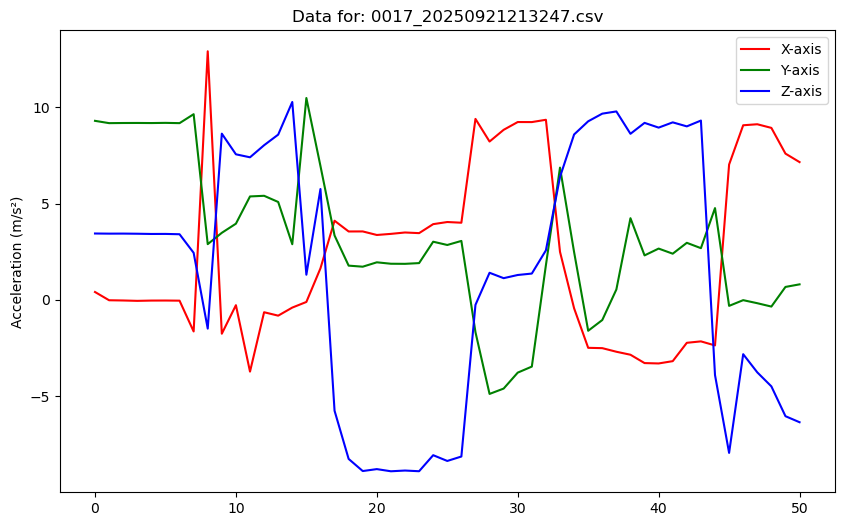

Enter label for 0017_20250921213247 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


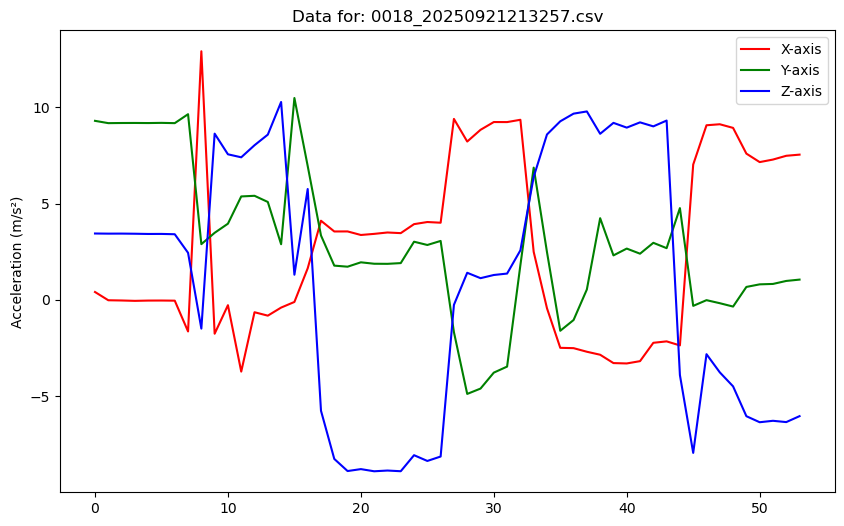

Enter label for 0018_20250921213257 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


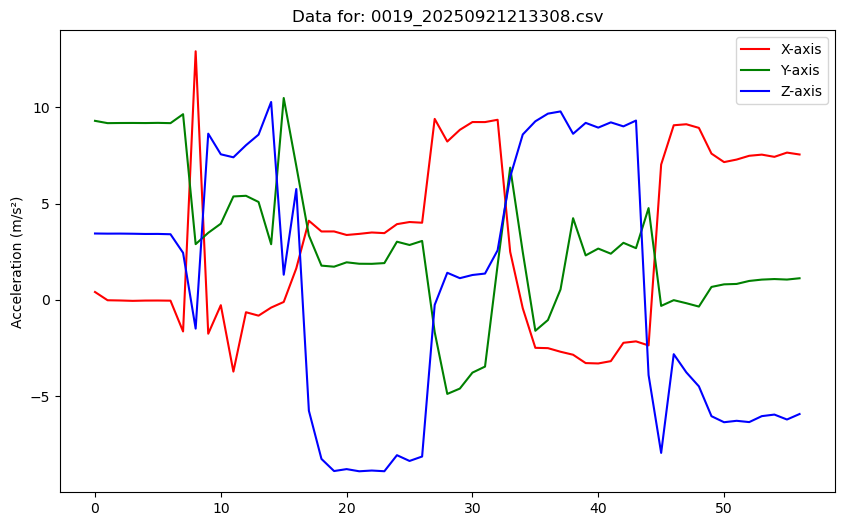

Enter label for 0019_20250921213308 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


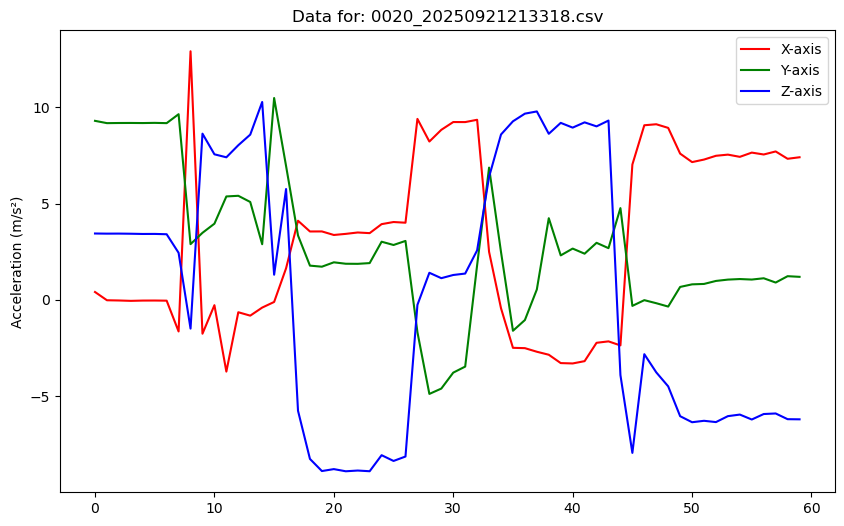

Enter label for 0020_20250921213318 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


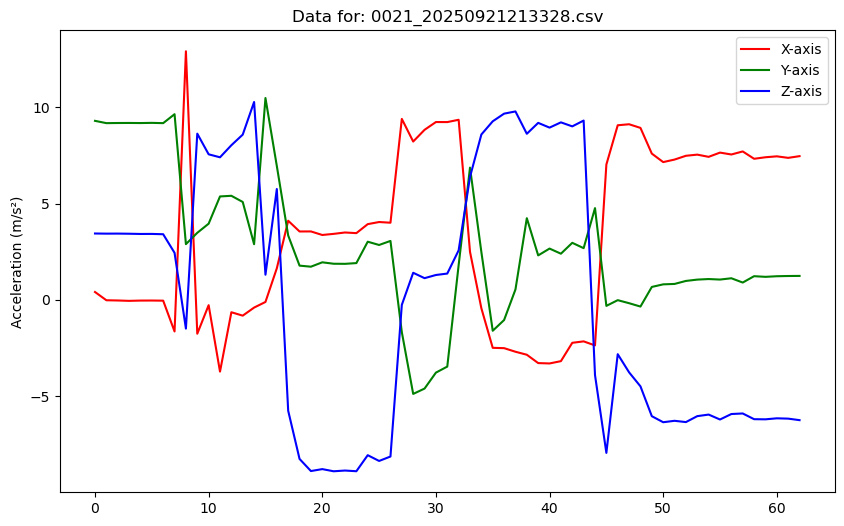

Enter label for 0021_20250921213328 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


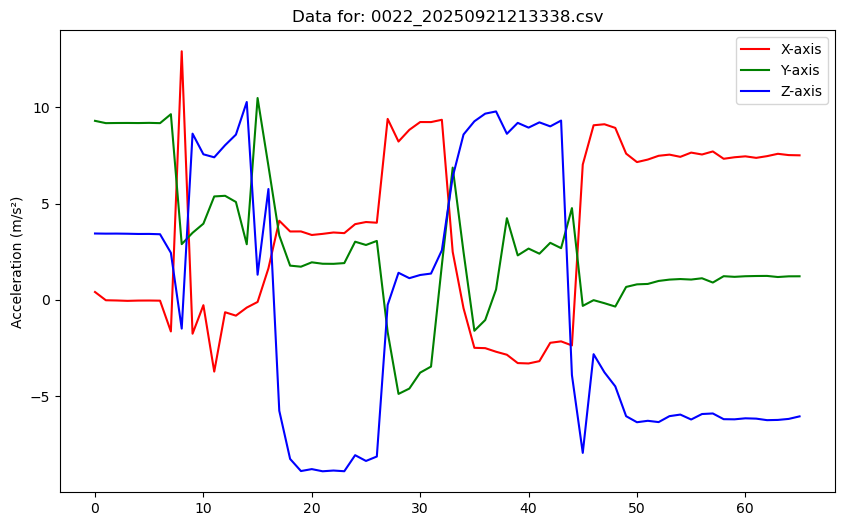

Enter label for 0022_20250921213338 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


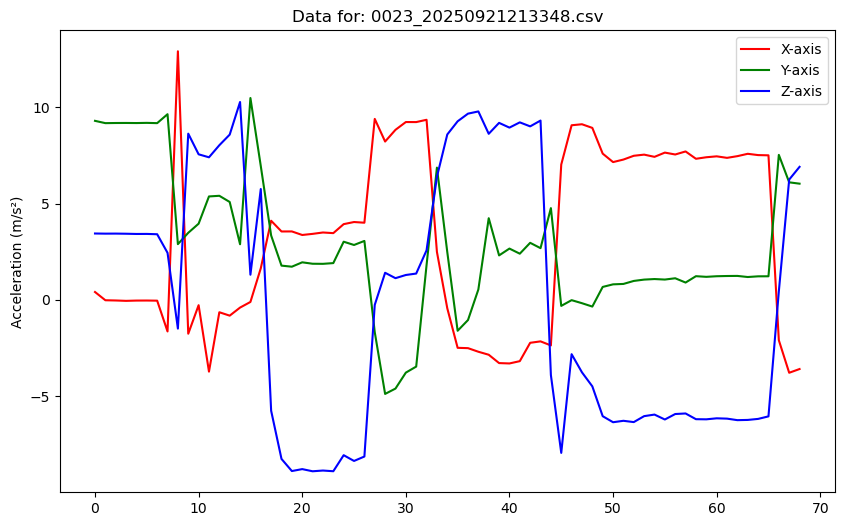

Enter label for 0023_20250921213348 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


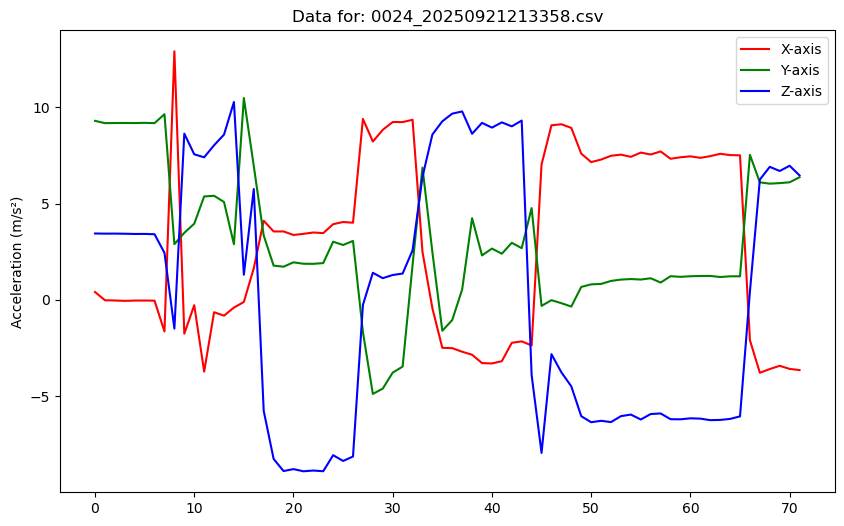

Enter label for 0024_20250921213358 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


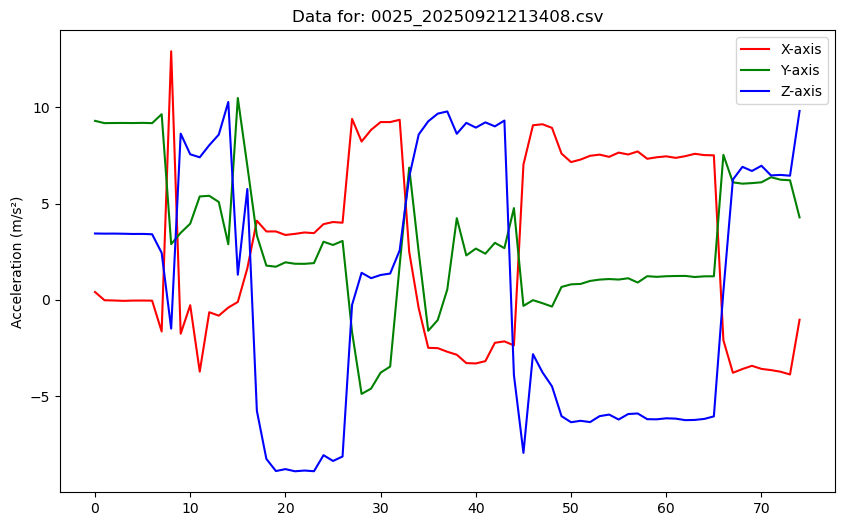

Enter label for 0025_20250921213408 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


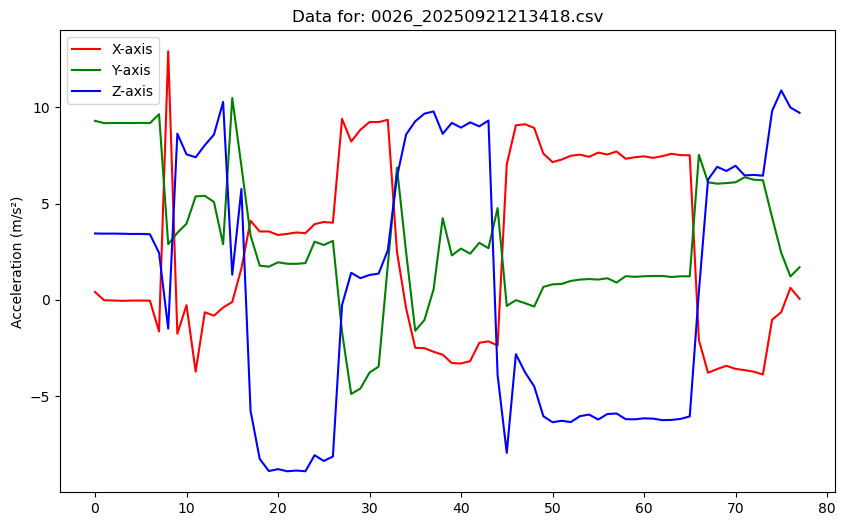

Enter label for 0026_20250921213418 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


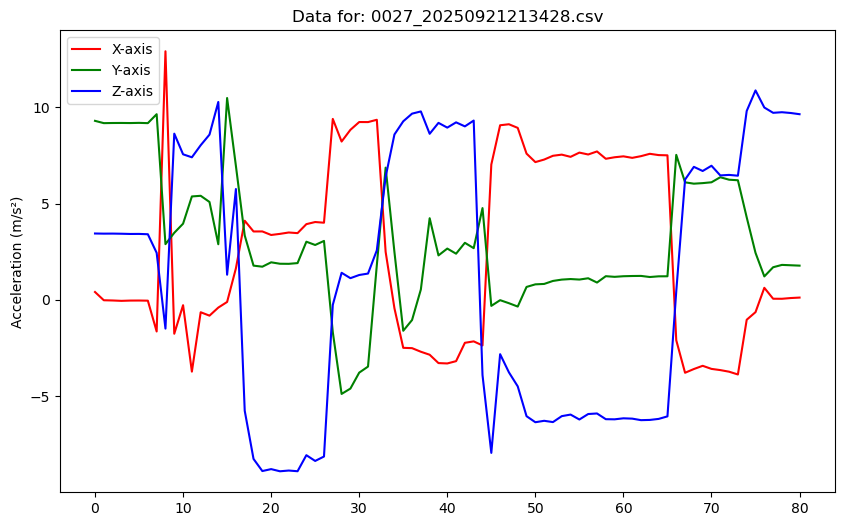

Enter label for 0027_20250921213428 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


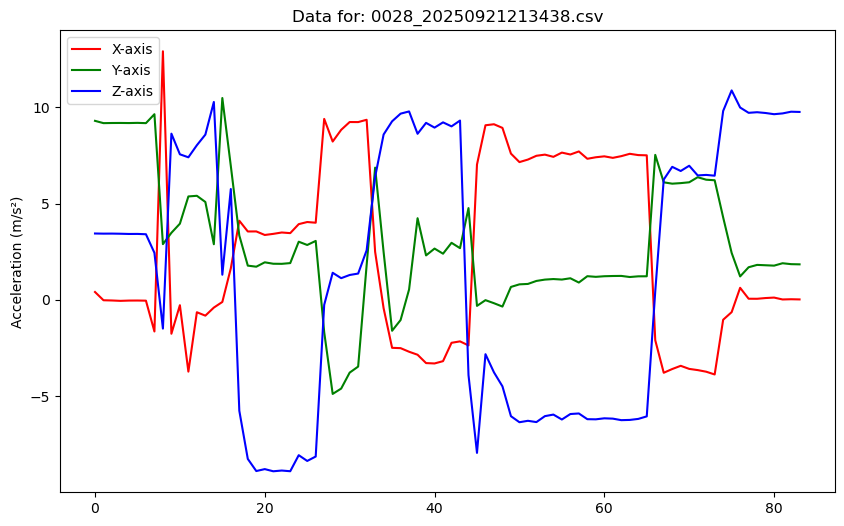

Enter label for 0028_20250921213438 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


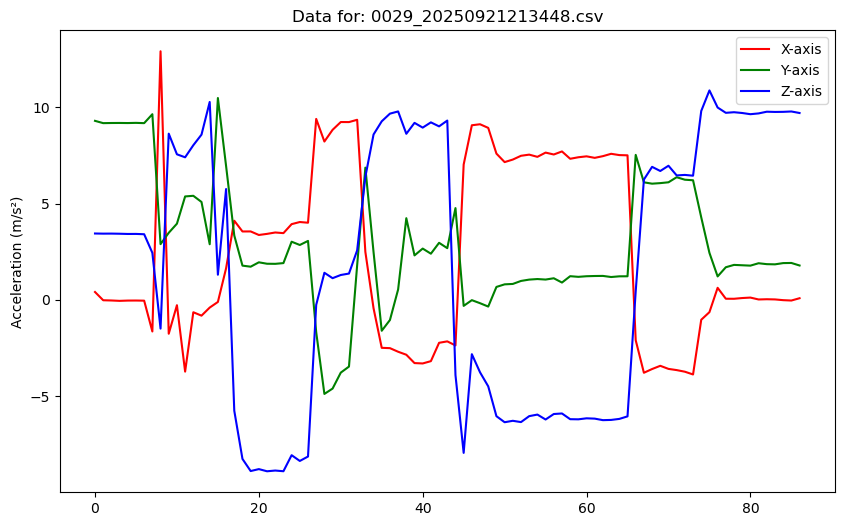

Enter label for 0029_20250921213448 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


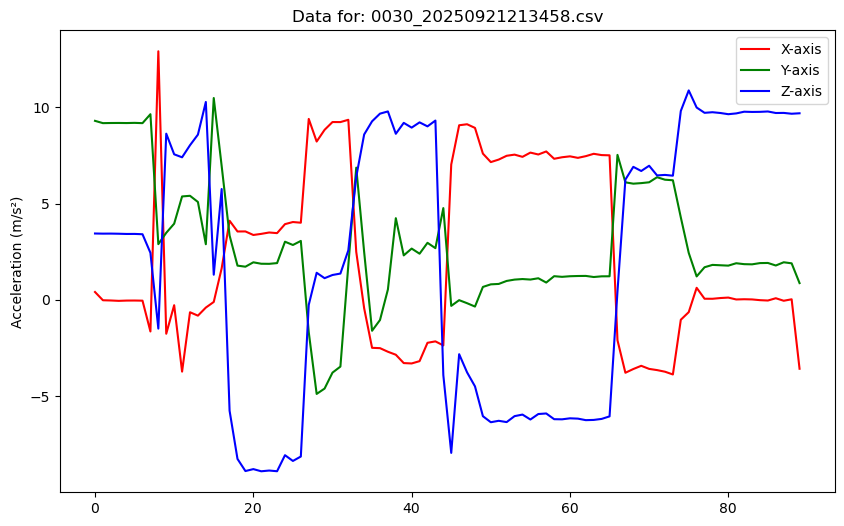

Enter label for 0030_20250921213458 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


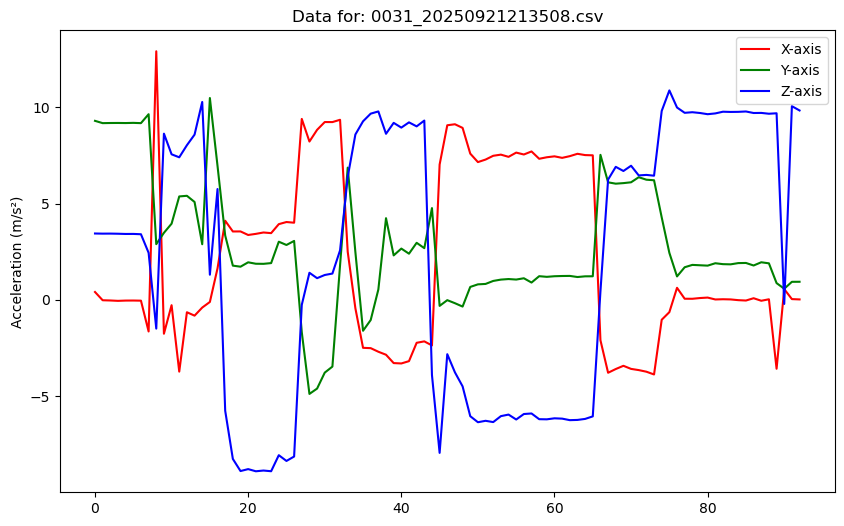

Enter label for 0031_20250921213508 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


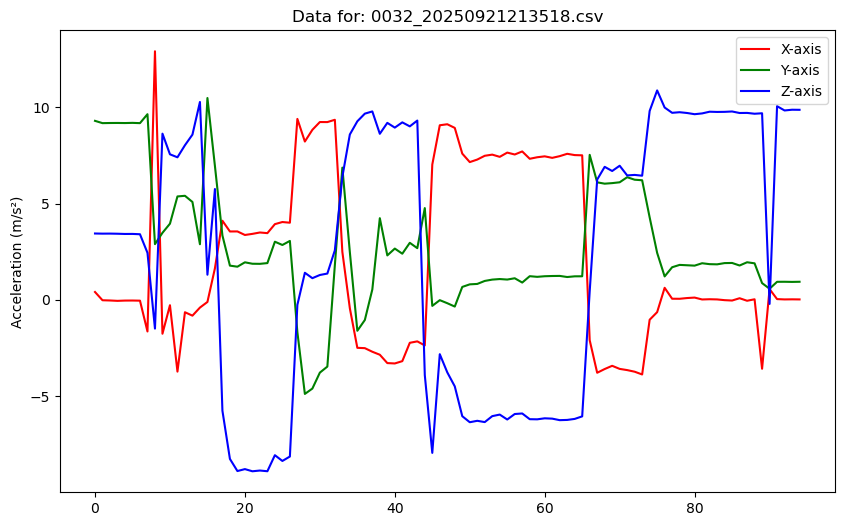

Enter label for 0032_20250921213518 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


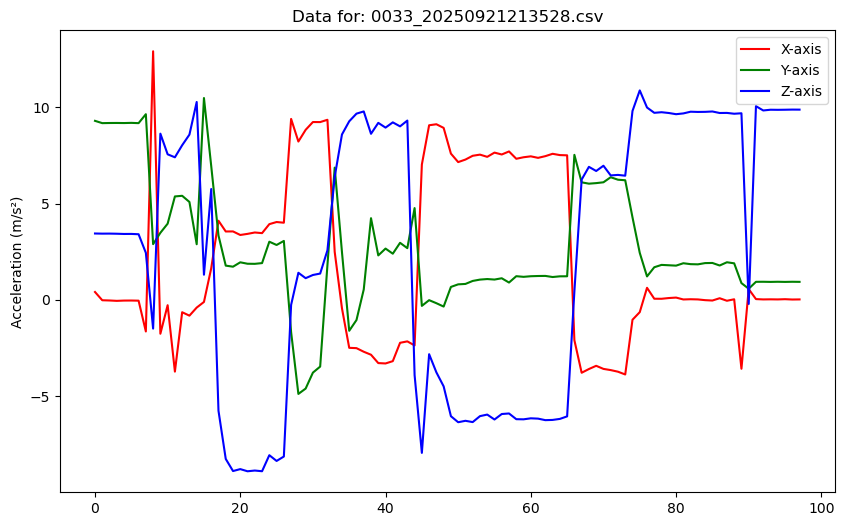

Enter label for 0033_20250921213528 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


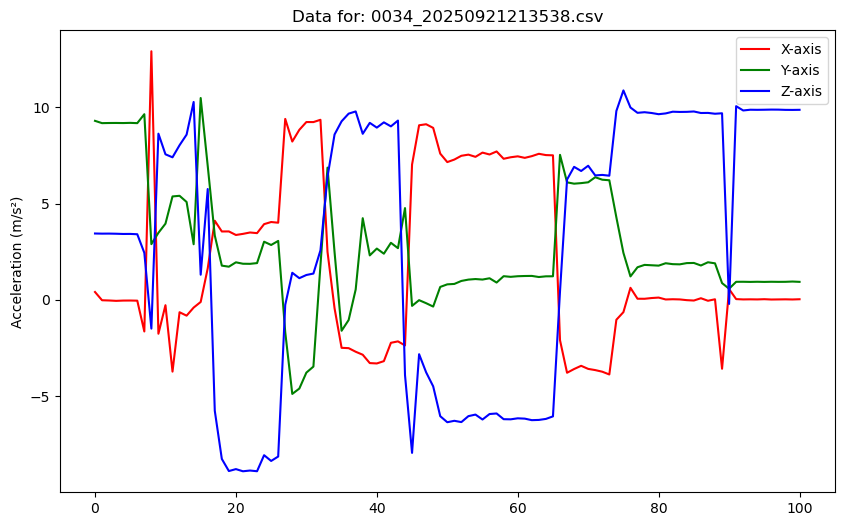

Enter label for 0034_20250921213538 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


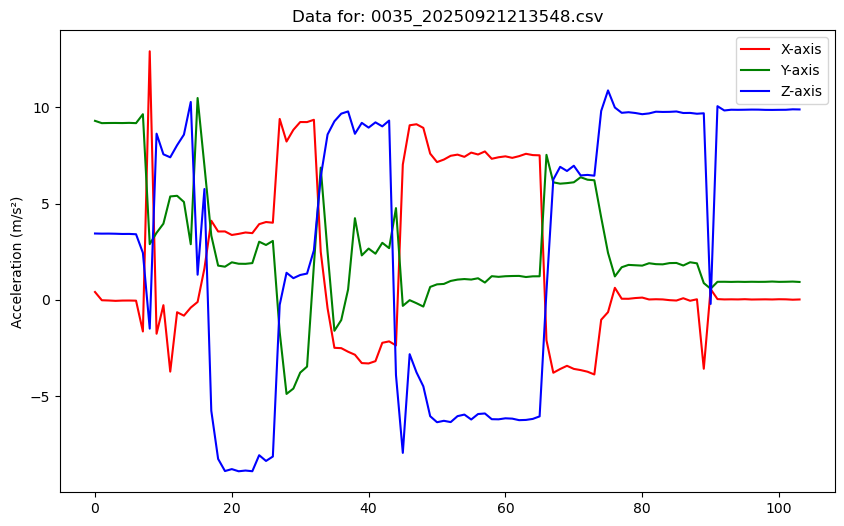

Enter label for 0035_20250921213548 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


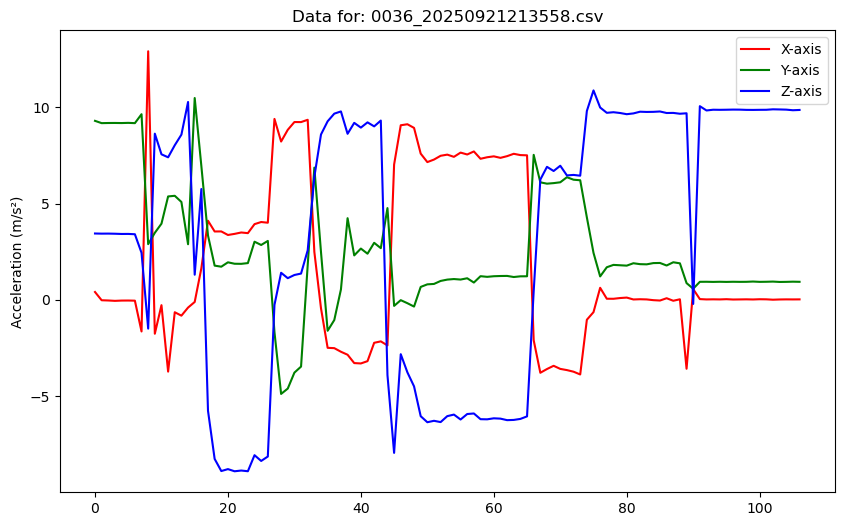

Enter label for 0036_20250921213558 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


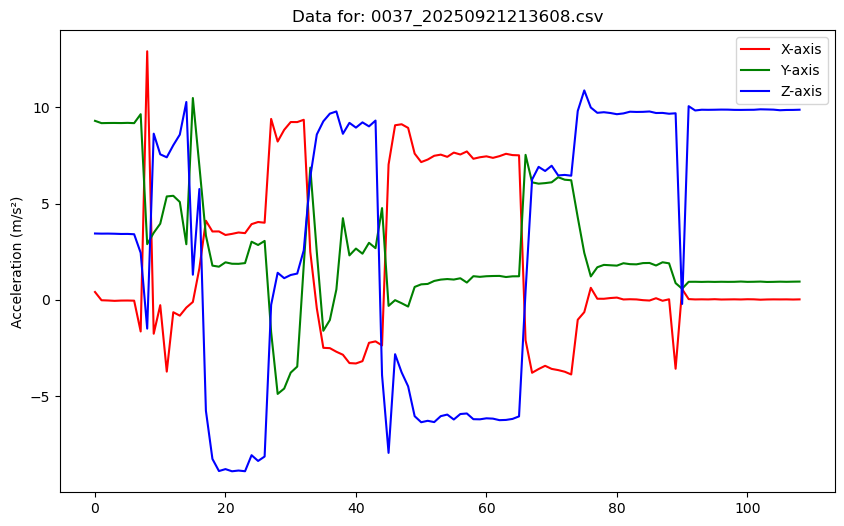

Enter label for 0037_20250921213608 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


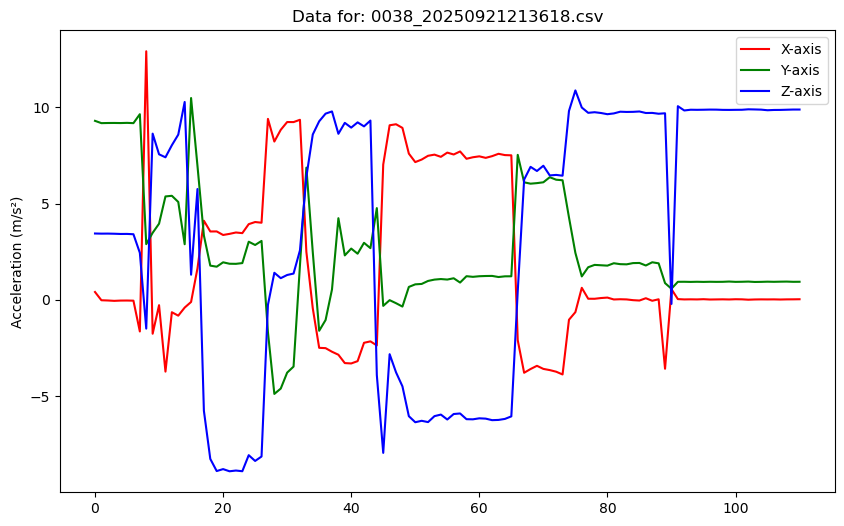

Enter label for 0038_20250921213618 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


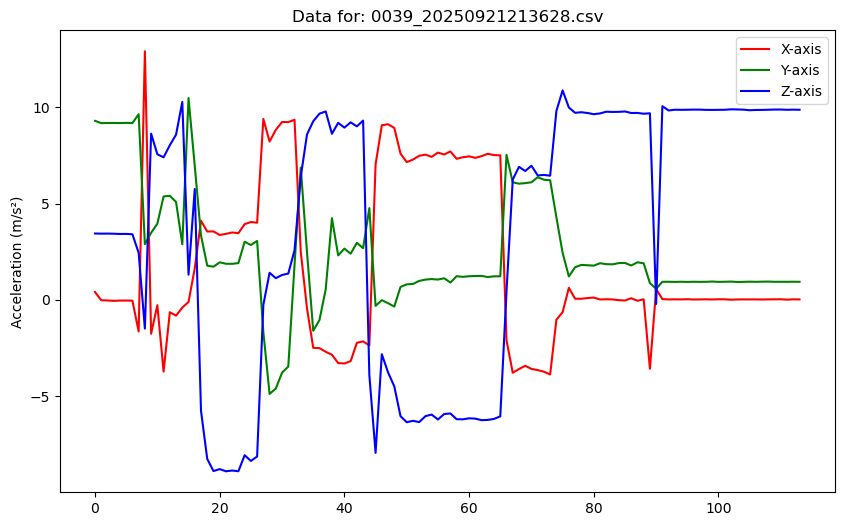

Enter label for 0039_20250921213628 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


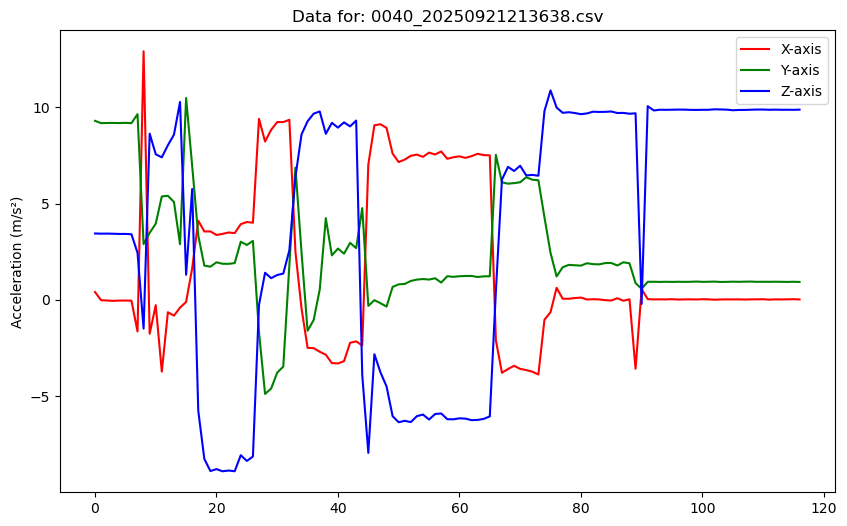

Enter label for 0040_20250921213638 (0, 1, 2, s, q):  


  Invalid input. Please enter 0, 1, 2, s, or q.


Enter label for 0040_20250921213638 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


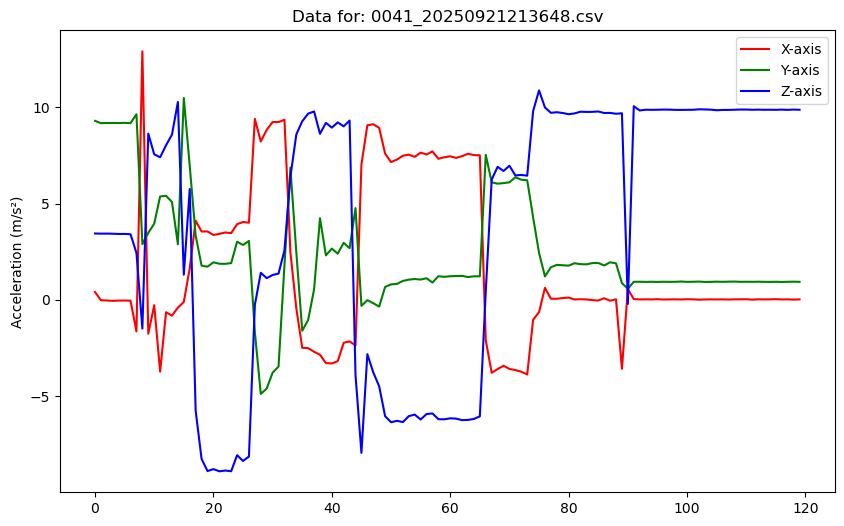

Enter label for 0041_20250921213648 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


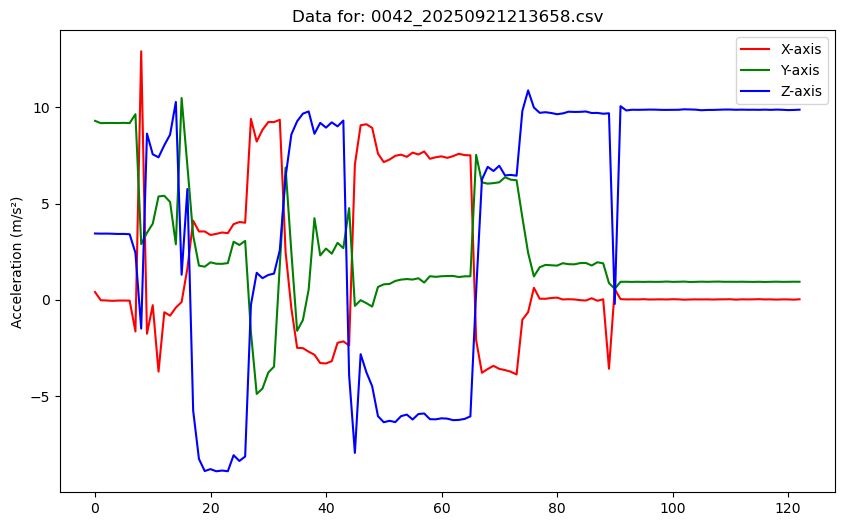

Enter label for 0042_20250921213658 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


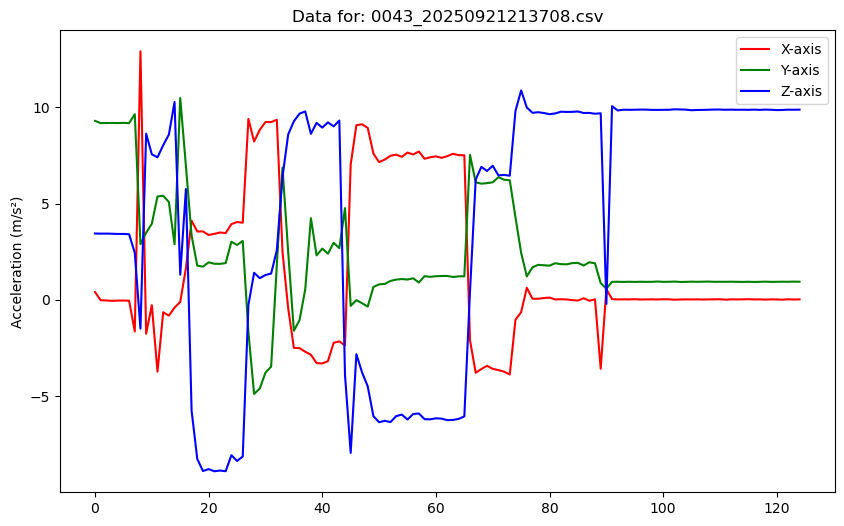

Enter label for 0043_20250921213708 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


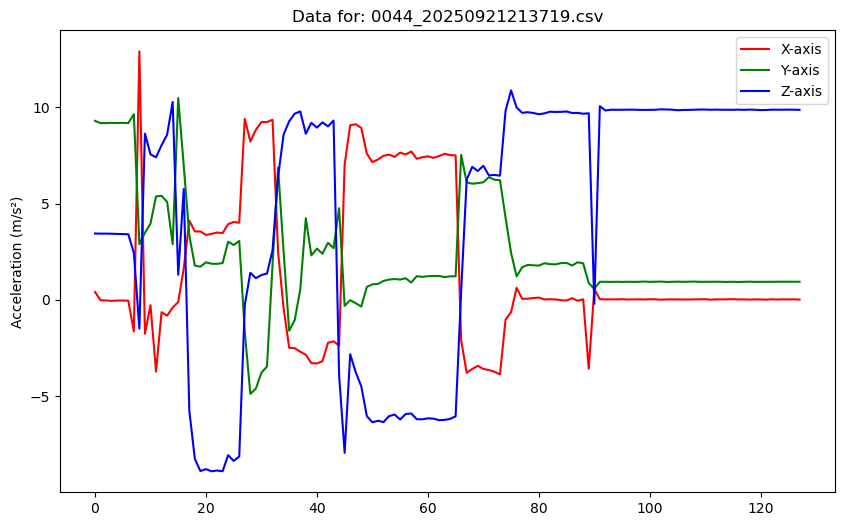

Enter label for 0044_20250921213719 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


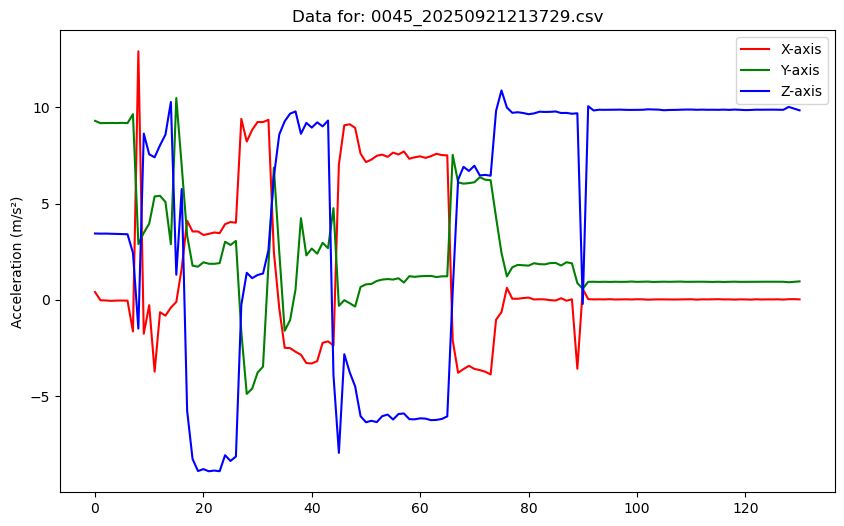

Enter label for 0045_20250921213729 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


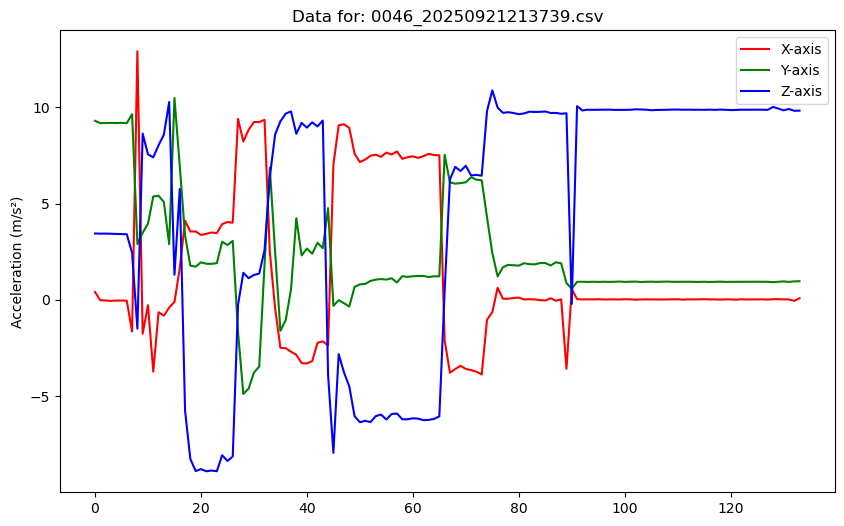

Enter label for 0046_20250921213739 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


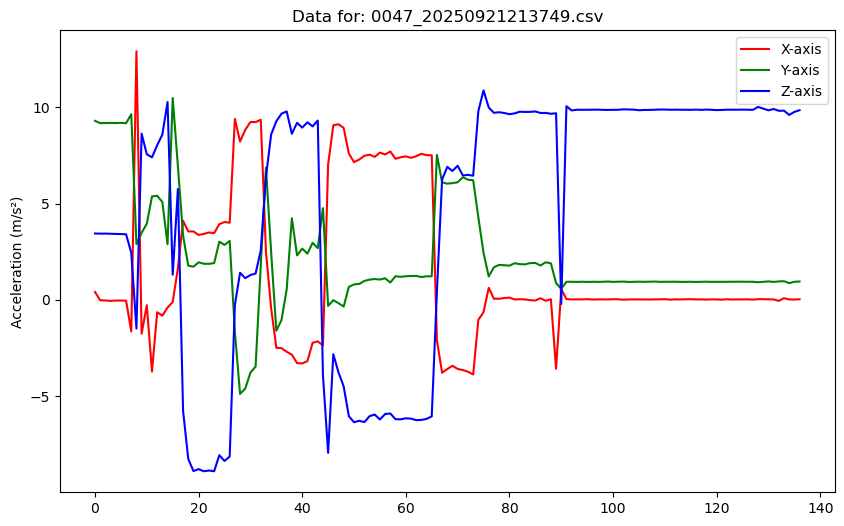

Enter label for 0047_20250921213749 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


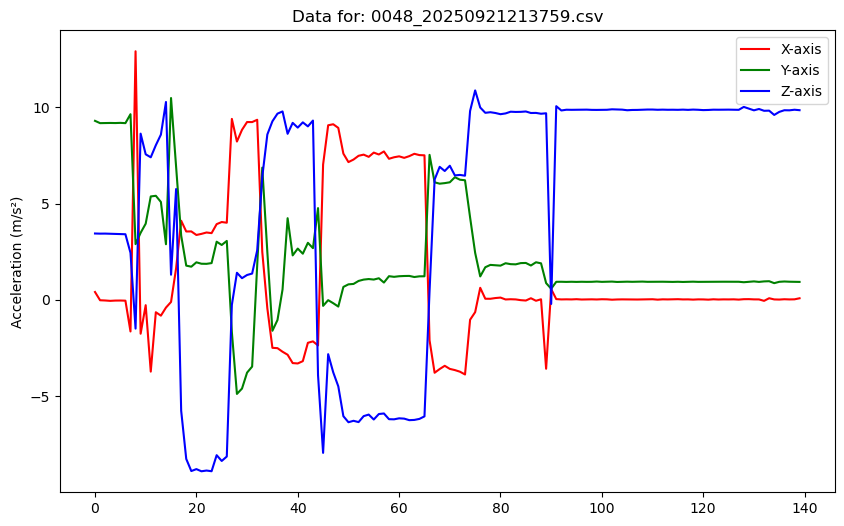

Enter label for 0048_20250921213759 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


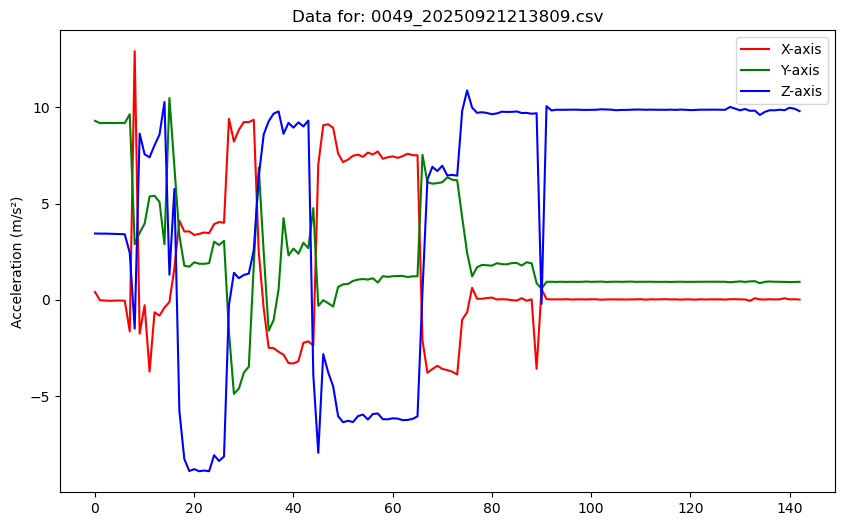

Enter label for 0049_20250921213809 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


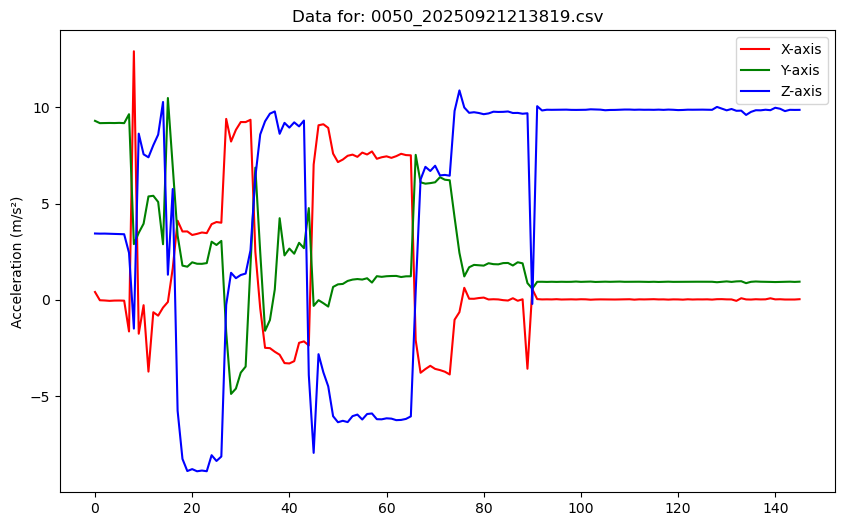

Enter label for 0050_20250921213819 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


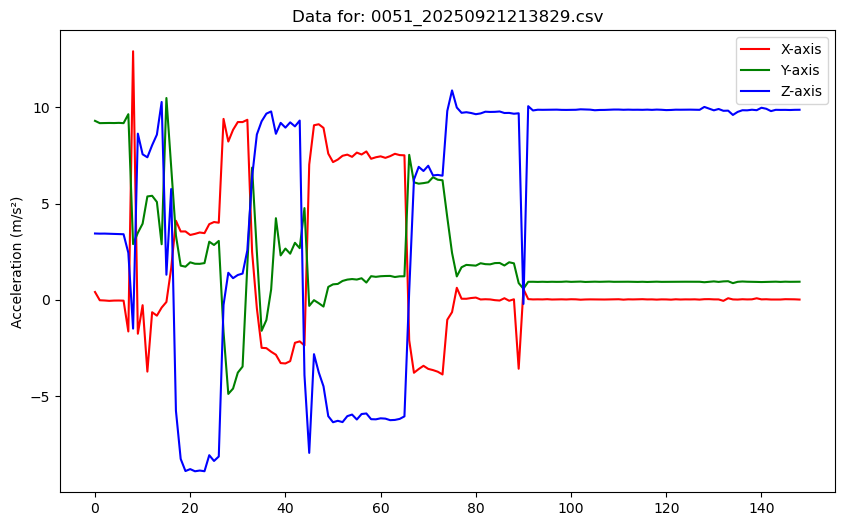

Enter label for 0051_20250921213829 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


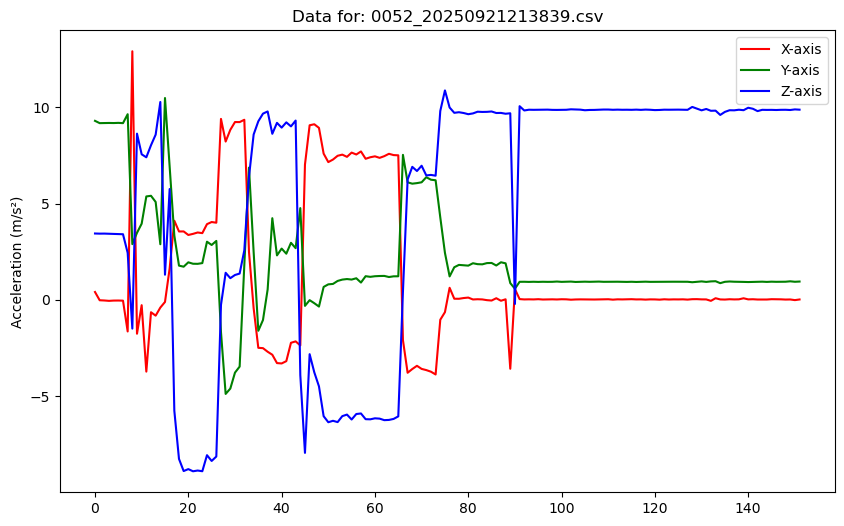

Enter label for 0052_20250921213839 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


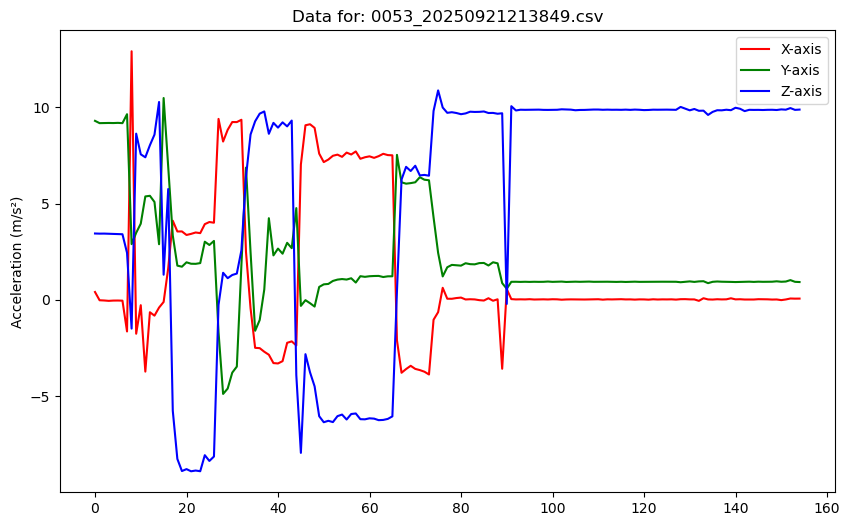

Enter label for 0053_20250921213849 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


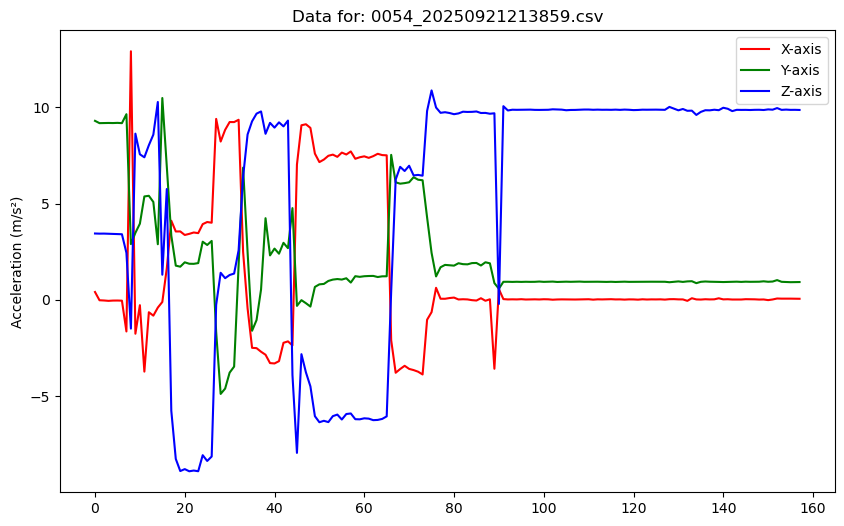

Enter label for 0054_20250921213859 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


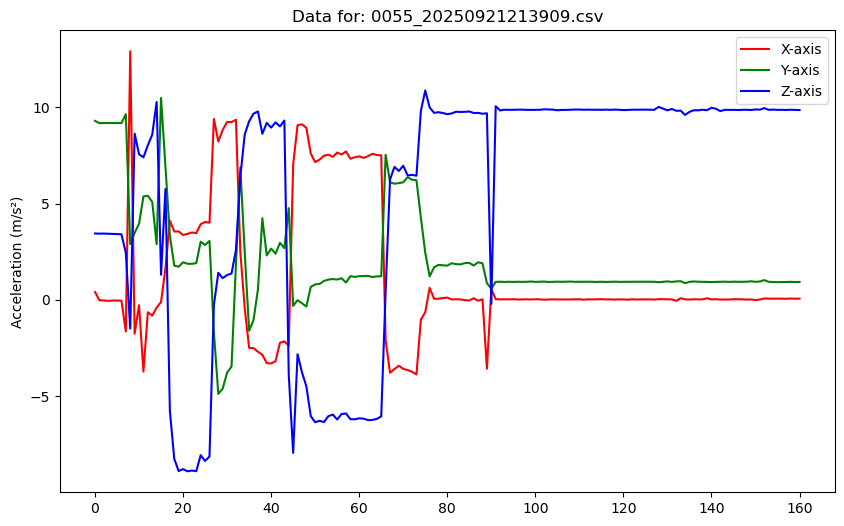

Enter label for 0055_20250921213909 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


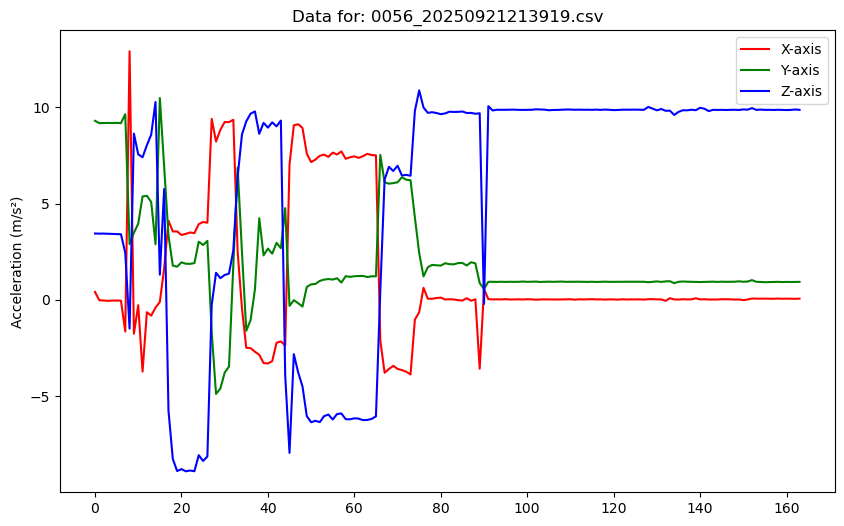

Enter label for 0056_20250921213919 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


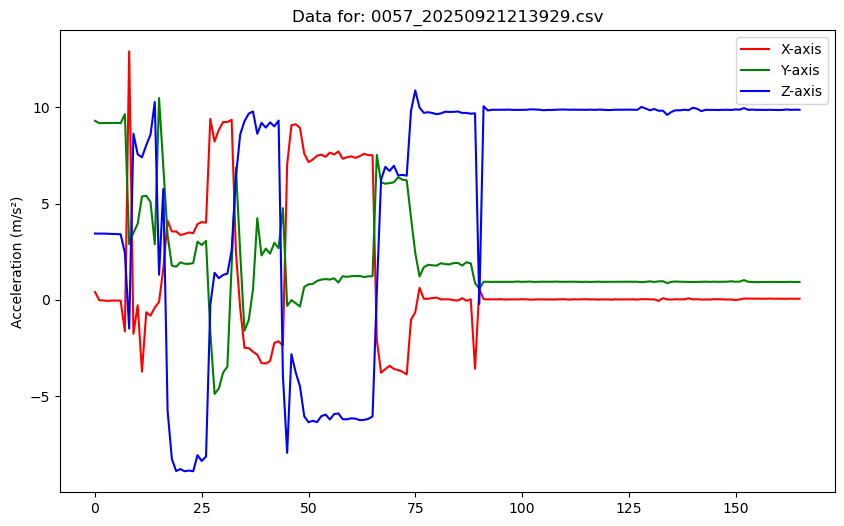

Enter label for 0057_20250921213929 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


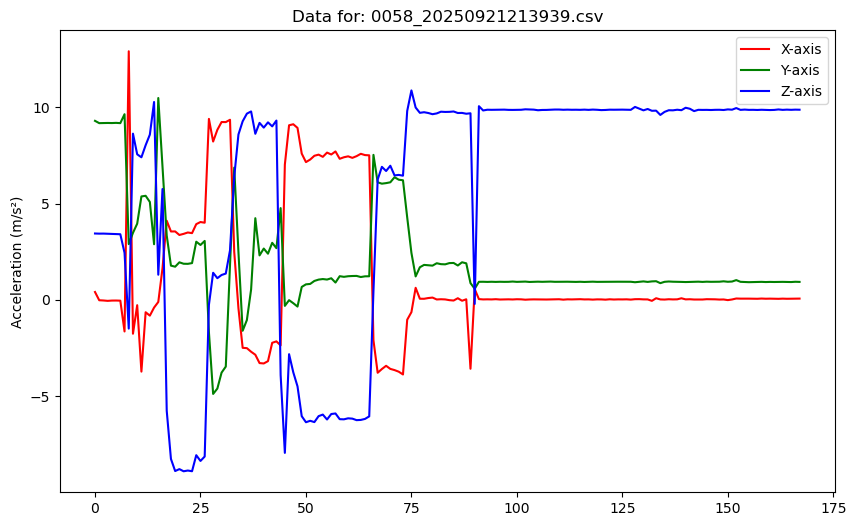

Enter label for 0058_20250921213939 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


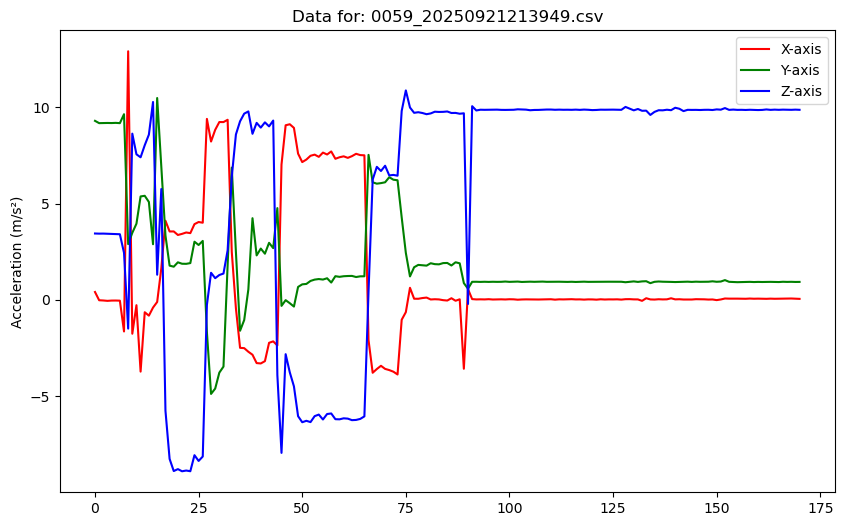

Enter label for 0059_20250921213949 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


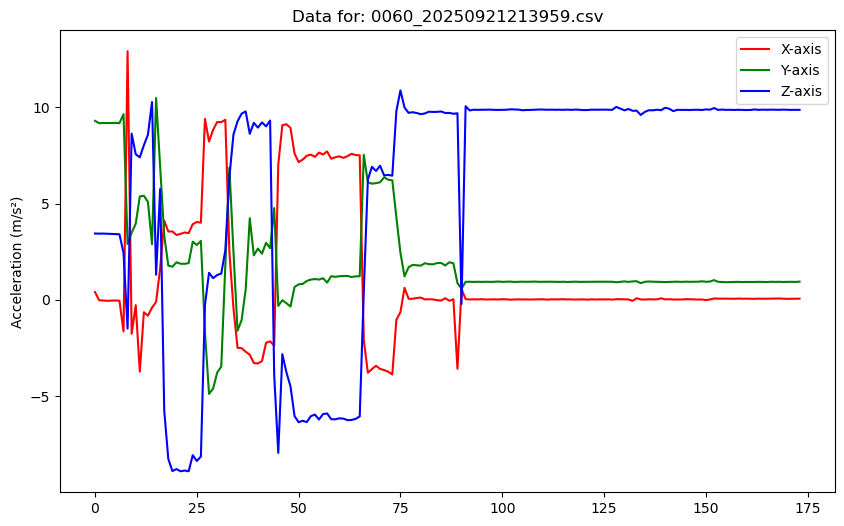

Enter label for 0060_20250921213959 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


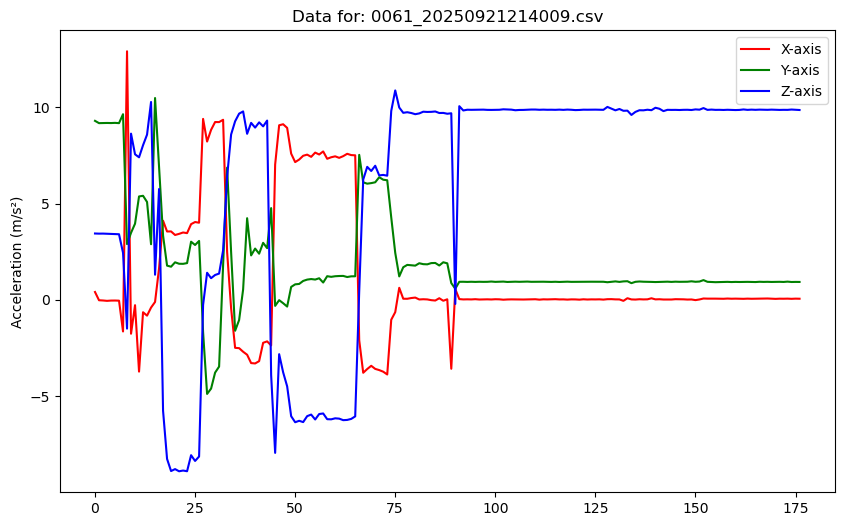

Enter label for 0061_20250921214009 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


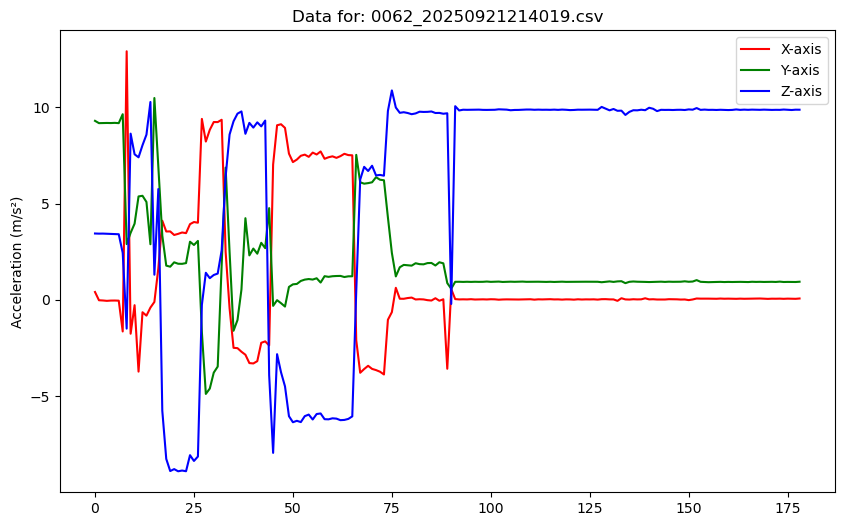

Enter label for 0062_20250921214019 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


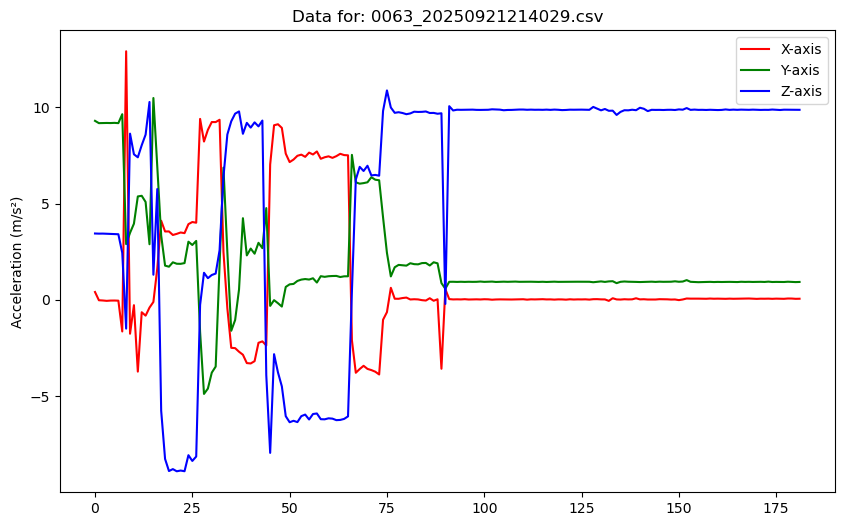

Enter label for 0063_20250921214029 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


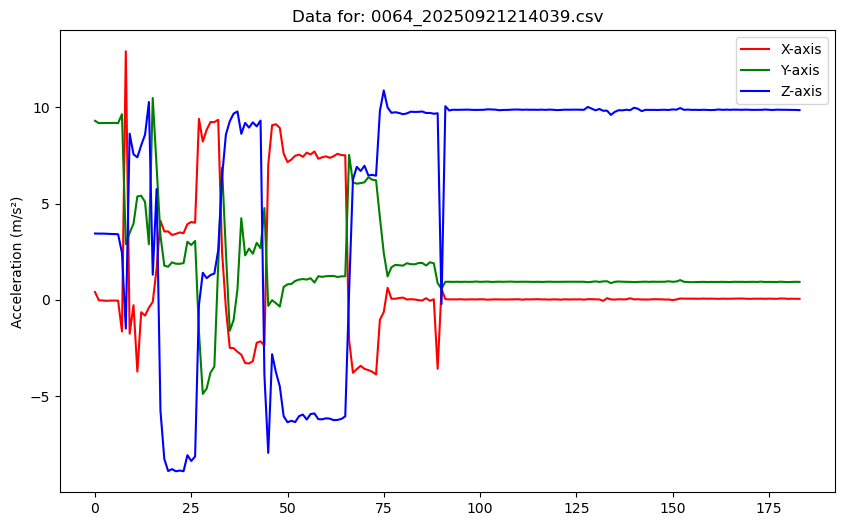

Enter label for 0064_20250921214039 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


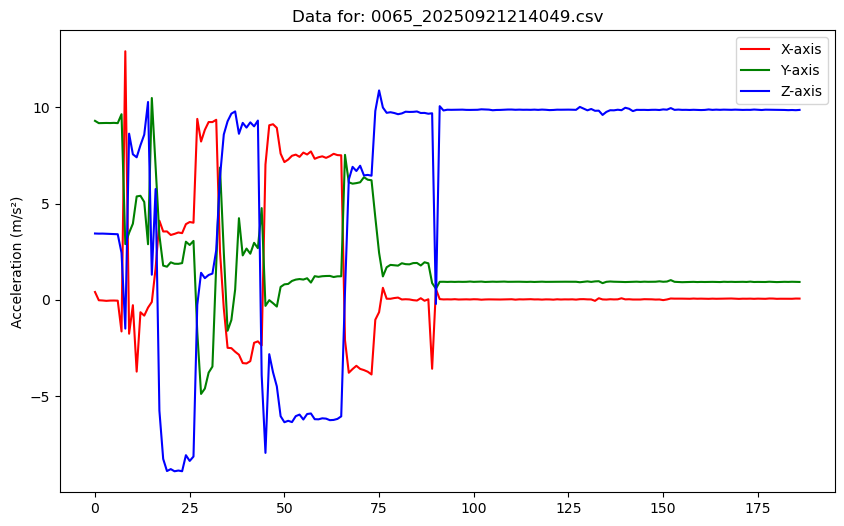

Enter label for 0065_20250921214049 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


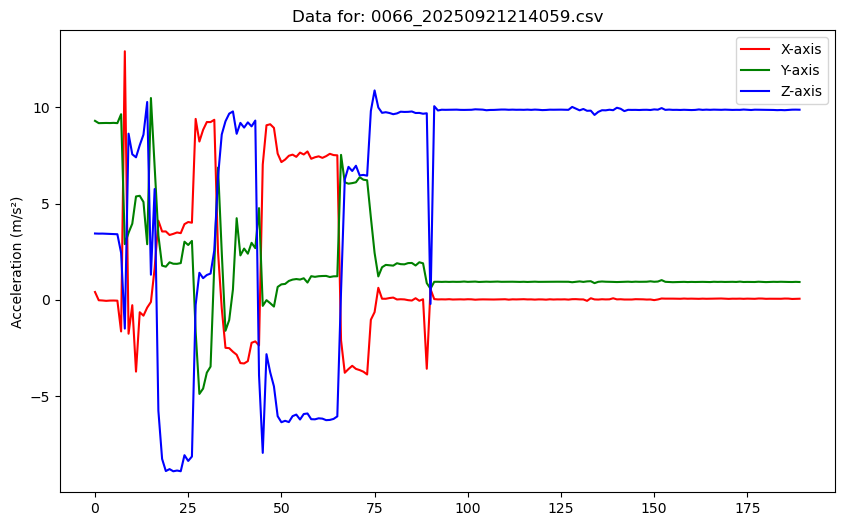

Enter label for 0066_20250921214059 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


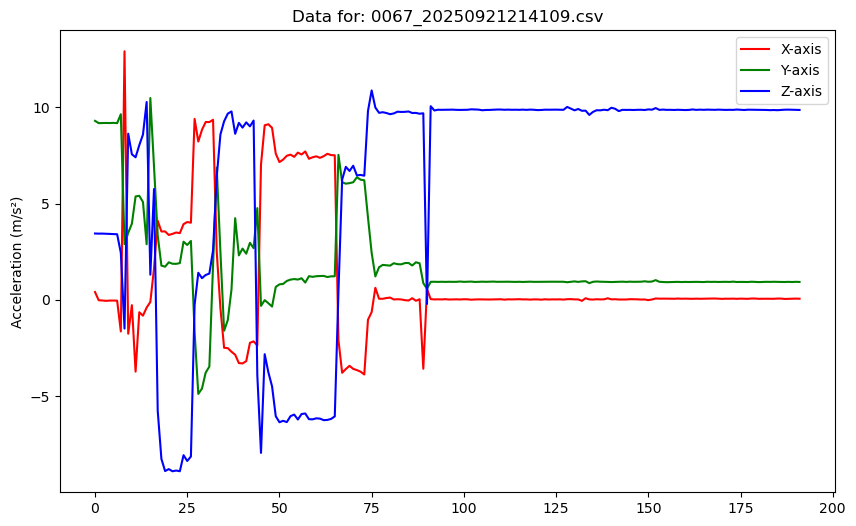

Enter label for 0067_20250921214109 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


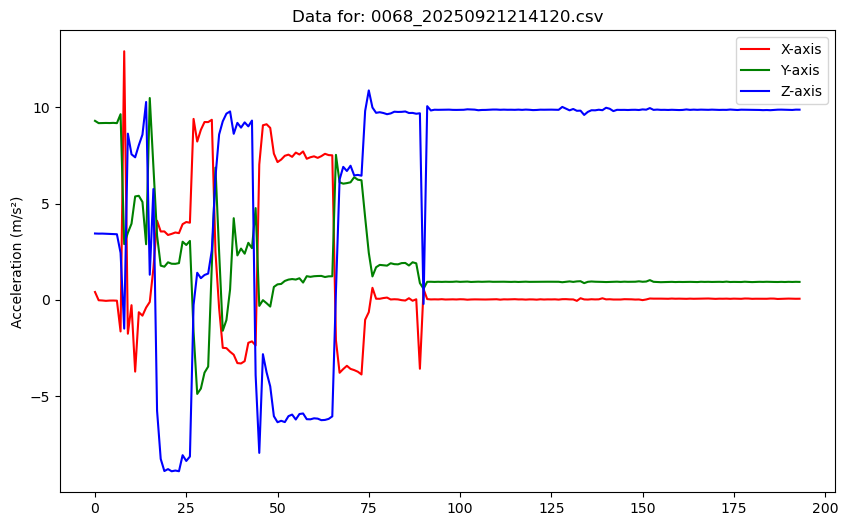

Enter label for 0068_20250921214120 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


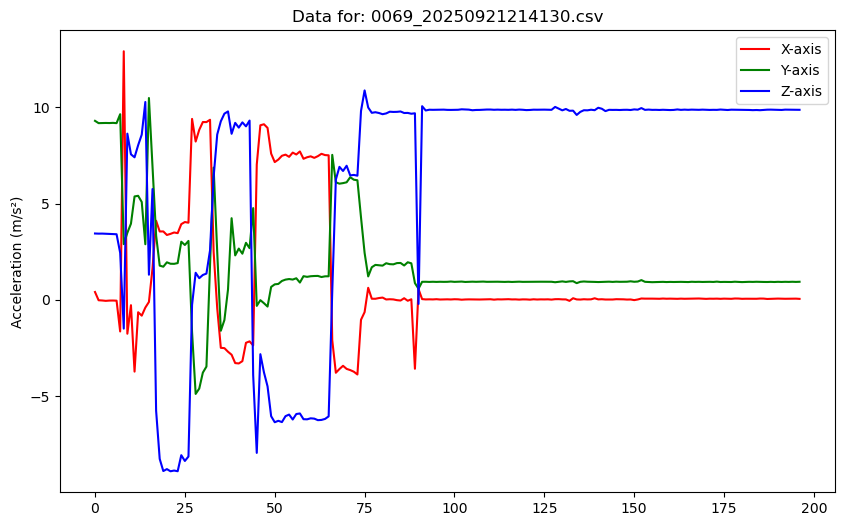

Enter label for 0069_20250921214130 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


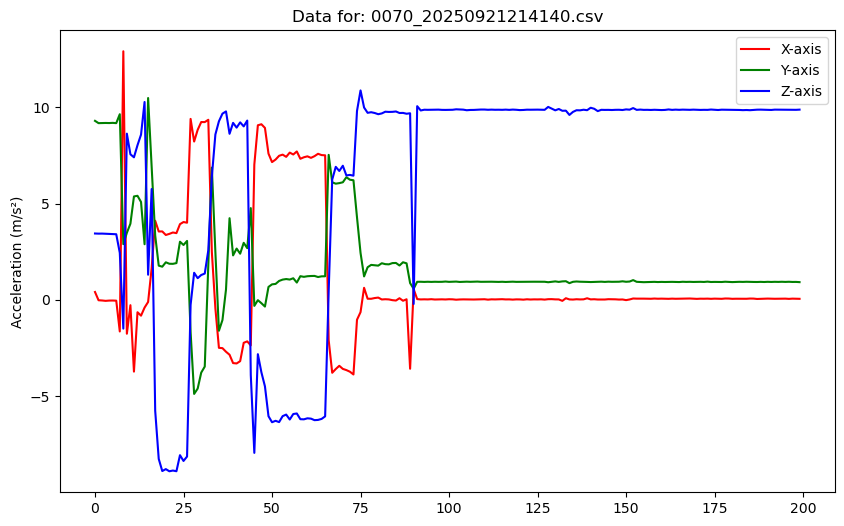

Enter label for 0070_20250921214140 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


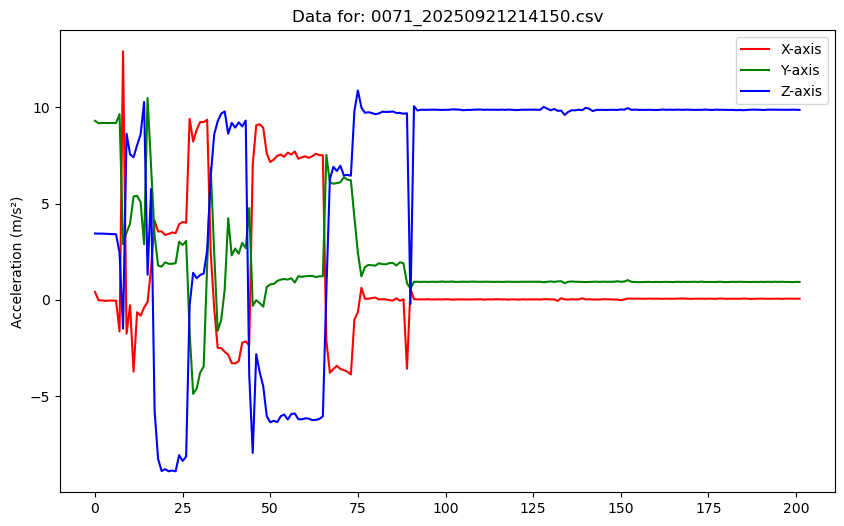

Enter label for 0071_20250921214150 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


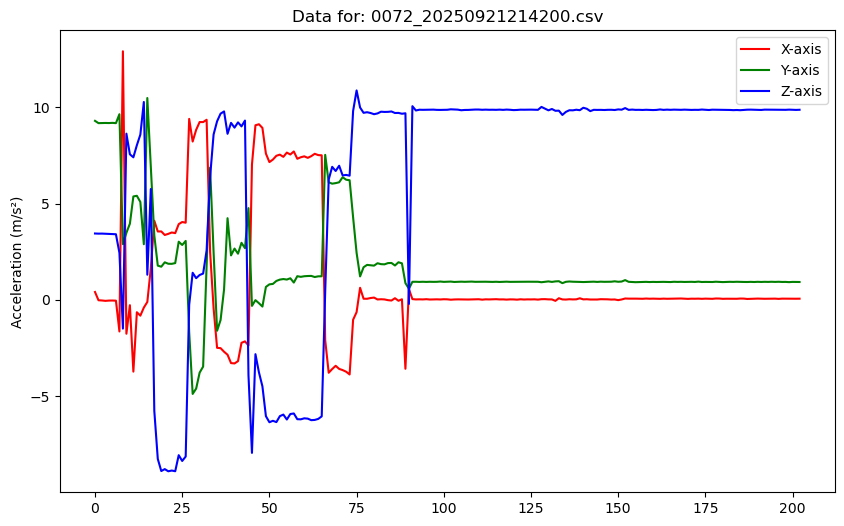

Enter label for 0072_20250921214200 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


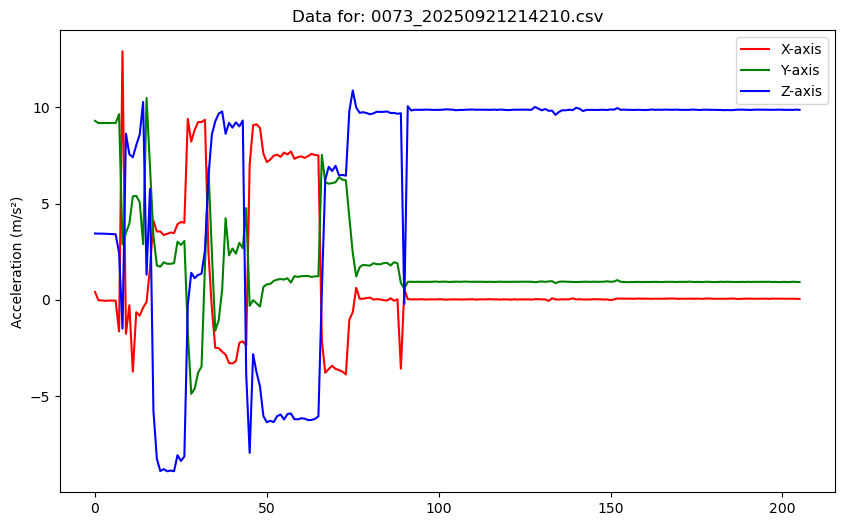

Enter label for 0073_20250921214210 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


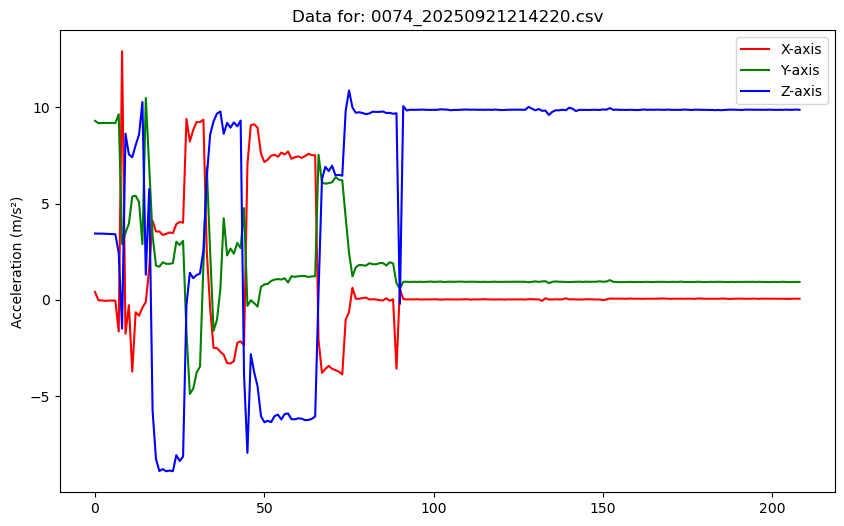

Enter label for 0074_20250921214220 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


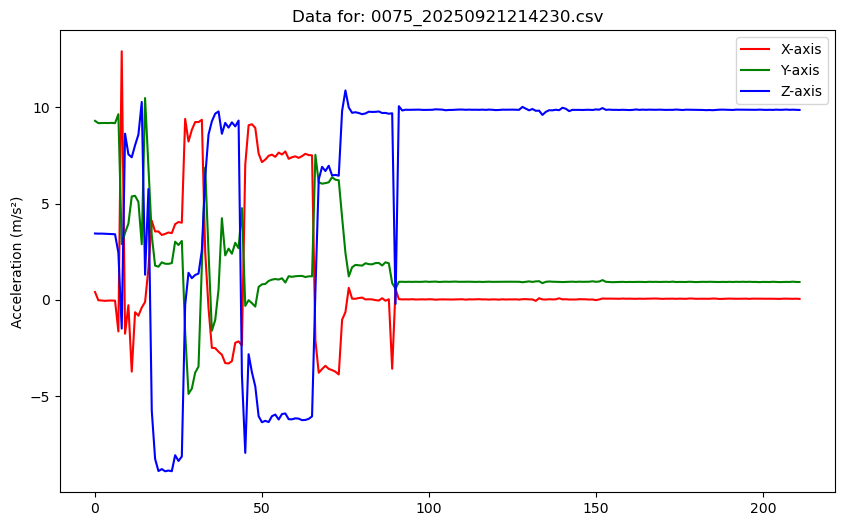

Enter label for 0075_20250921214230 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


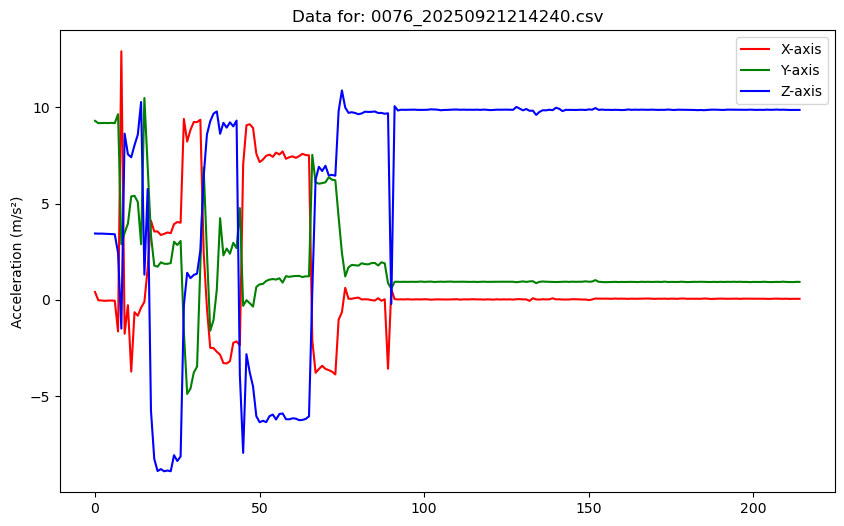

Enter label for 0076_20250921214240 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


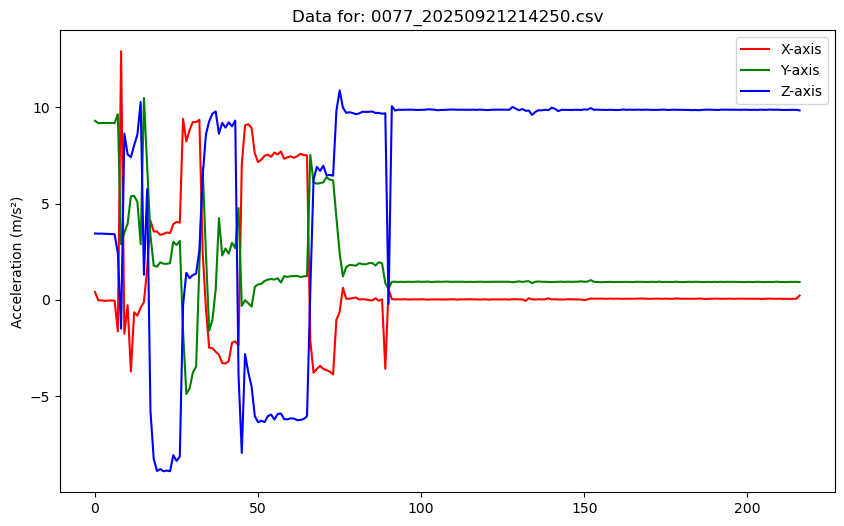

Enter label for 0077_20250921214250 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


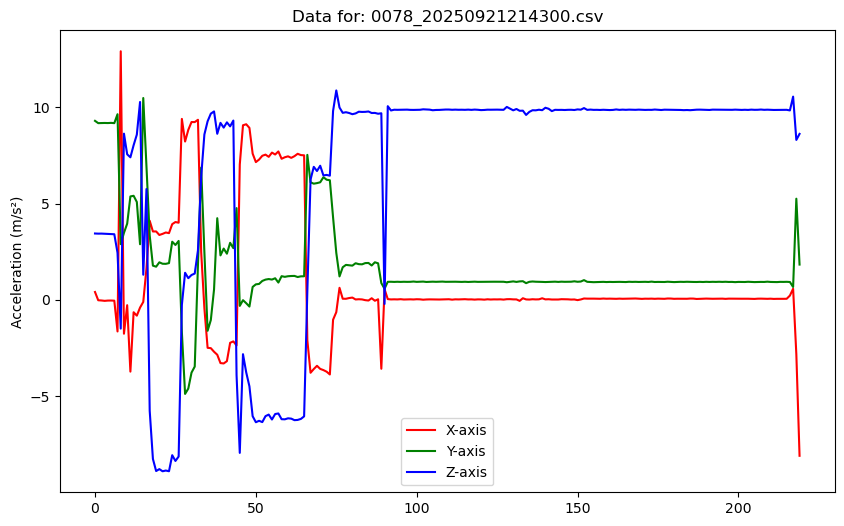

Enter label for 0078_20250921214300 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


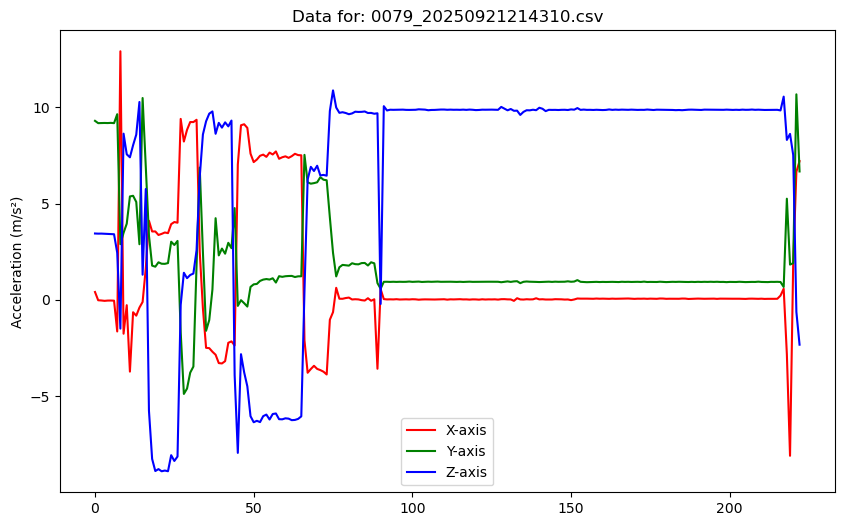

Enter label for 0079_20250921214310 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


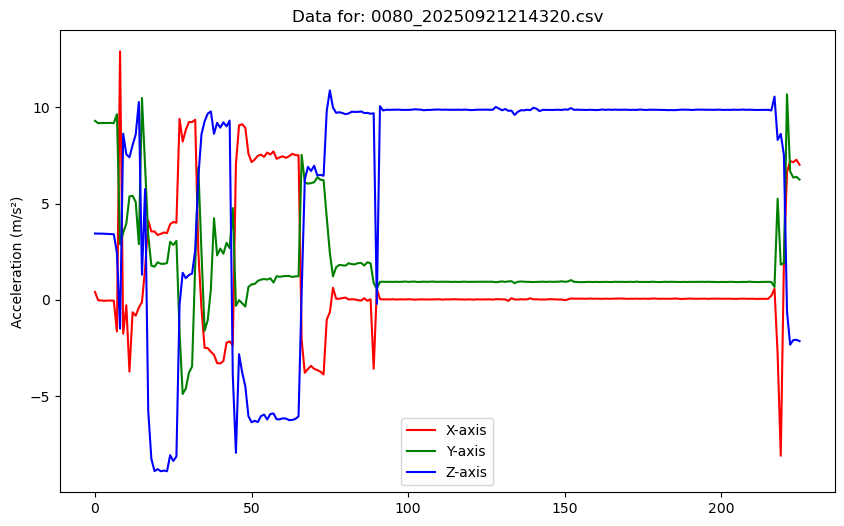

Enter label for 0080_20250921214320 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


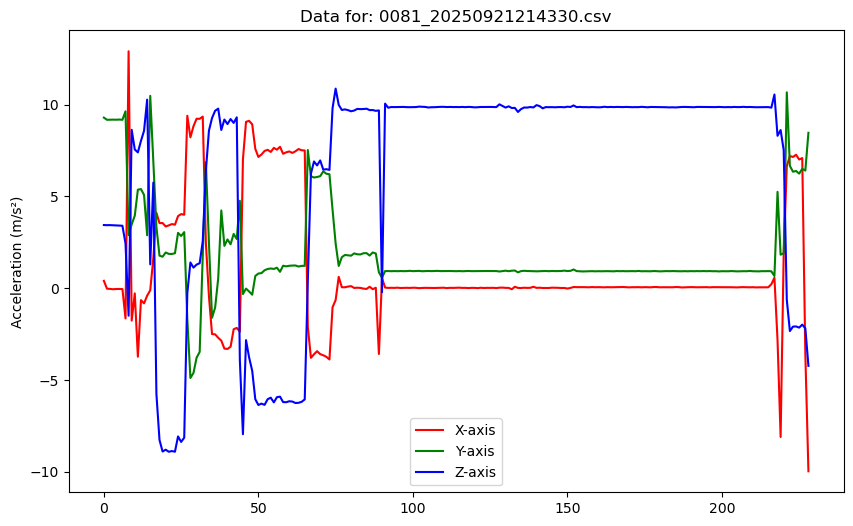

Enter label for 0081_20250921214330 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


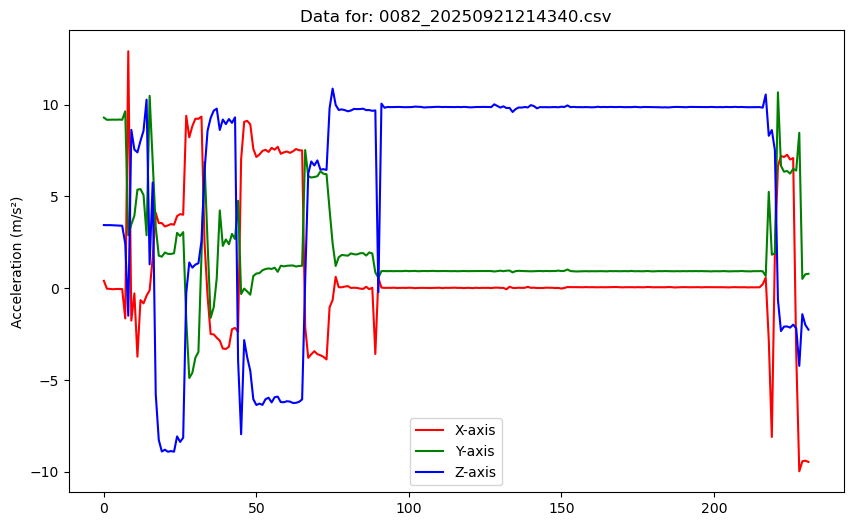

Enter label for 0082_20250921214340 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


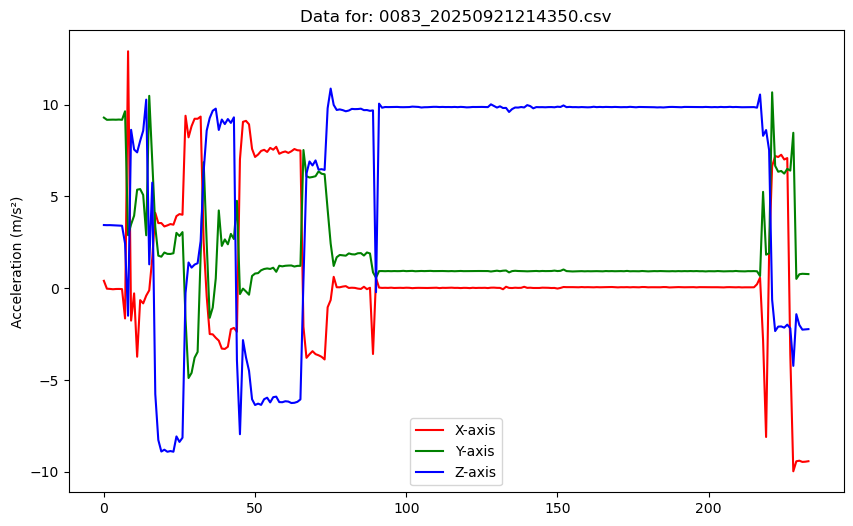

Enter label for 0083_20250921214350 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


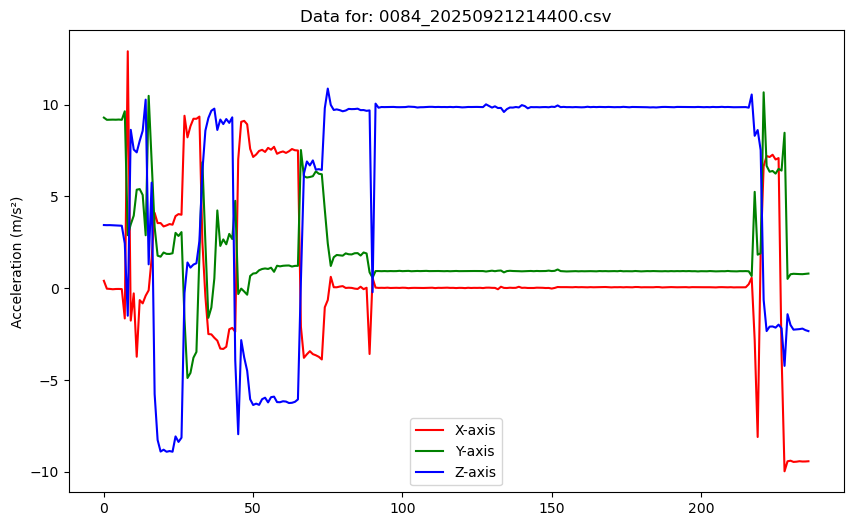

Enter label for 0084_20250921214400 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


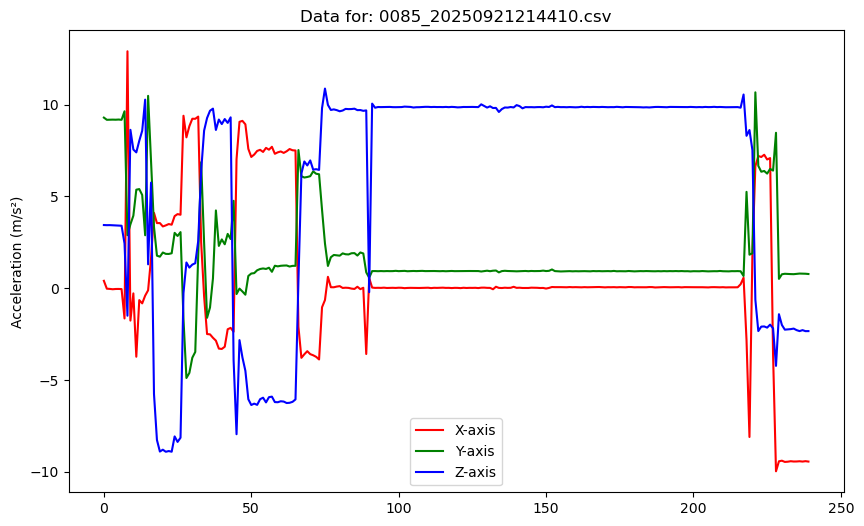

Enter label for 0085_20250921214410 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


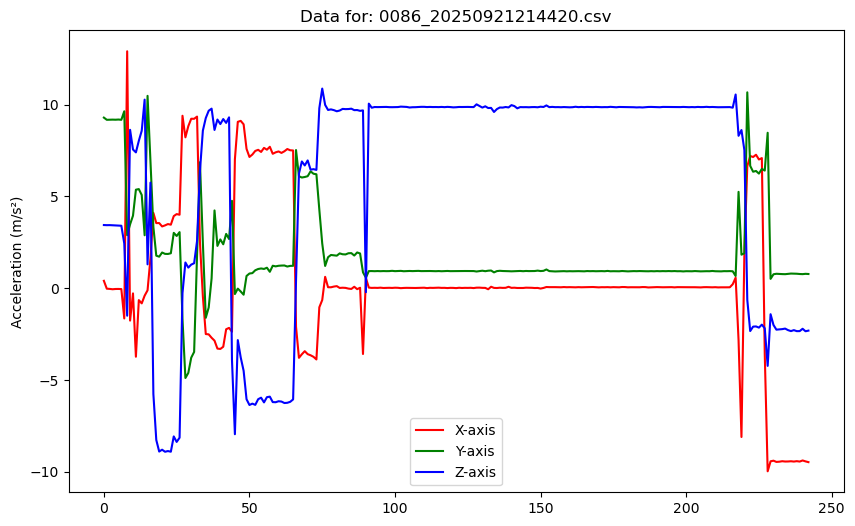

Enter label for 0086_20250921214420 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


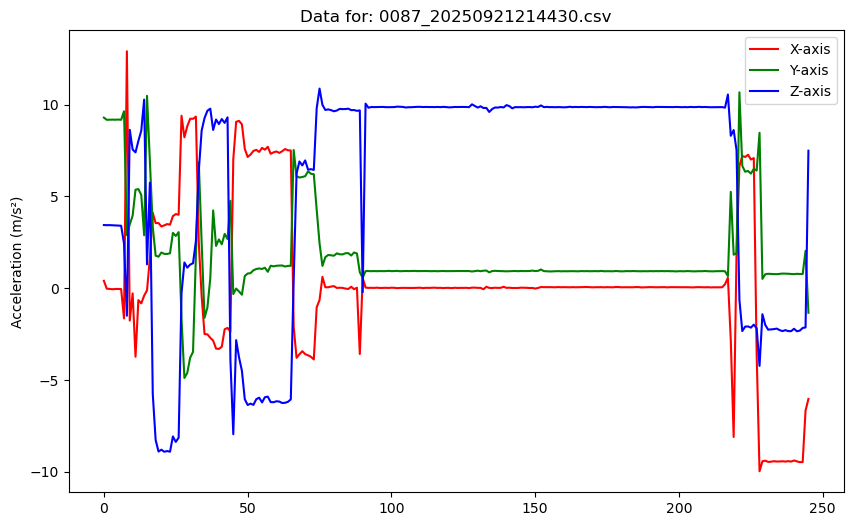

Enter label for 0087_20250921214430 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


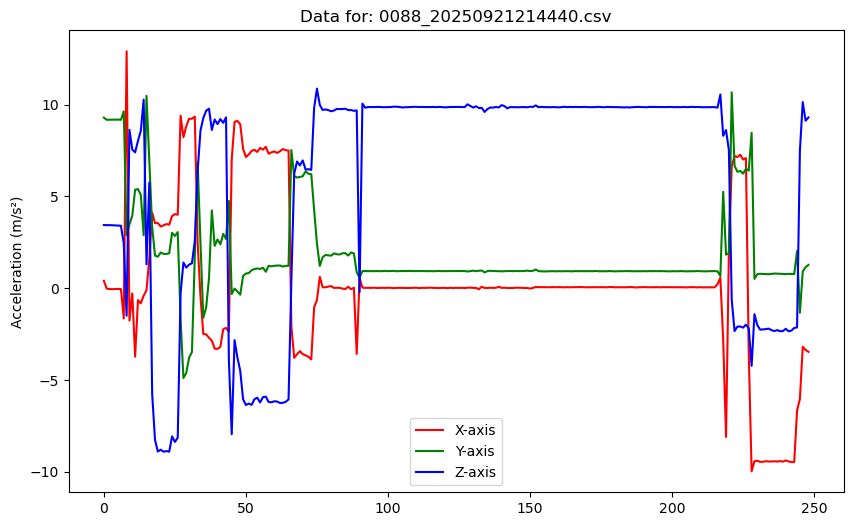

Enter label for 0088_20250921214440 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


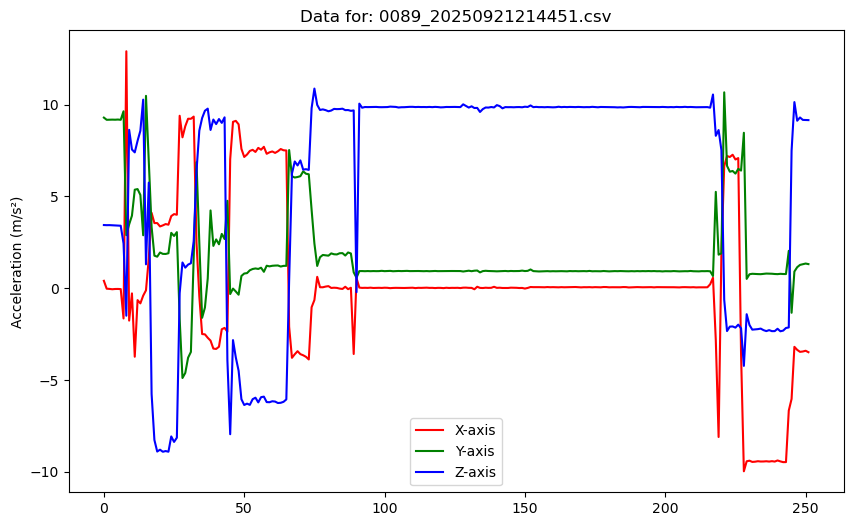

Enter label for 0089_20250921214451 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


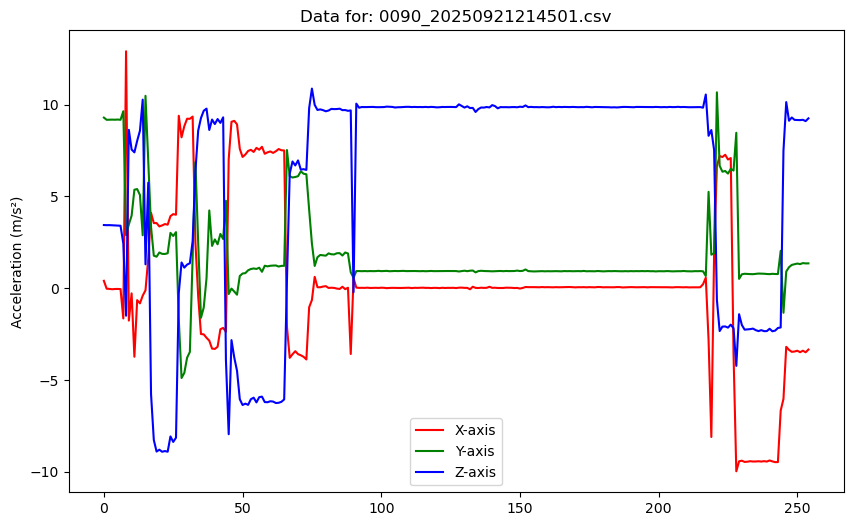

Enter label for 0090_20250921214501 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


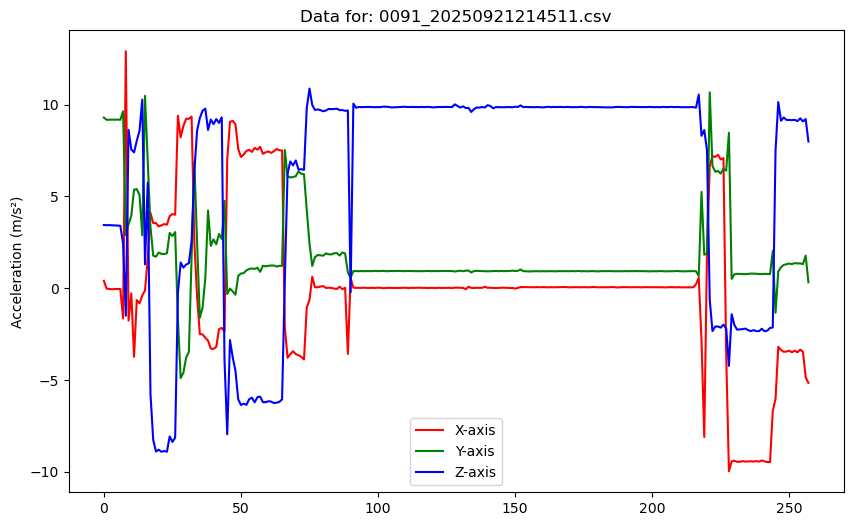

Enter label for 0091_20250921214511 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


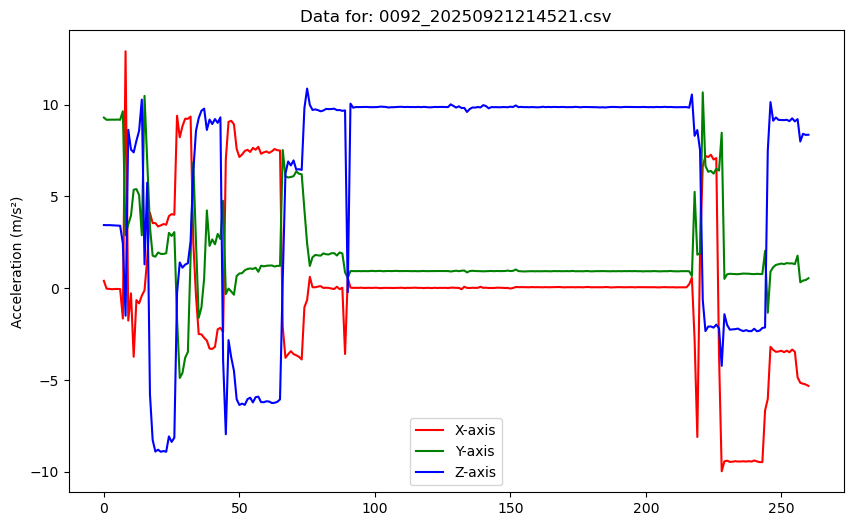

Enter label for 0092_20250921214521 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


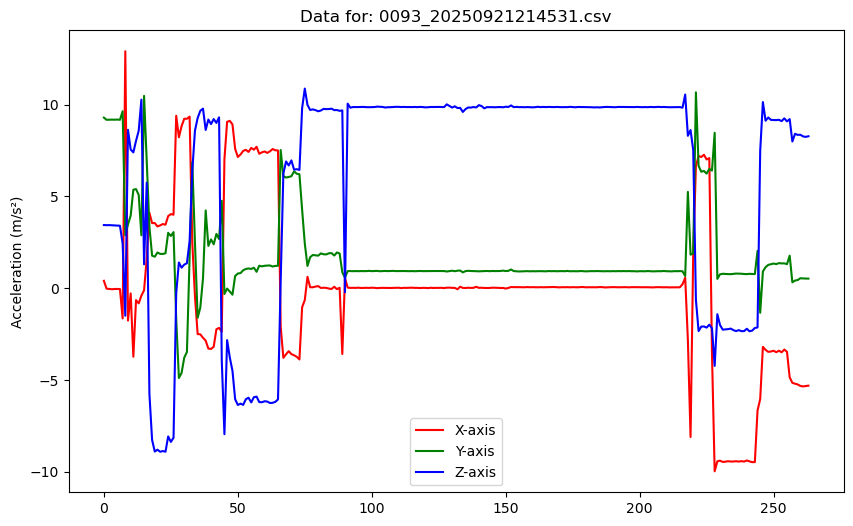

Enter label for 0093_20250921214531 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


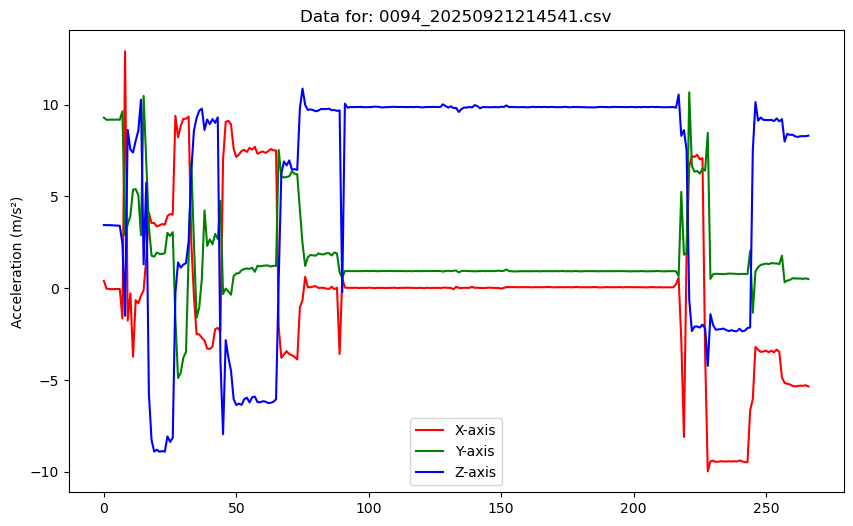

Enter label for 0094_20250921214541 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


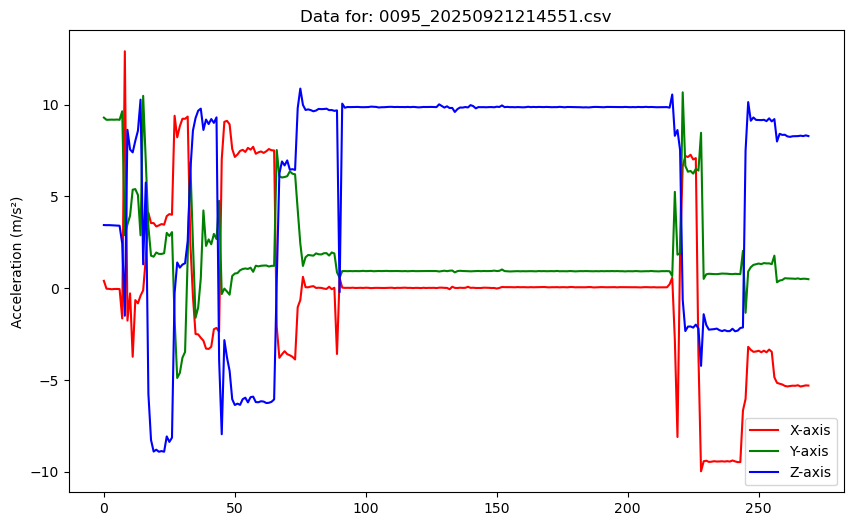

Enter label for 0095_20250921214551 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


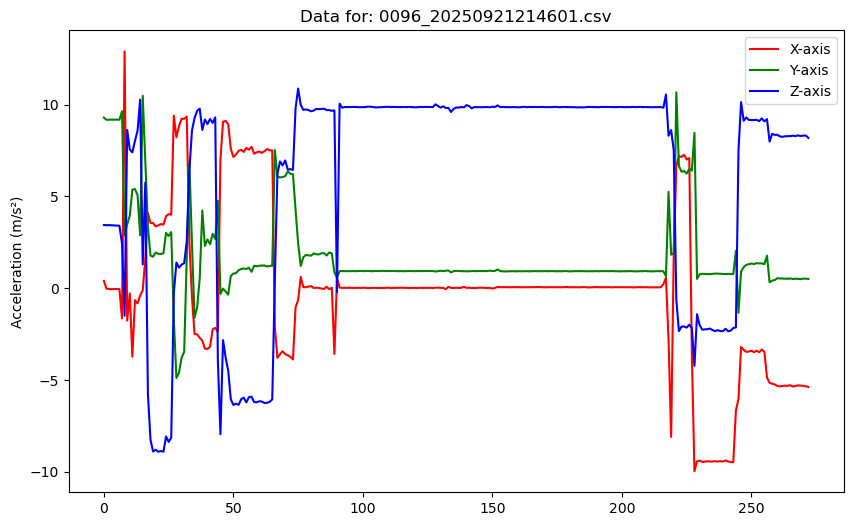

Enter label for 0096_20250921214601 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


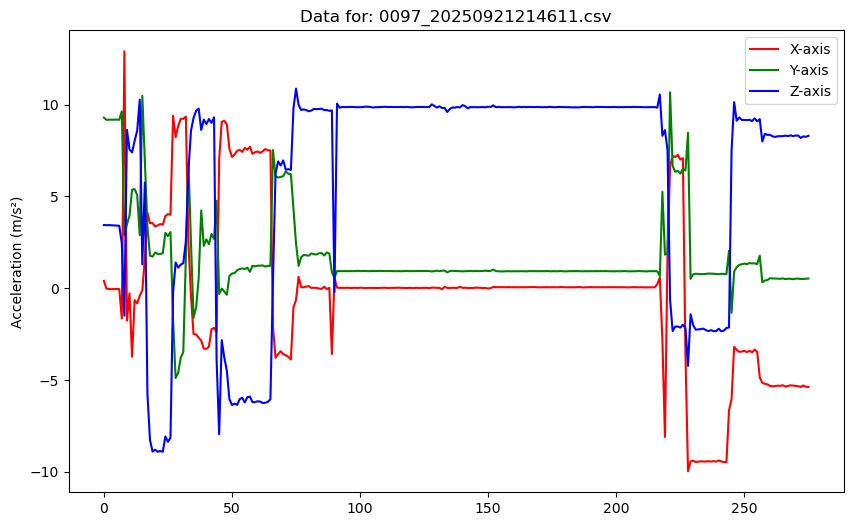

Enter label for 0097_20250921214611 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


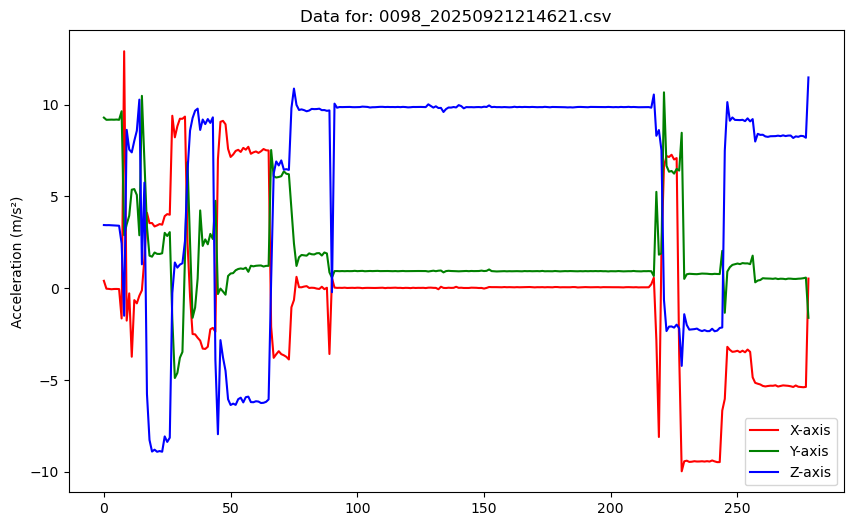

Enter label for 0098_20250921214621 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


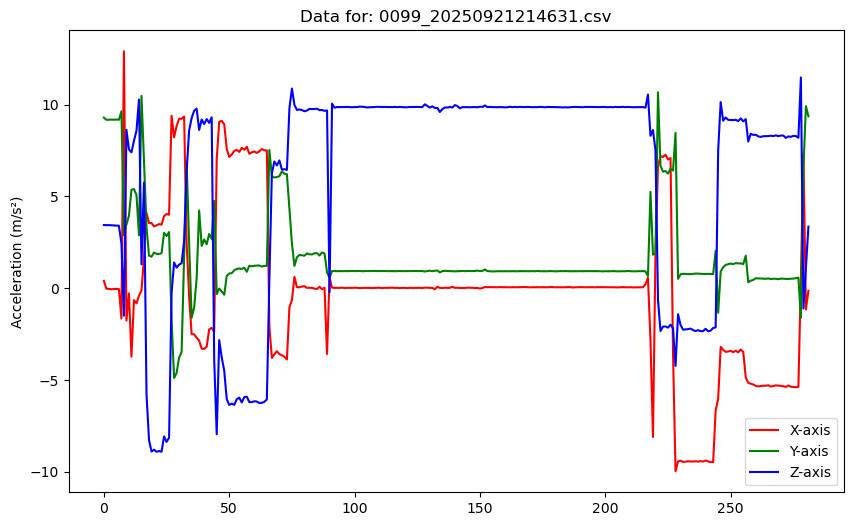

Enter label for 0099_20250921214631 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


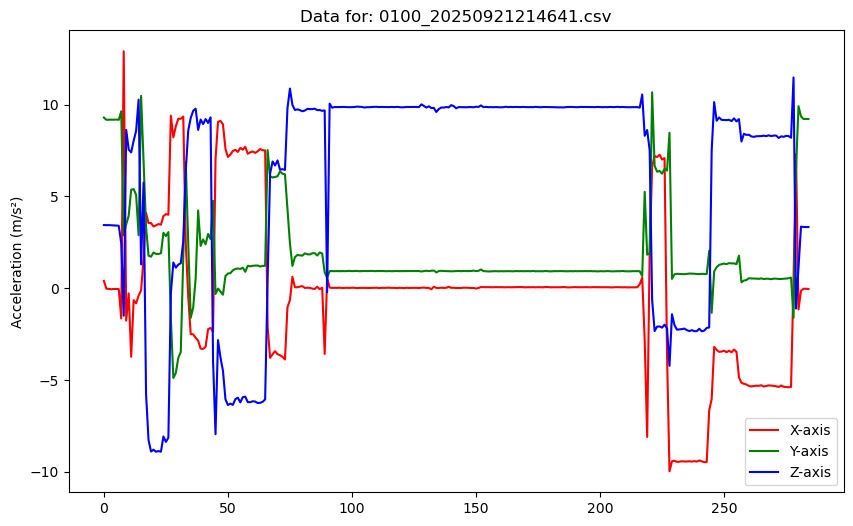

Enter label for 0100_20250921214641 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


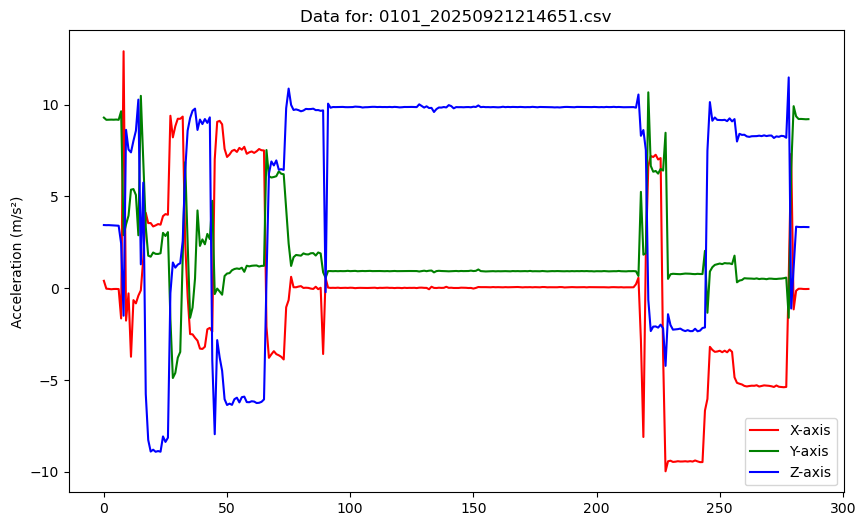

Enter label for 0101_20250921214651 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


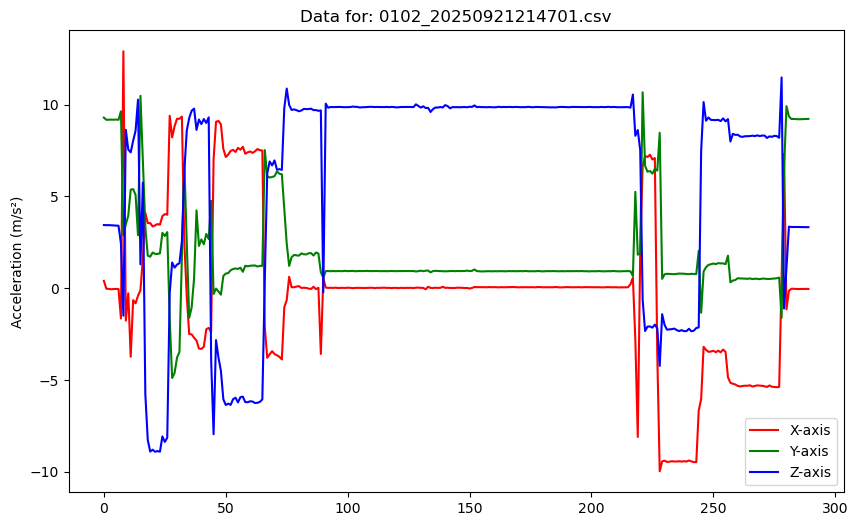

Enter label for 0102_20250921214701 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


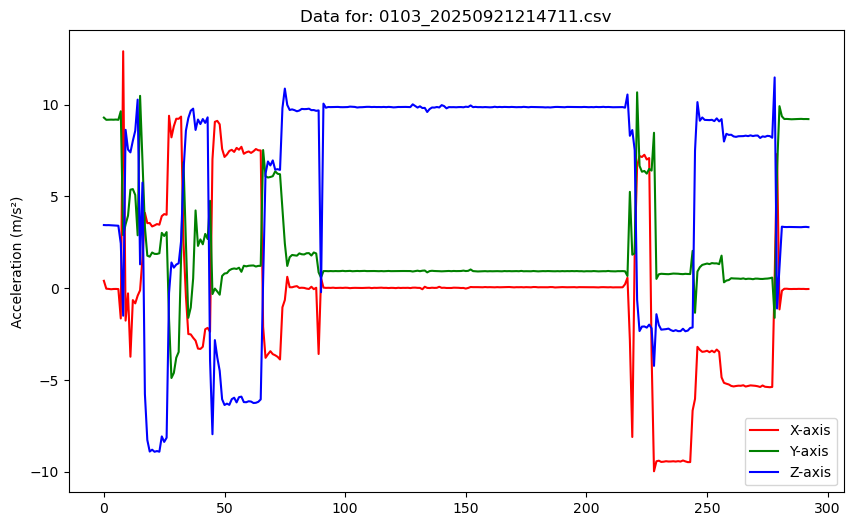

Enter label for 0103_20250921214711 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


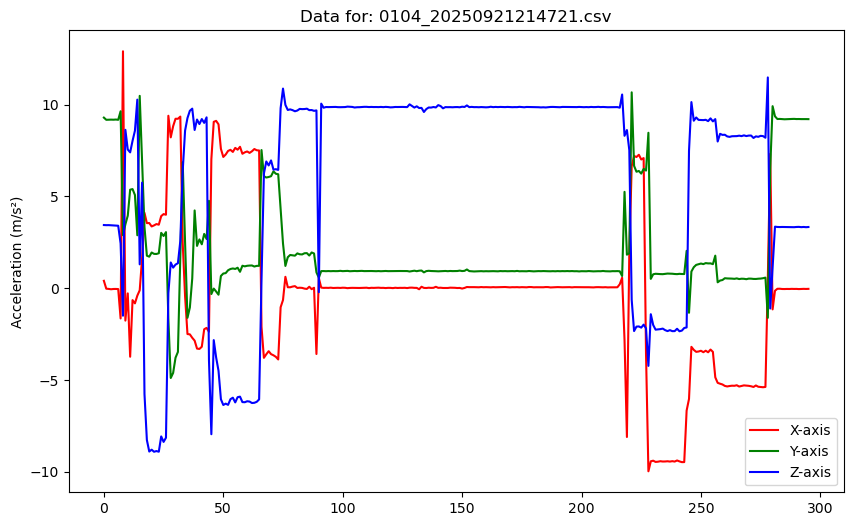

Enter label for 0104_20250921214721 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


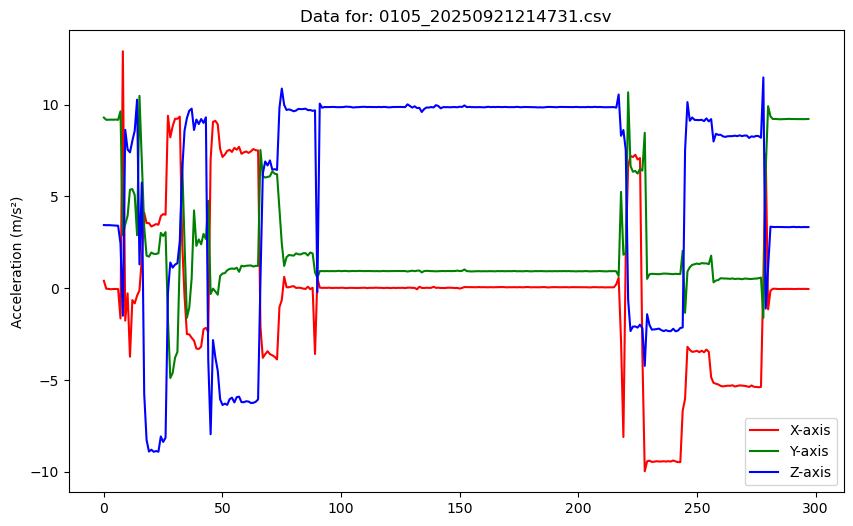

Enter label for 0105_20250921214731 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


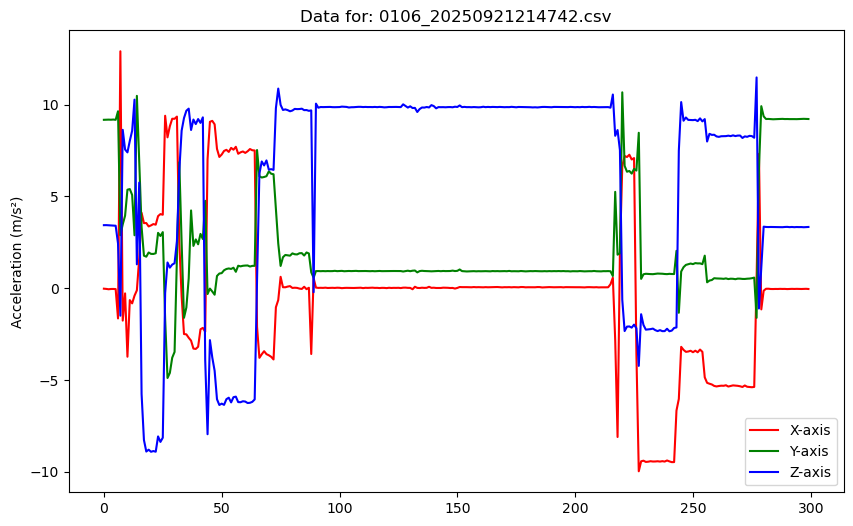

Enter label for 0106_20250921214742 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


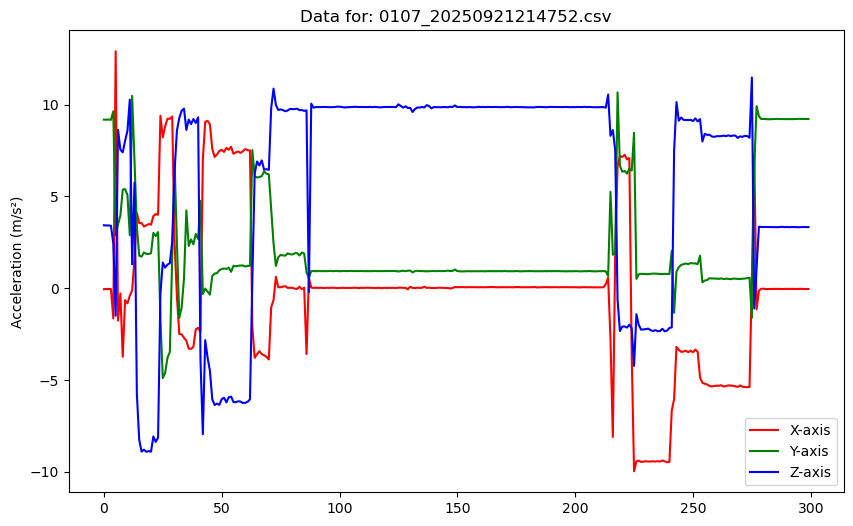

Enter label for 0107_20250921214752 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


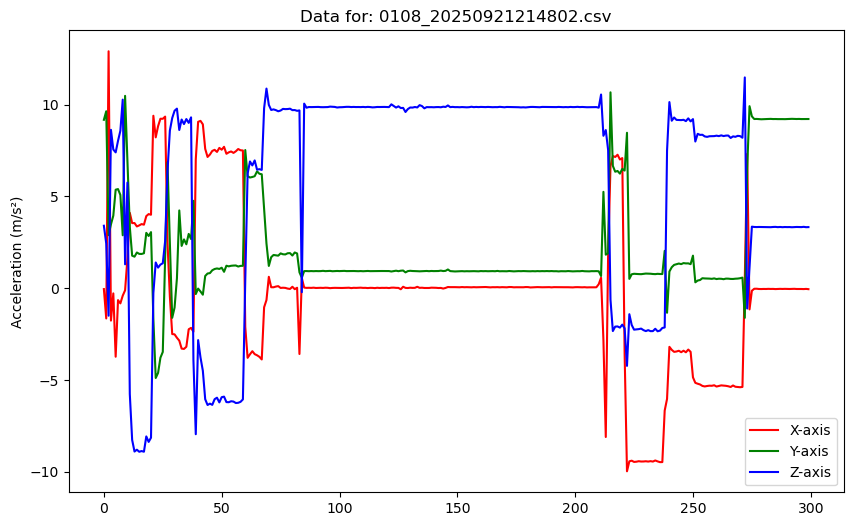

Enter label for 0108_20250921214802 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


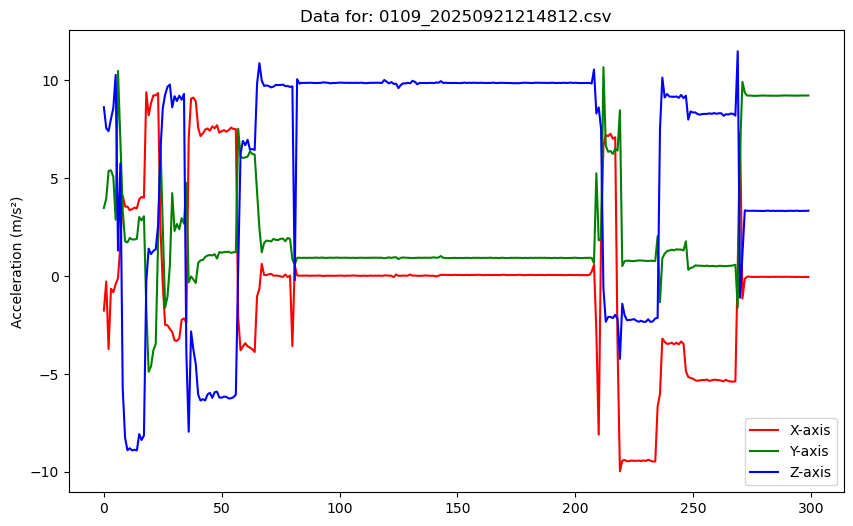

Enter label for 0109_20250921214812 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


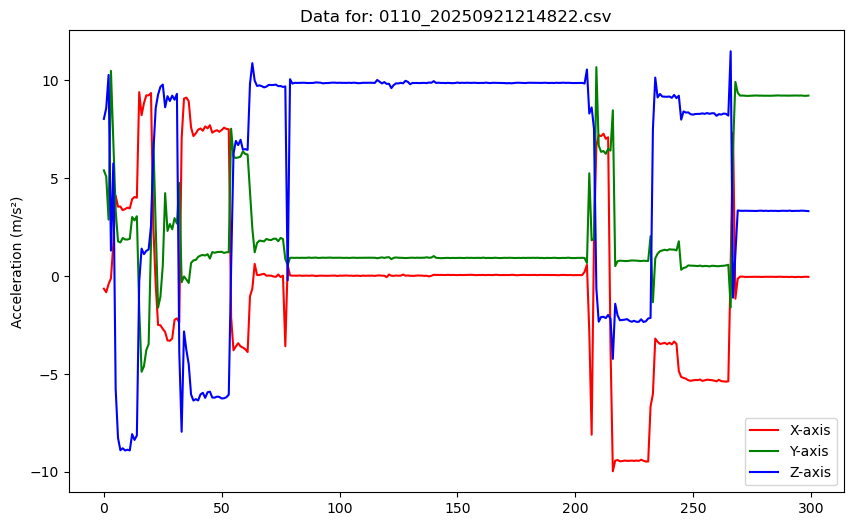

Enter label for 0110_20250921214822 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


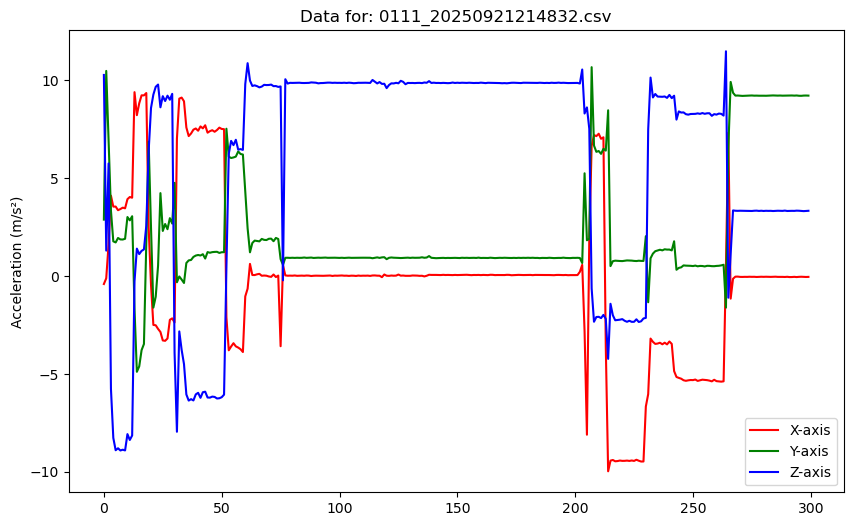

Enter label for 0111_20250921214832 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


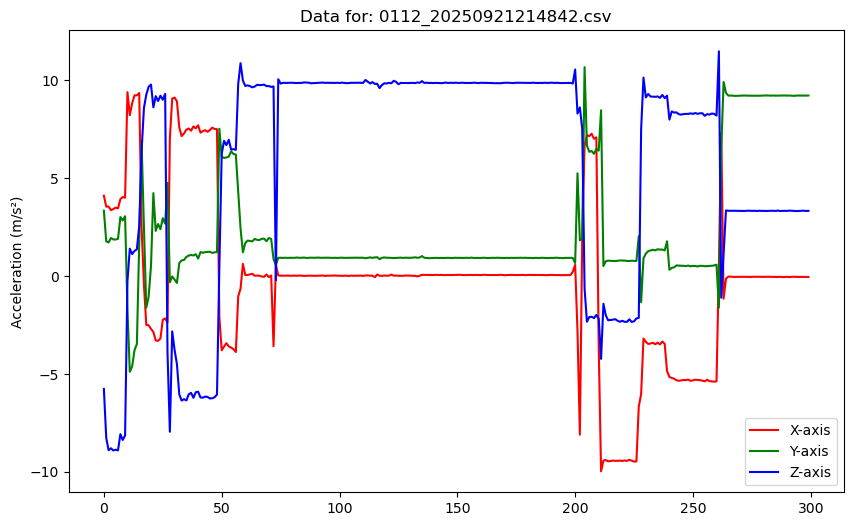

Enter label for 0112_20250921214842 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


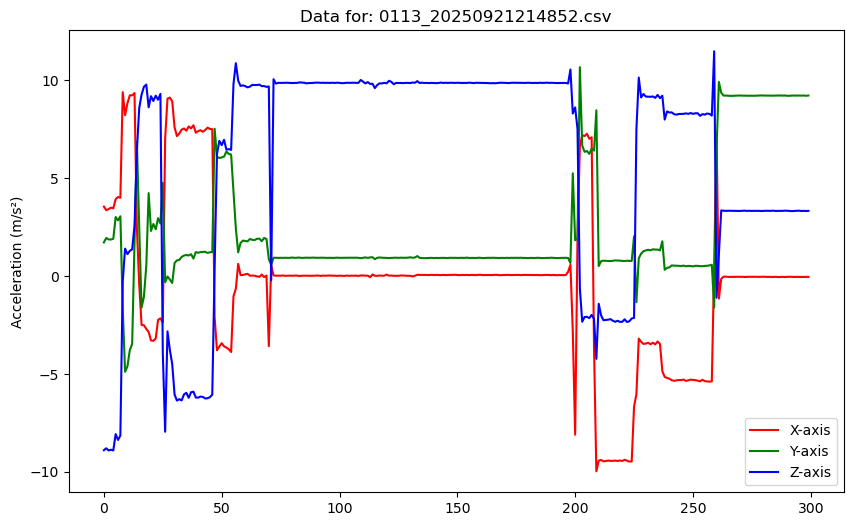

Enter label for 0113_20250921214852 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


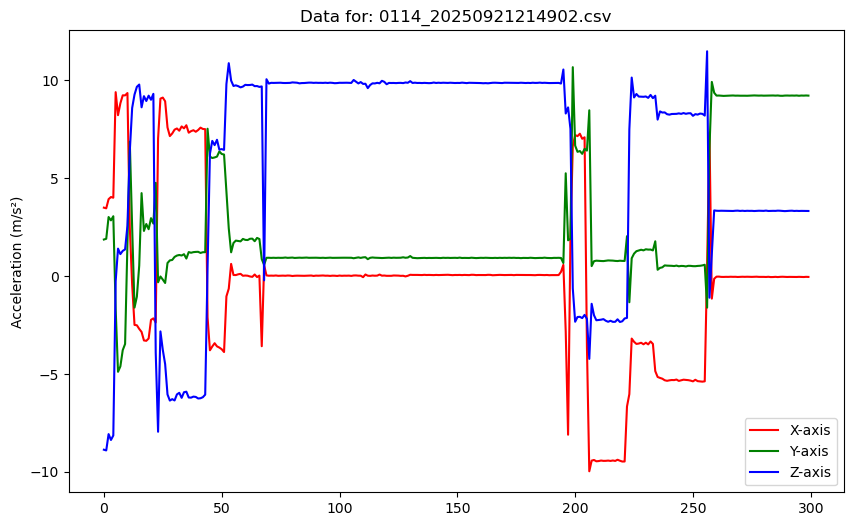

Enter label for 0114_20250921214902 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


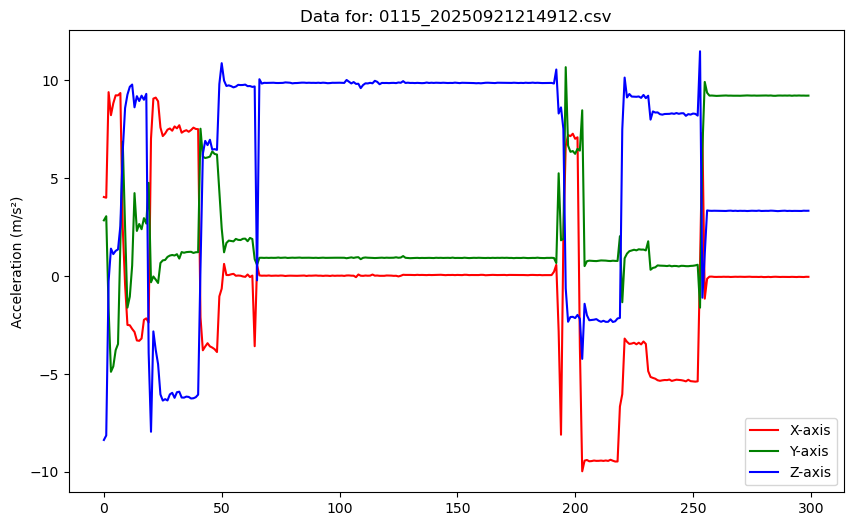

Enter label for 0115_20250921214912 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


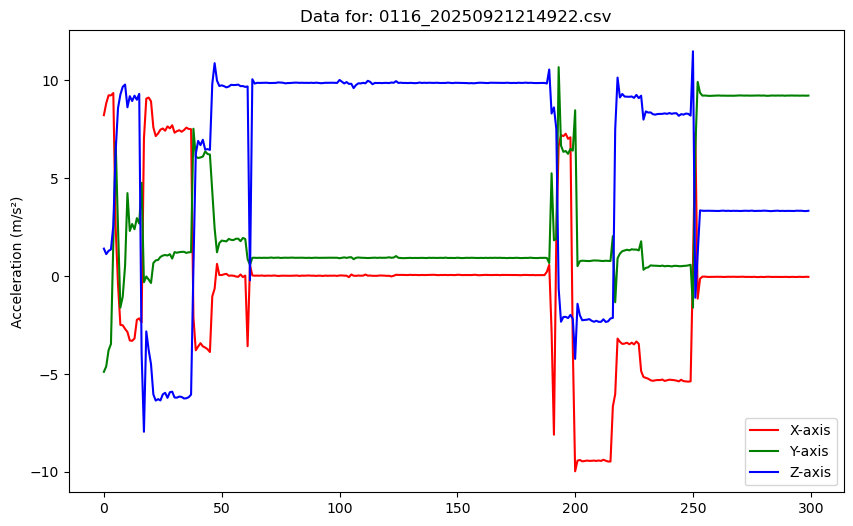

Enter label for 0116_20250921214922 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


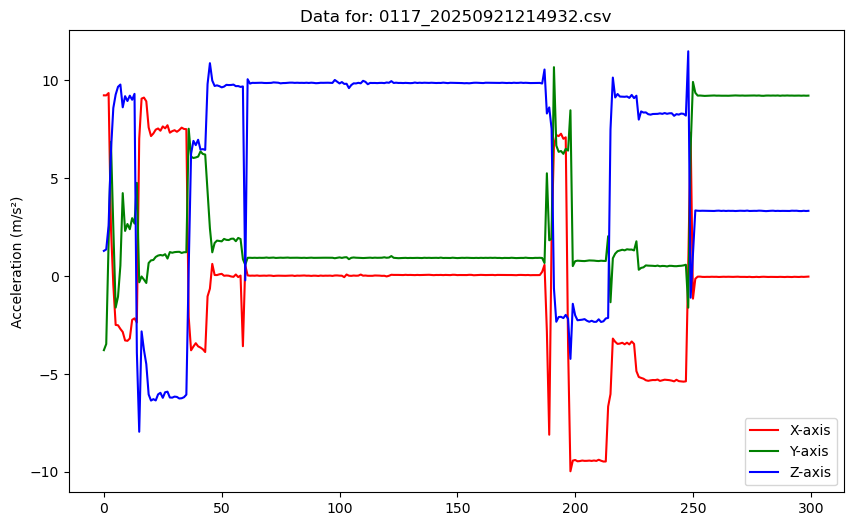

Enter label for 0117_20250921214932 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


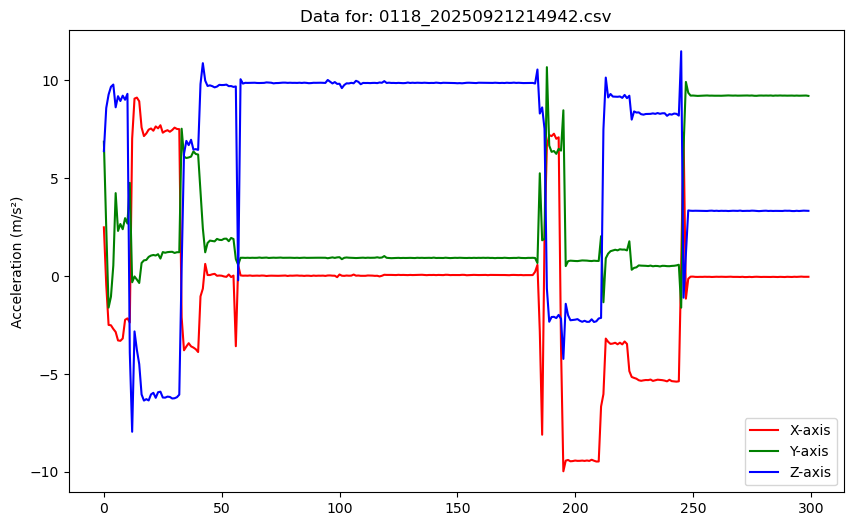

Enter label for 0118_20250921214942 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


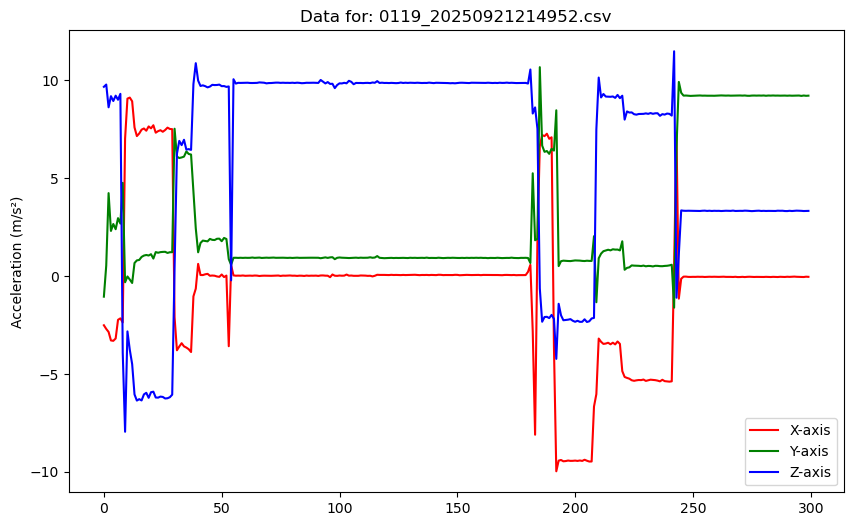

Enter label for 0119_20250921214952 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


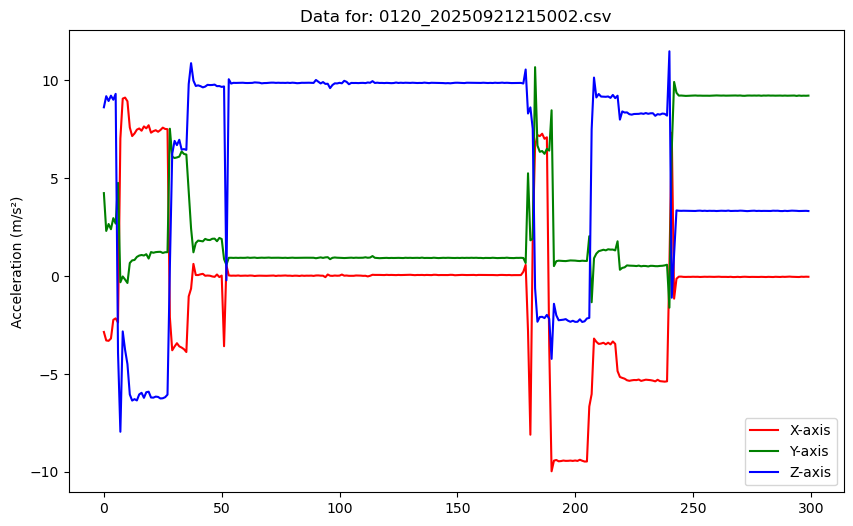

Enter label for 0120_20250921215002 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


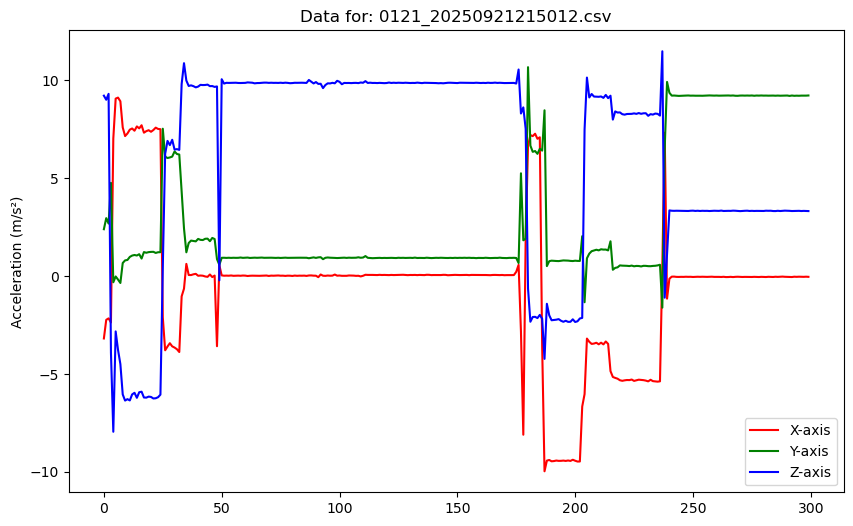

Enter label for 0121_20250921215012 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


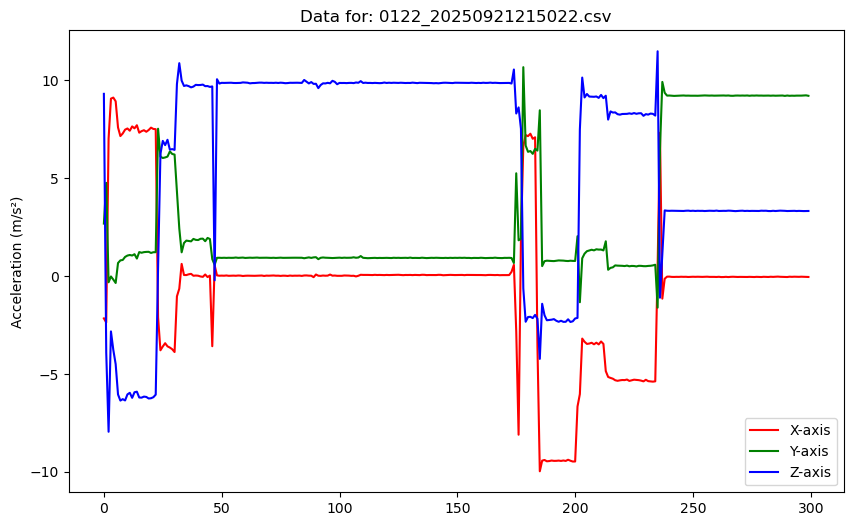

Enter label for 0122_20250921215022 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


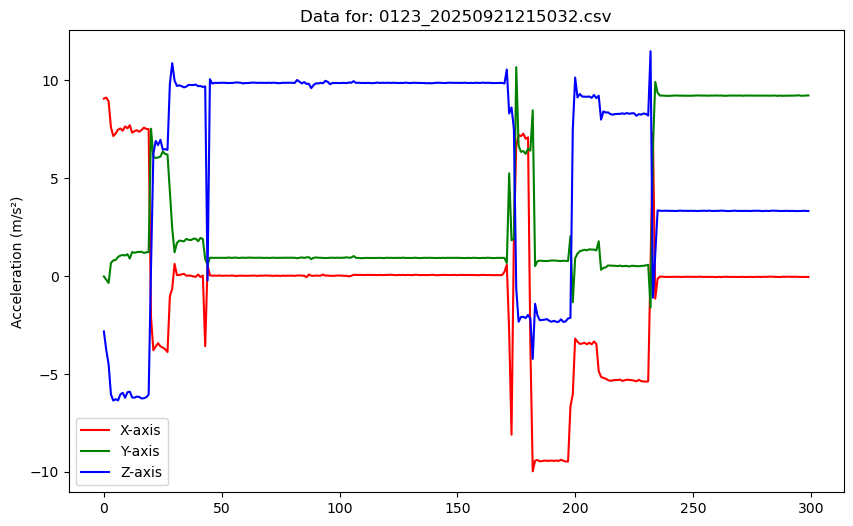

Enter label for 0123_20250921215032 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


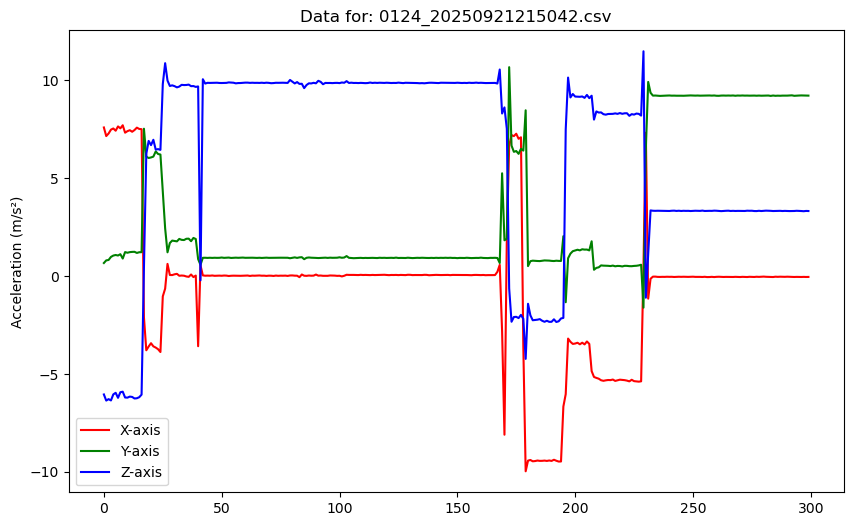

Enter label for 0124_20250921215042 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


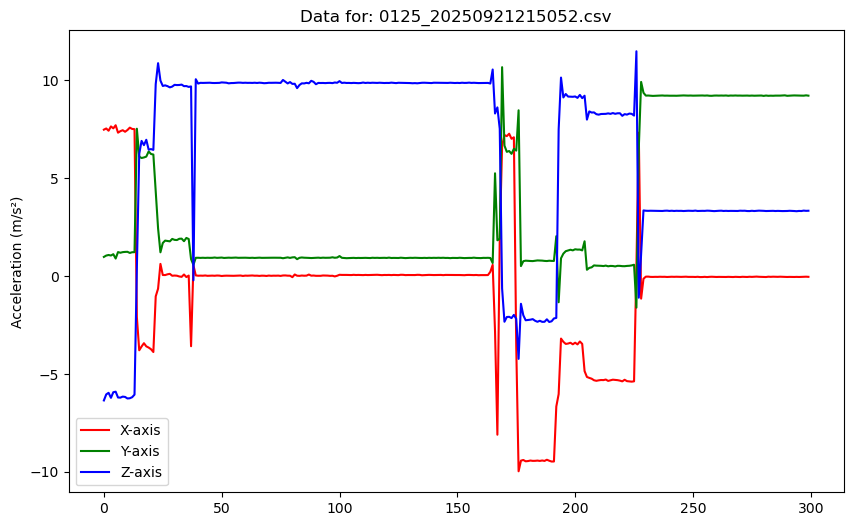

Enter label for 0125_20250921215052 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


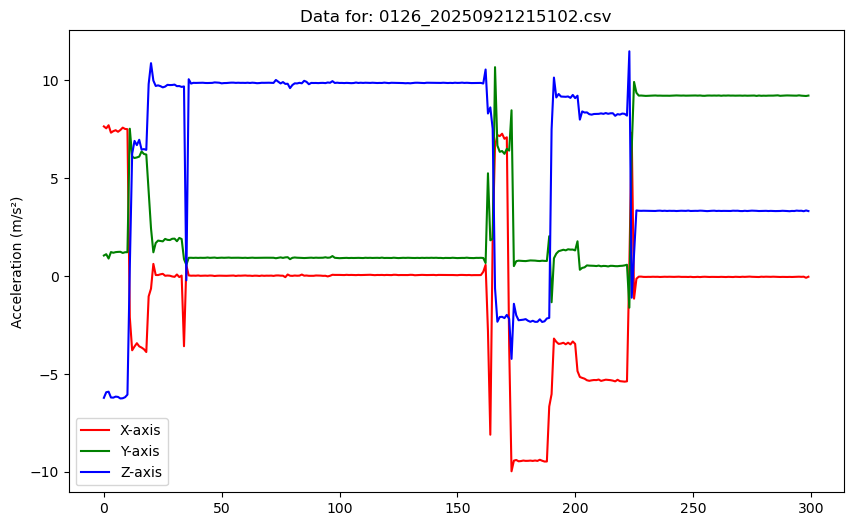

Enter label for 0126_20250921215102 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


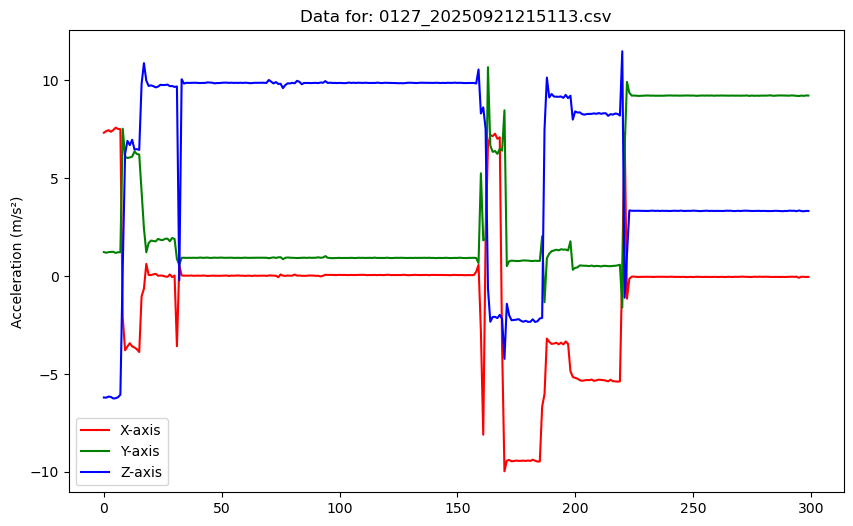

Enter label for 0127_20250921215113 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


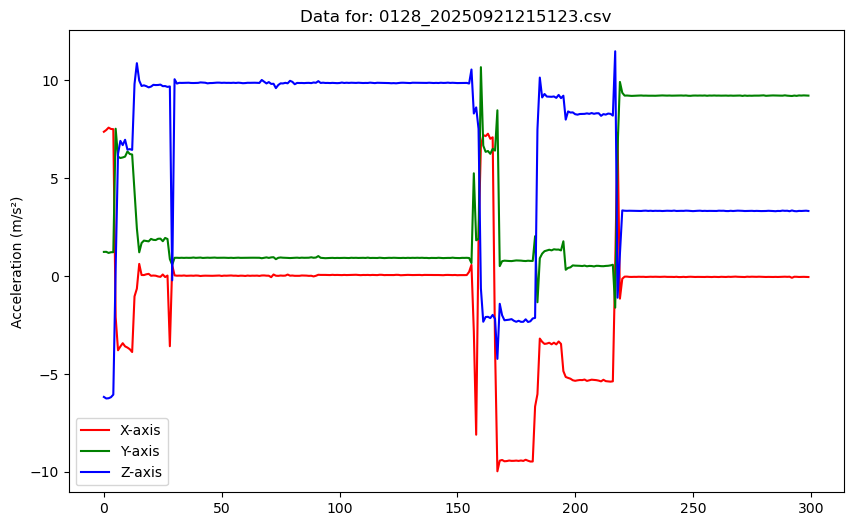

Enter label for 0128_20250921215123 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


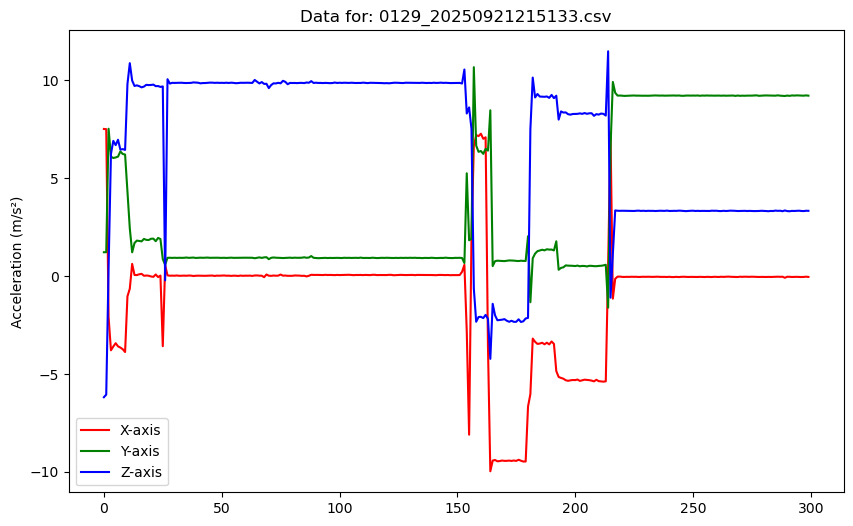

Enter label for 0129_20250921215133 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


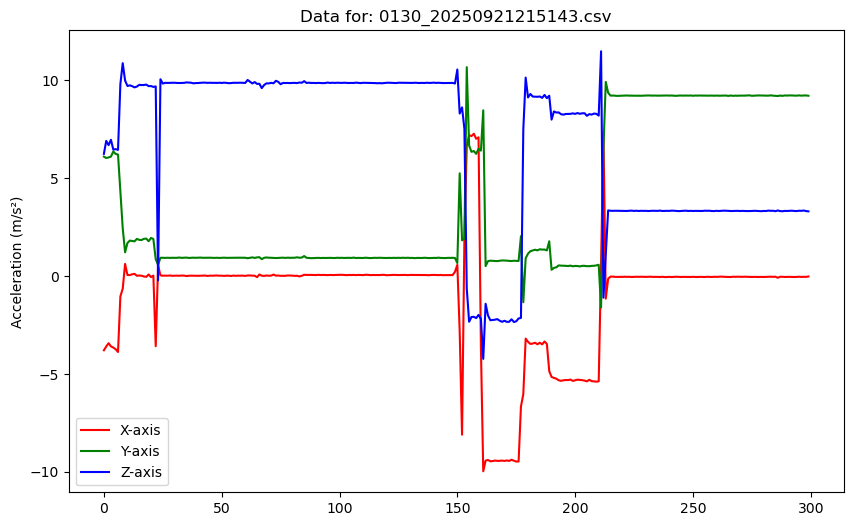

Enter label for 0130_20250921215143 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


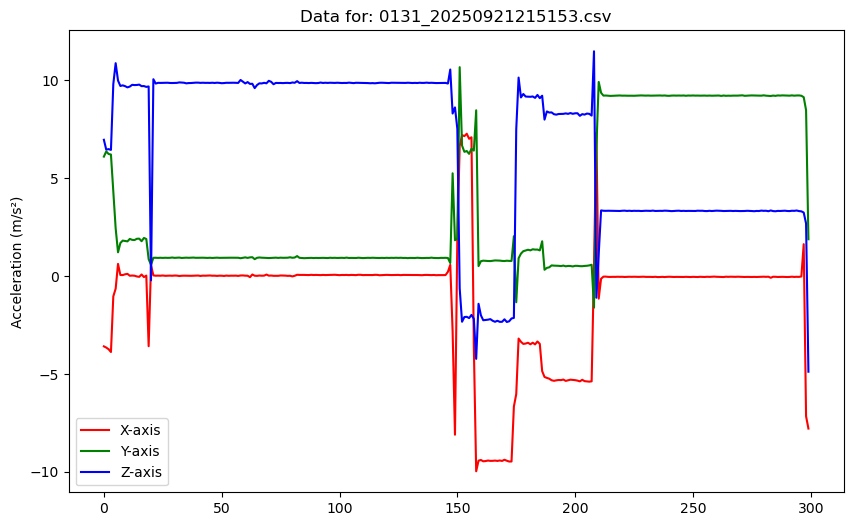

Enter label for 0131_20250921215153 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


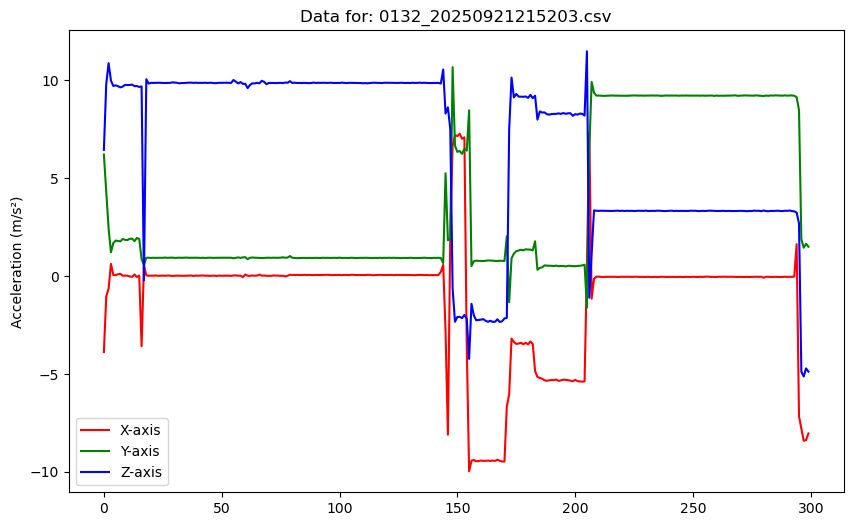

Enter label for 0132_20250921215203 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


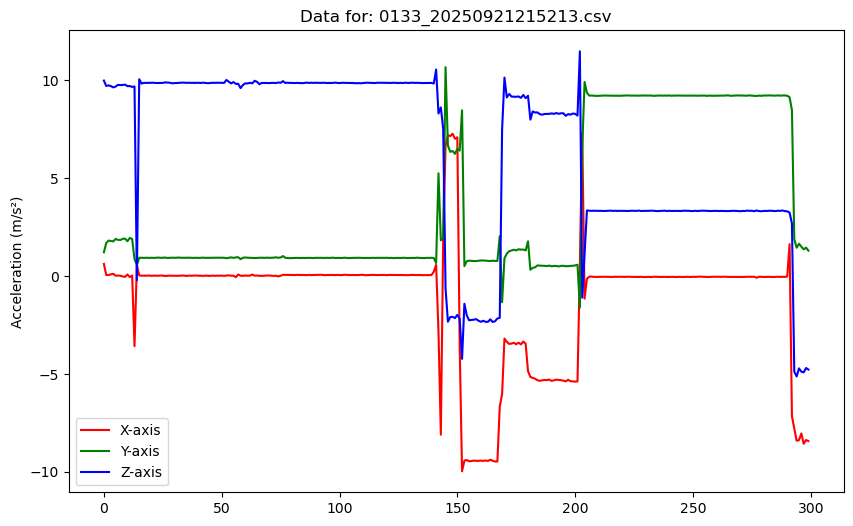

Enter label for 0133_20250921215213 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


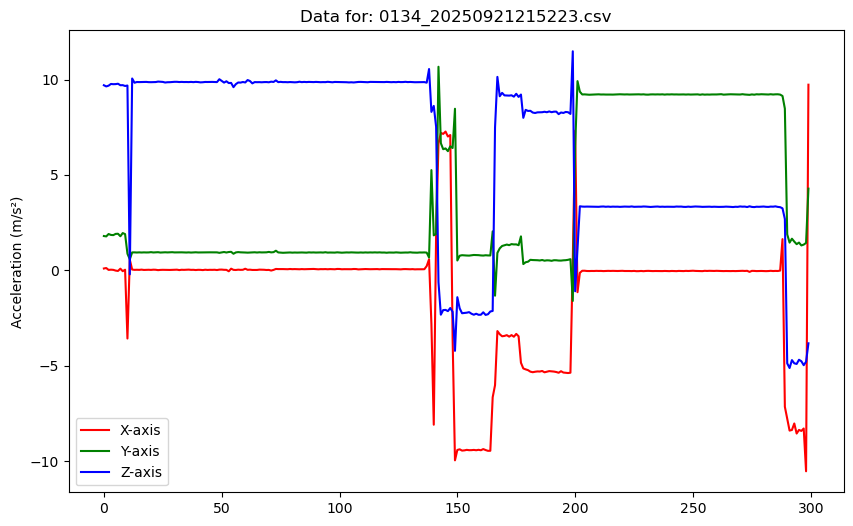

Enter label for 0134_20250921215223 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


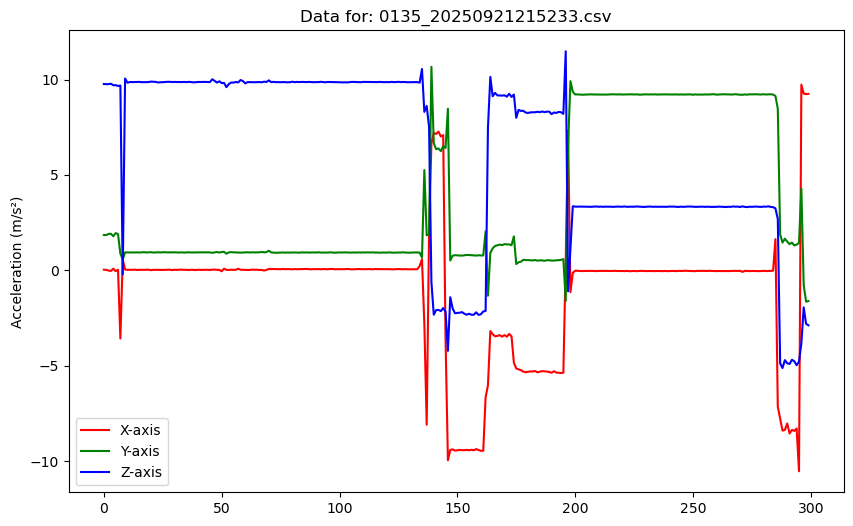

Enter label for 0135_20250921215233 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


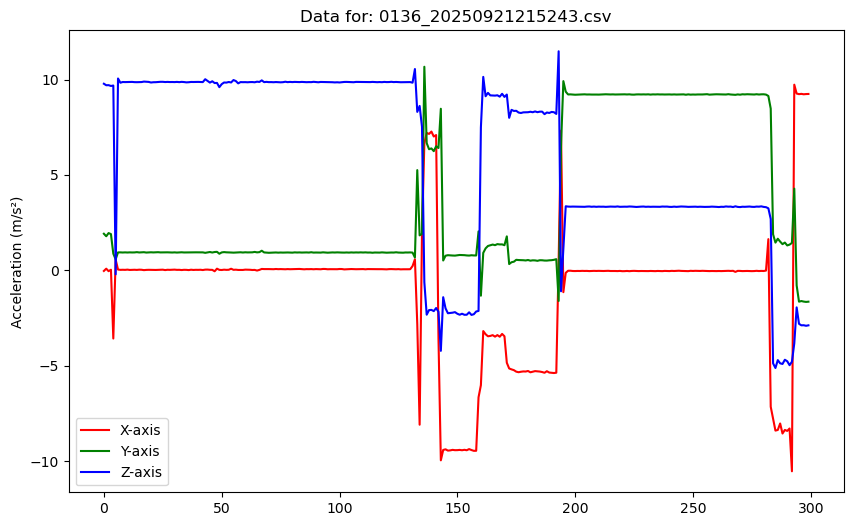

Enter label for 0136_20250921215243 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


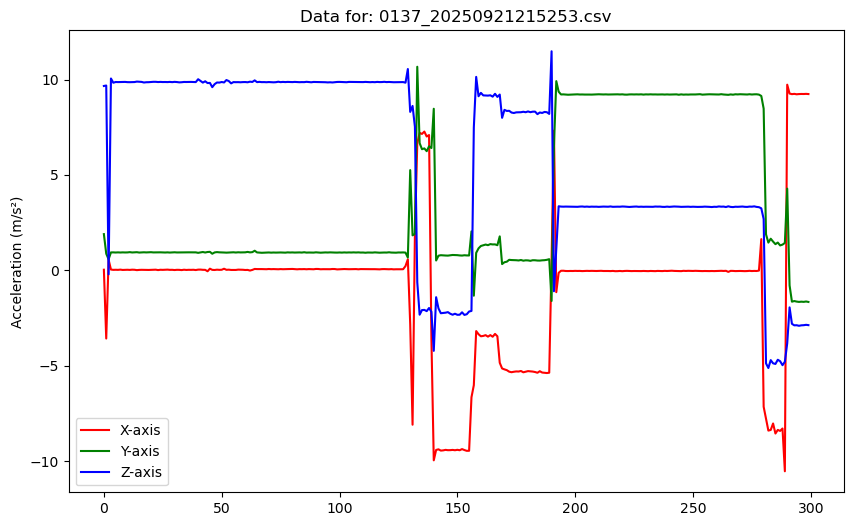

Enter label for 0137_20250921215253 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


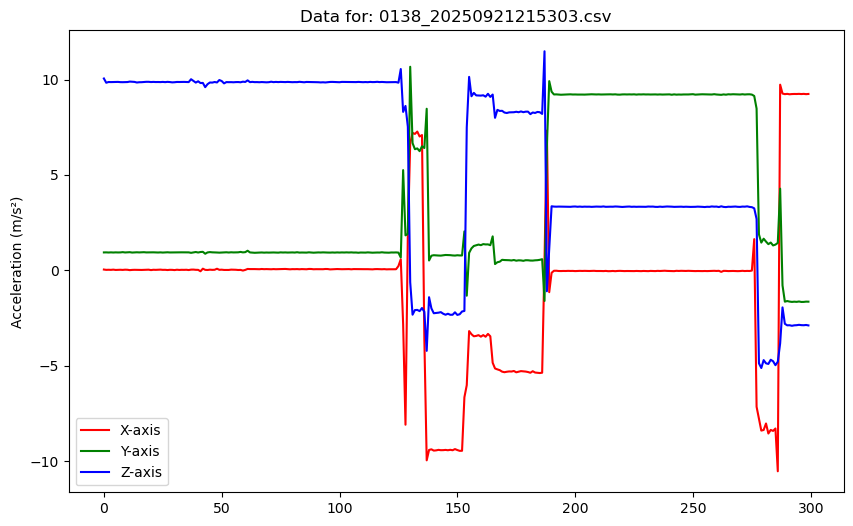

Enter label for 0138_20250921215303 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


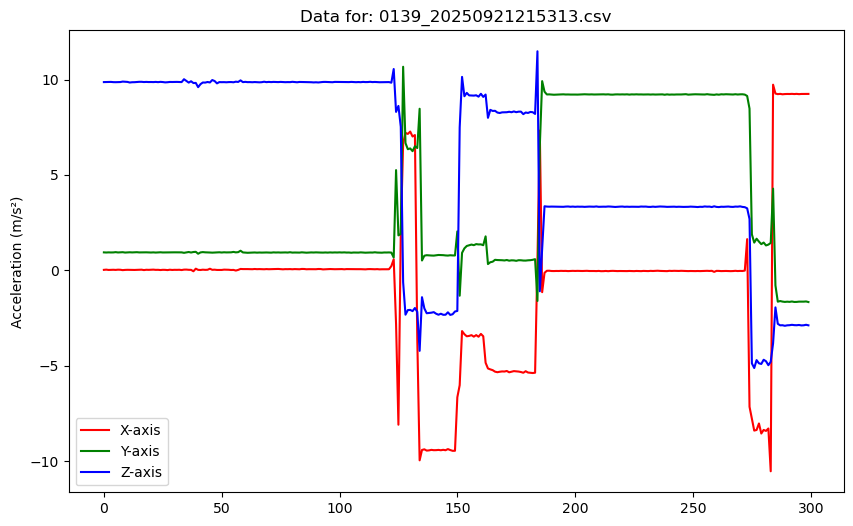

Enter label for 0139_20250921215313 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


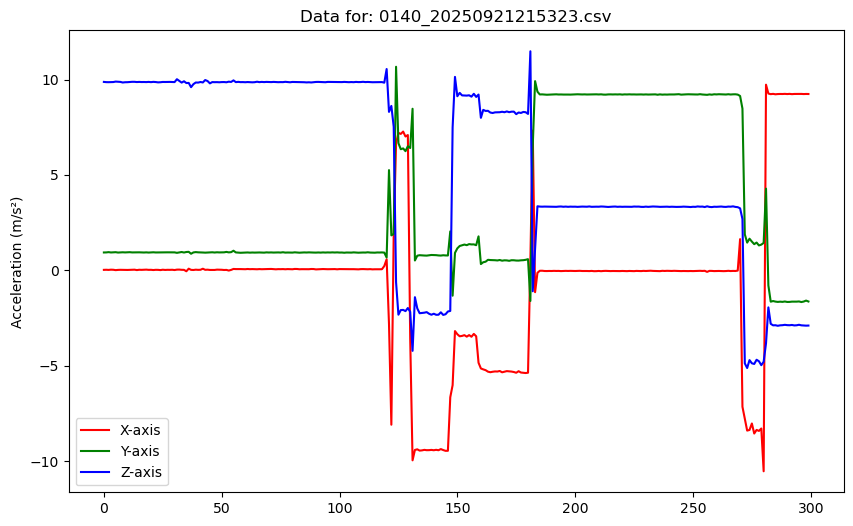

Enter label for 0140_20250921215323 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


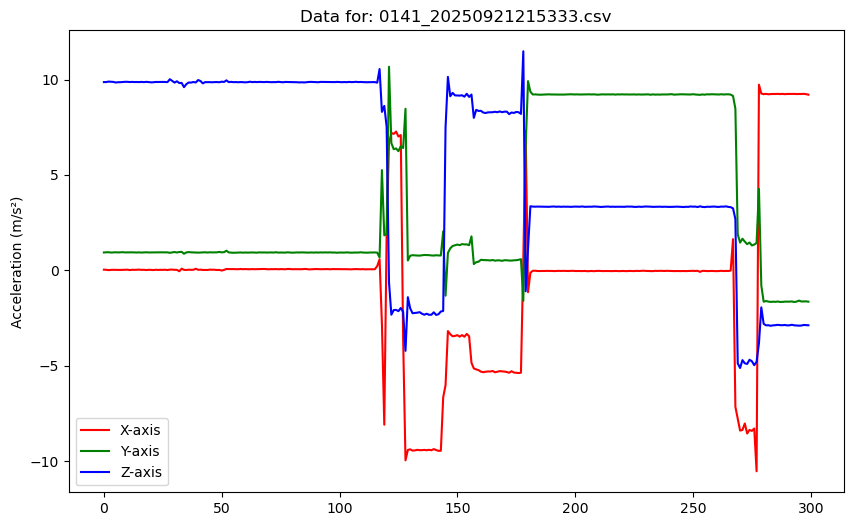

Enter label for 0141_20250921215333 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


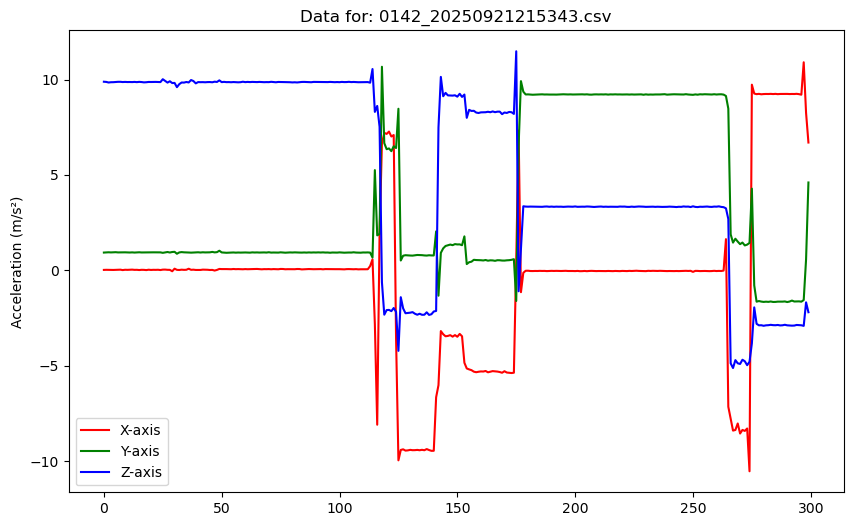

Enter label for 0142_20250921215343 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


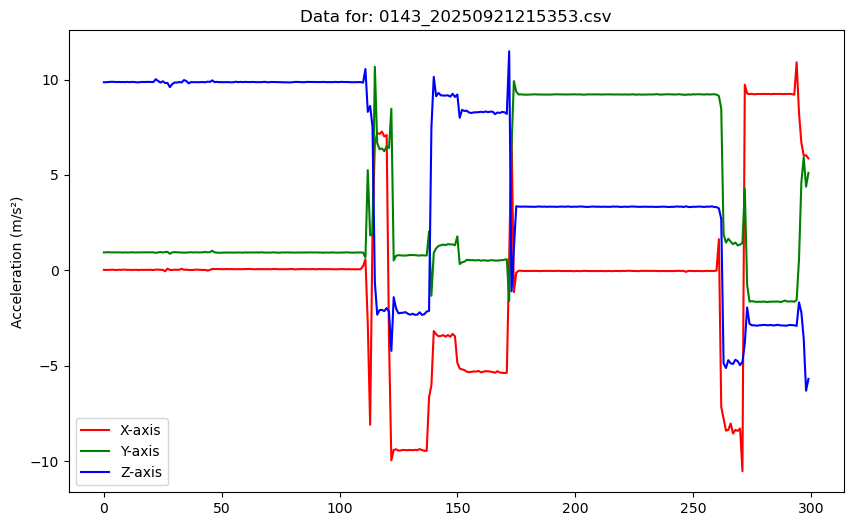

Enter label for 0143_20250921215353 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


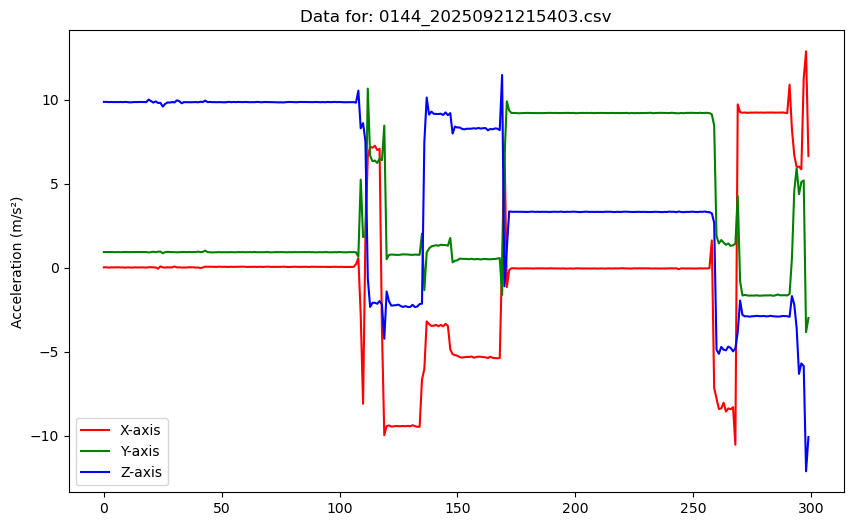

Enter label for 0144_20250921215403 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


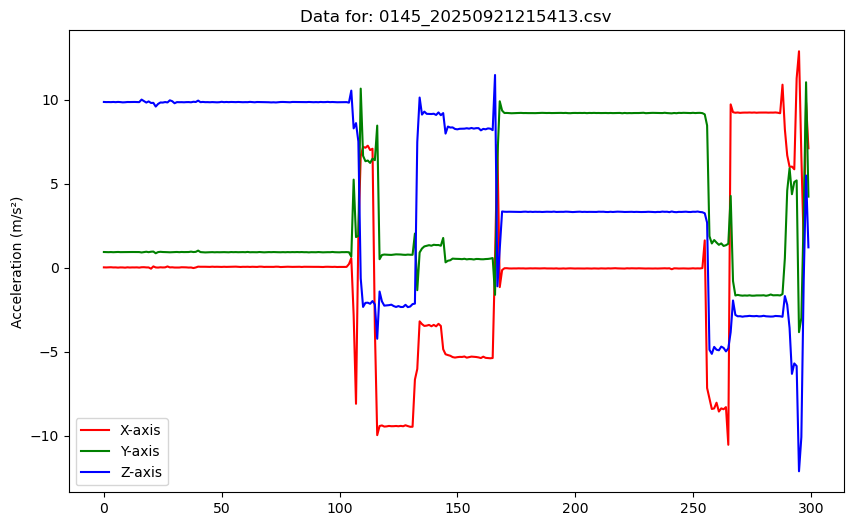

Enter label for 0145_20250921215413 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


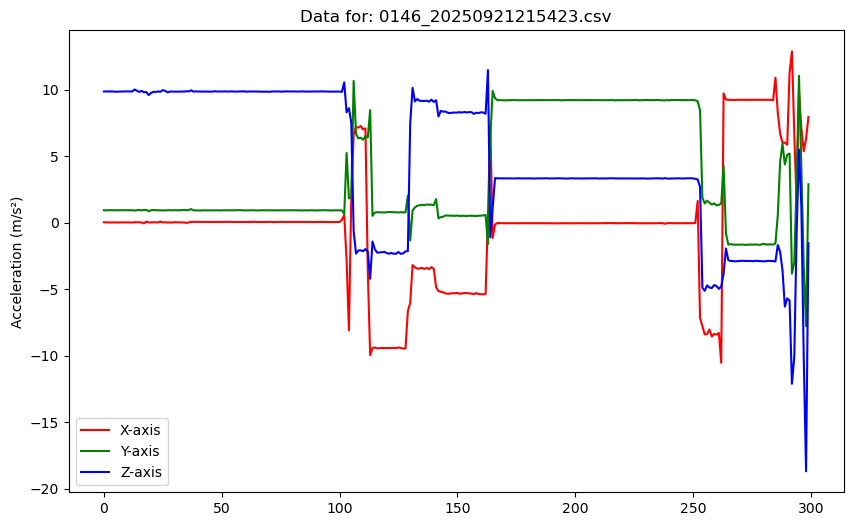

Enter label for 0146_20250921215423 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


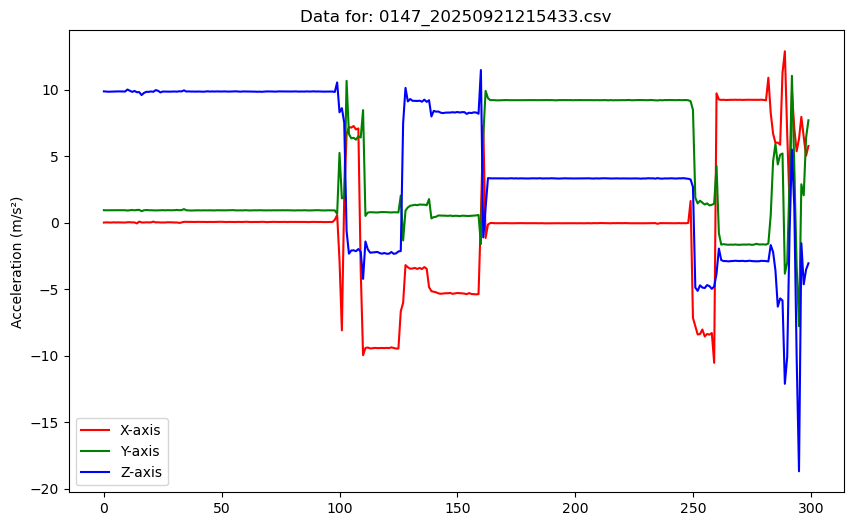

Enter label for 0147_20250921215433 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


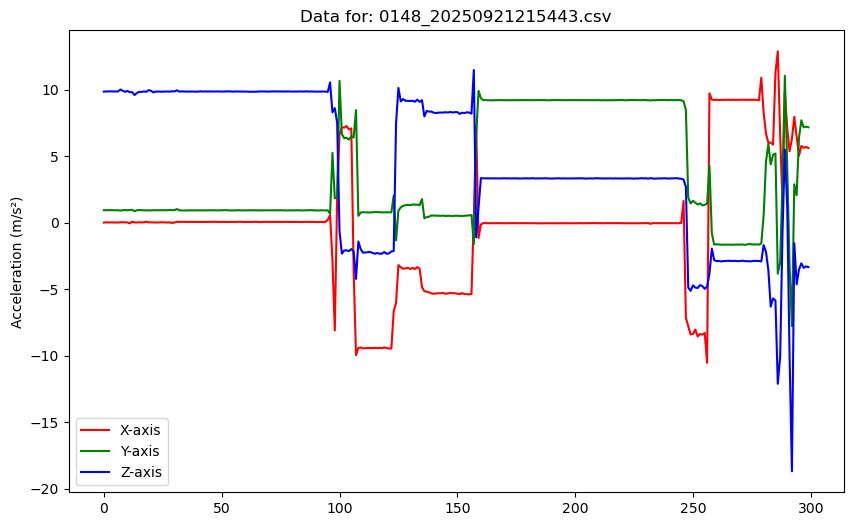

Enter label for 0148_20250921215443 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


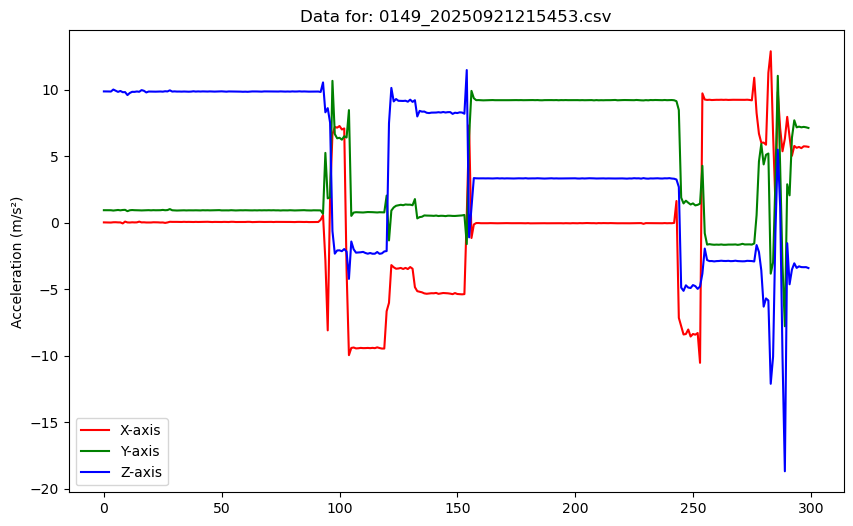

Enter label for 0149_20250921215453 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


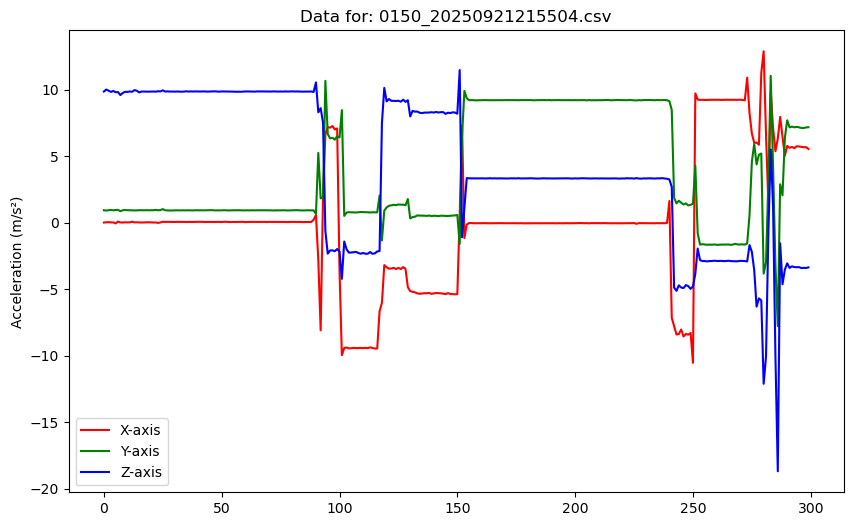

Enter label for 0150_20250921215504 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


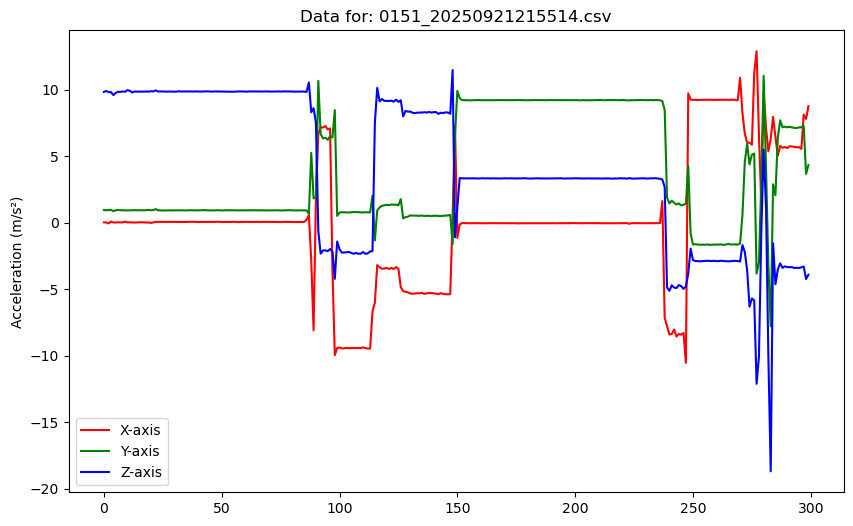

Enter label for 0151_20250921215514 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


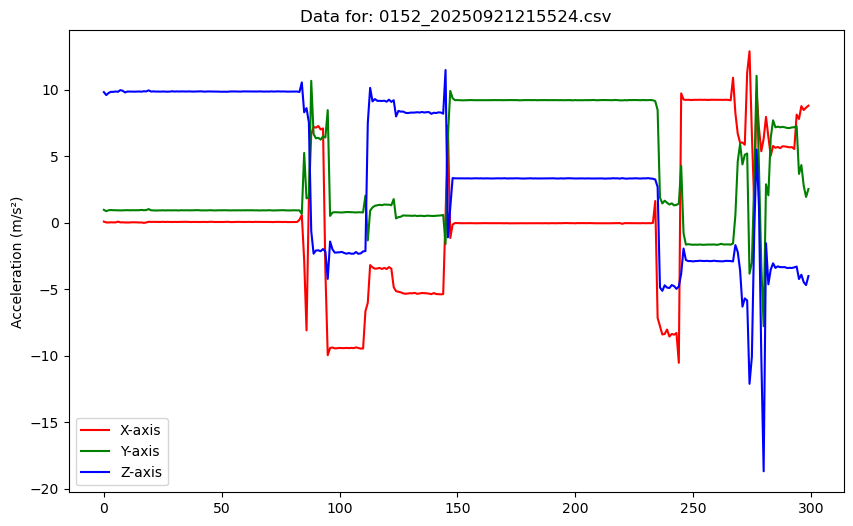

Enter label for 0152_20250921215524 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


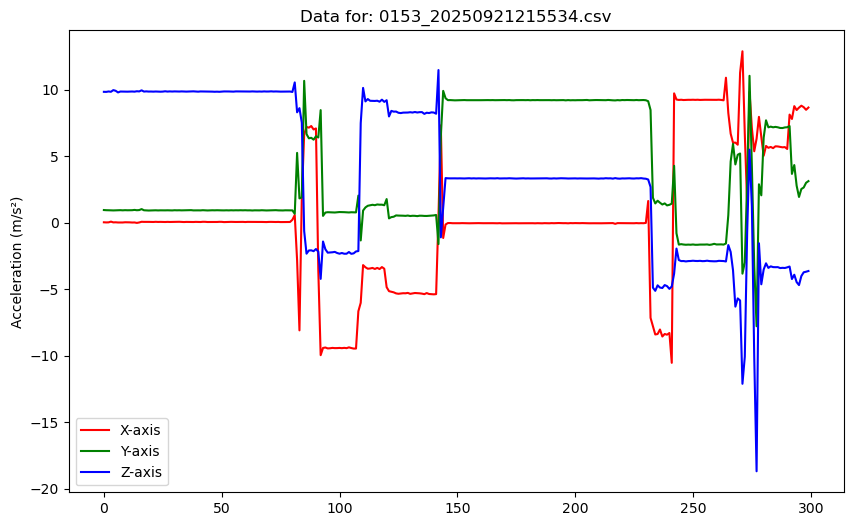

Enter label for 0153_20250921215534 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


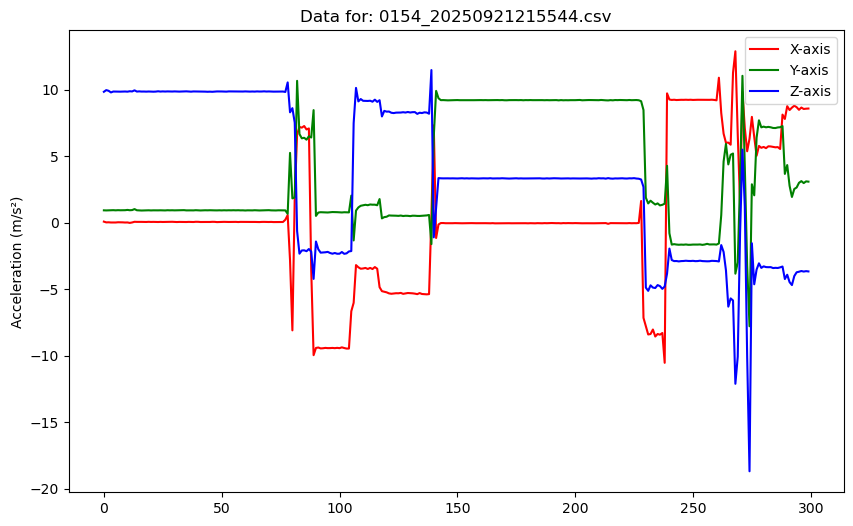

Enter label for 0154_20250921215544 (0, 1, 2, s, q):  1


  -> Labeled as '1'.


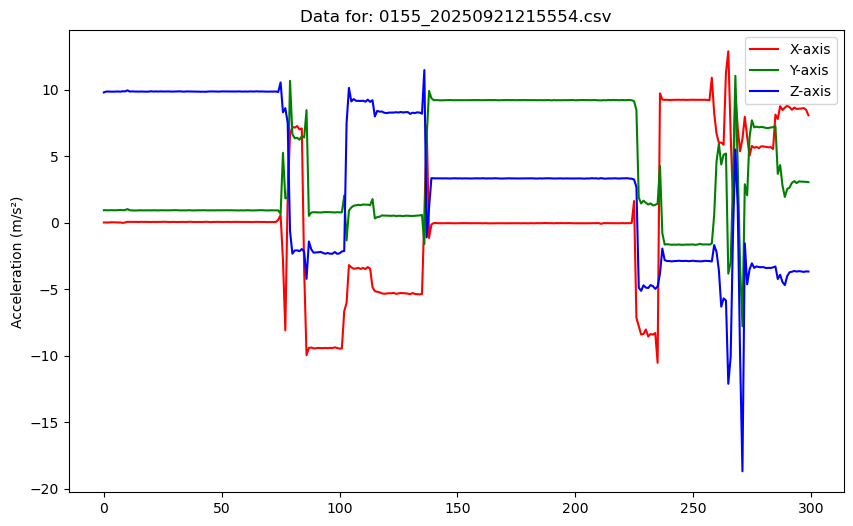

Enter label for 0155_20250921215554 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


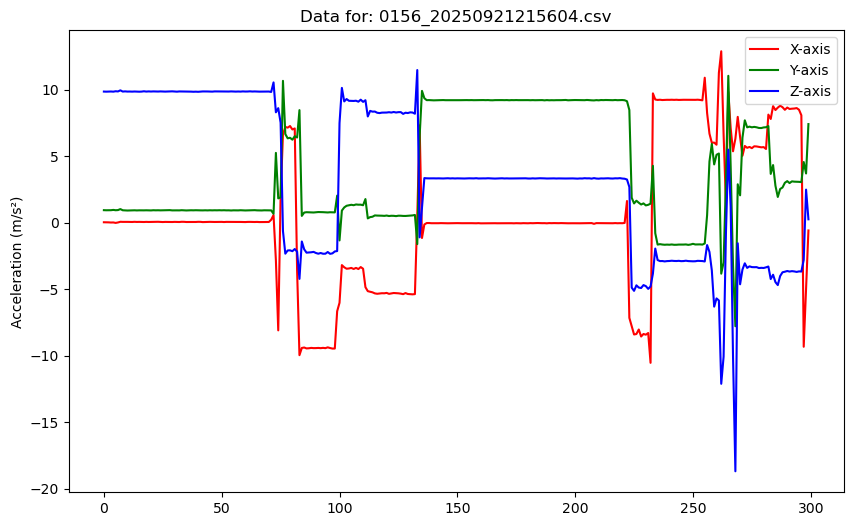

Enter label for 0156_20250921215604 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


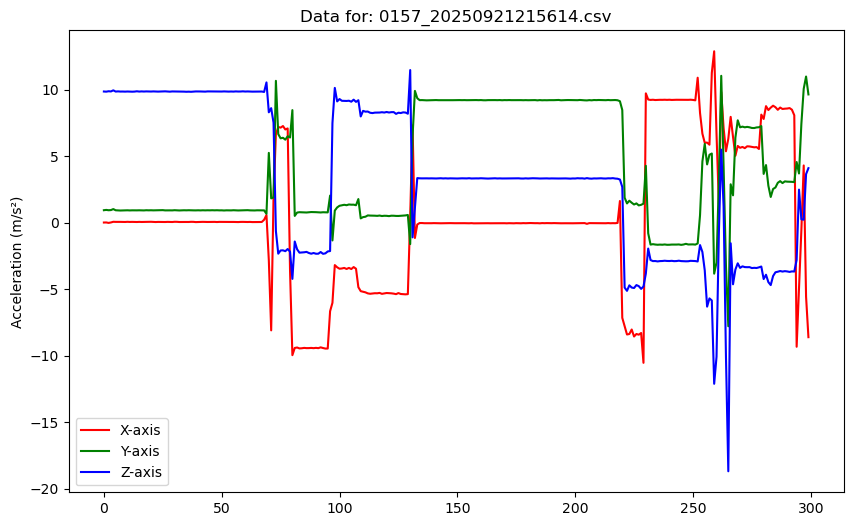

Enter label for 0157_20250921215614 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


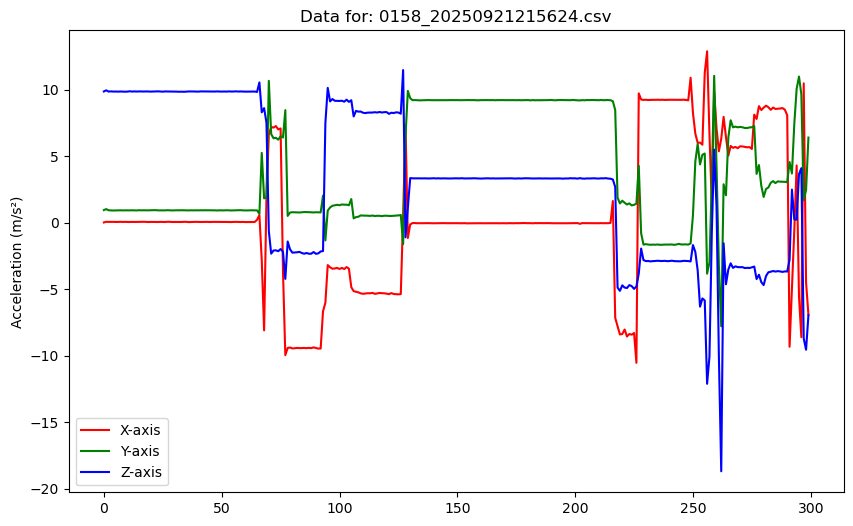

Enter label for 0158_20250921215624 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


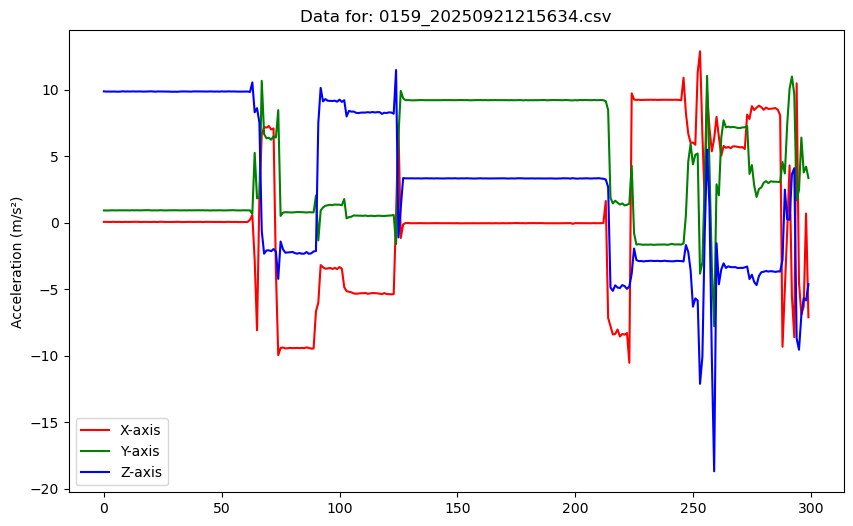

Enter label for 0159_20250921215634 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


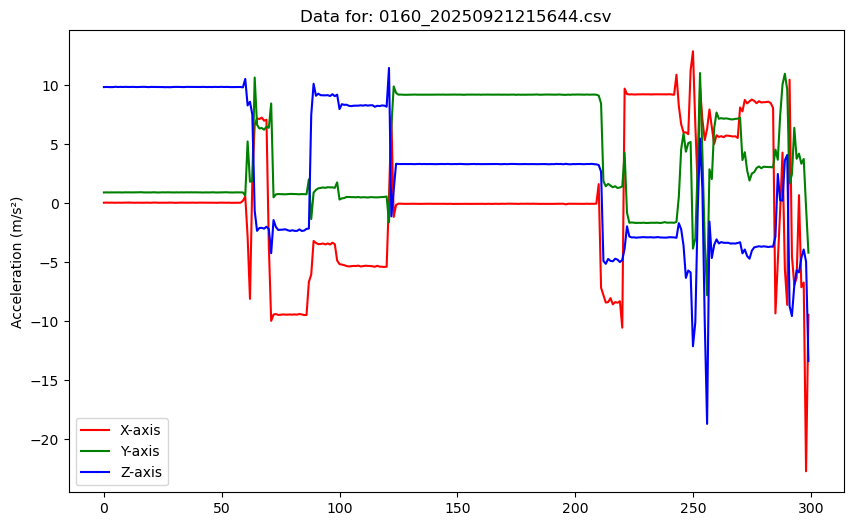

Enter label for 0160_20250921215644 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


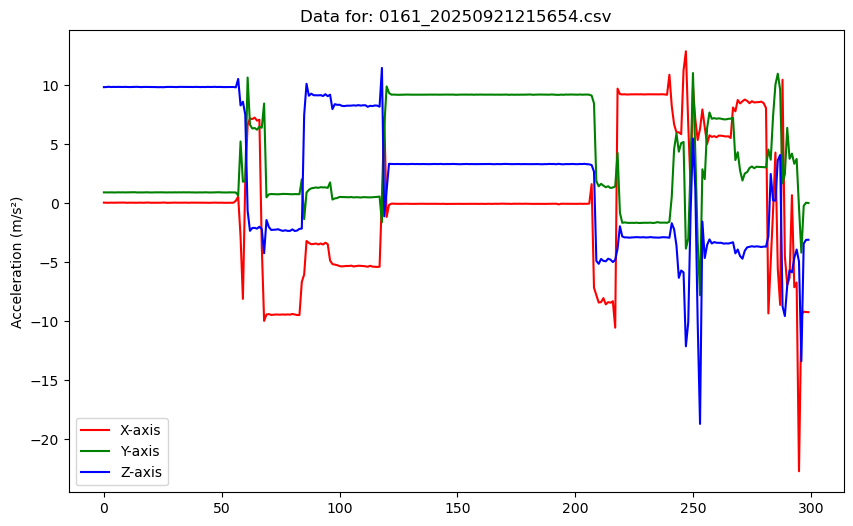

Enter label for 0161_20250921215654 (0, 1, 2, s, q):  2


  -> Labeled as '2'.


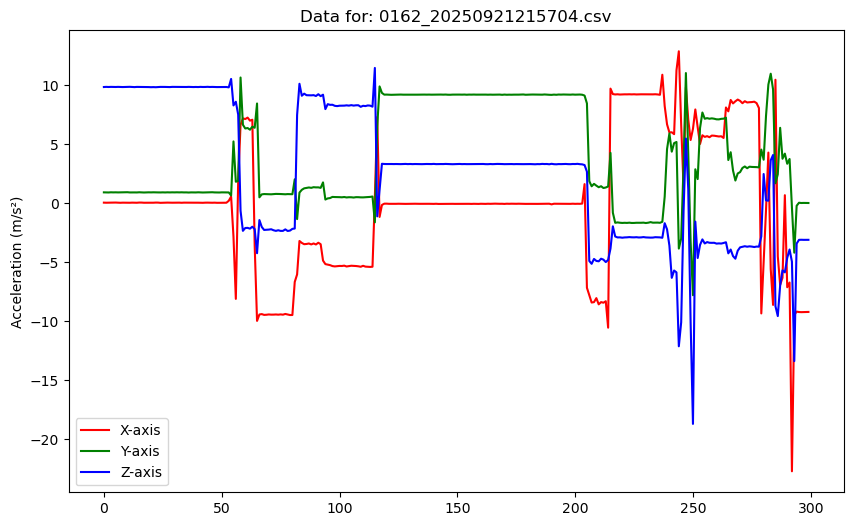

Enter label for 0162_20250921215704 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


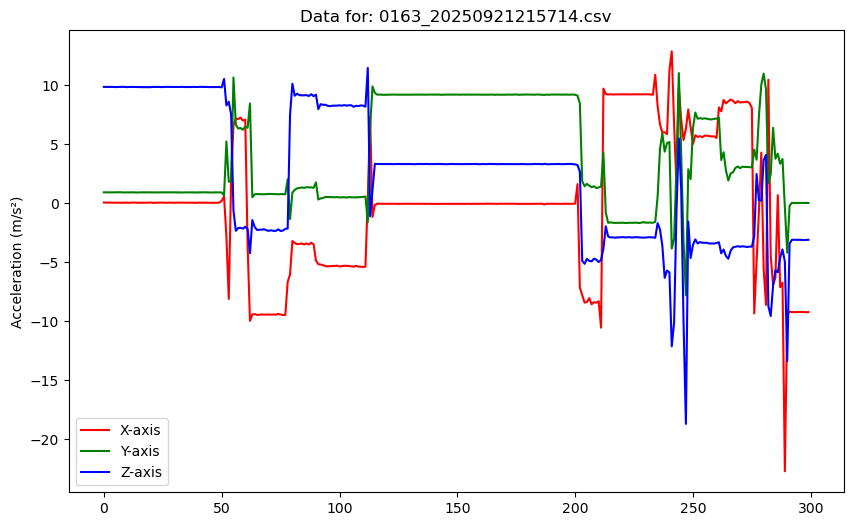

Enter label for 0163_20250921215714 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


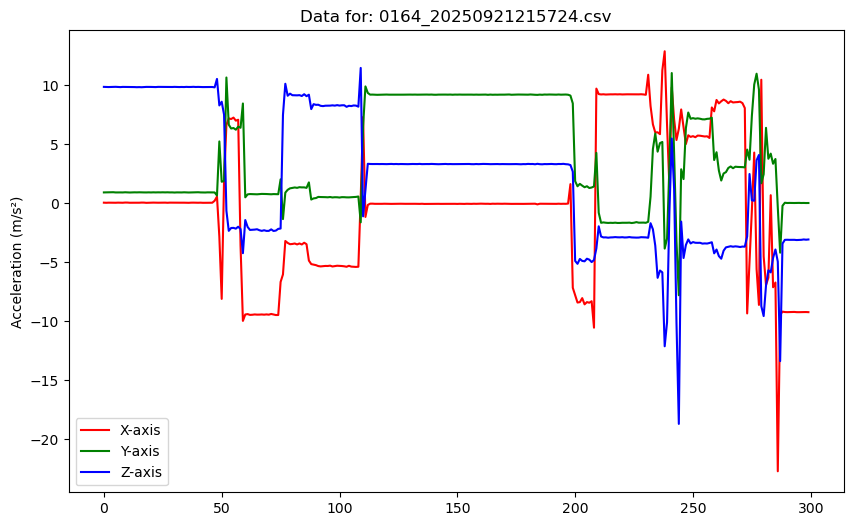

Enter label for 0164_20250921215724 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


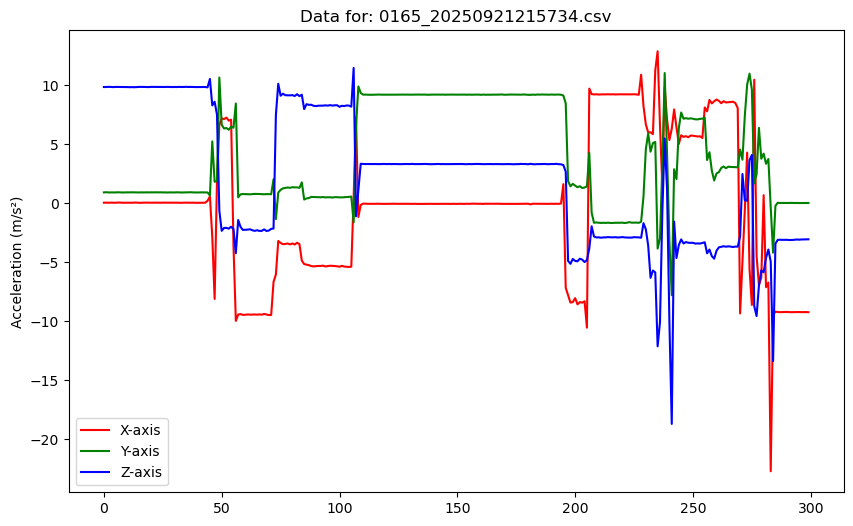

Enter label for 0165_20250921215734 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


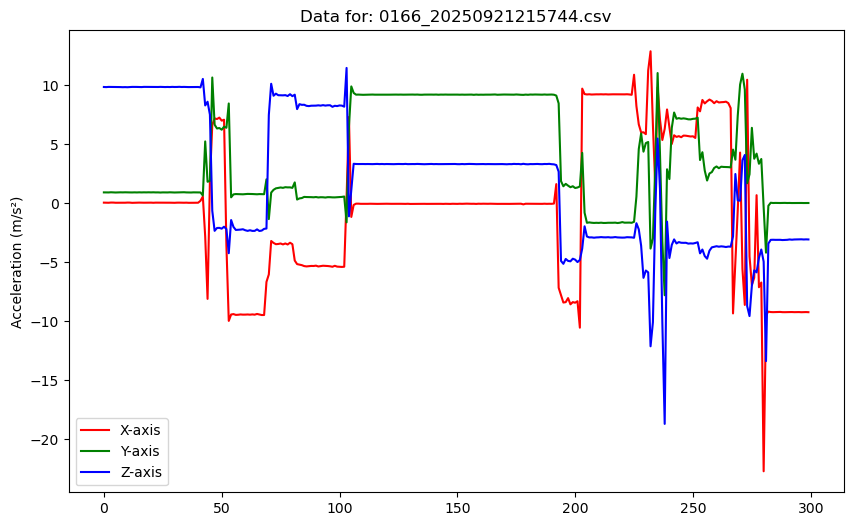

Enter label for 0166_20250921215744 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


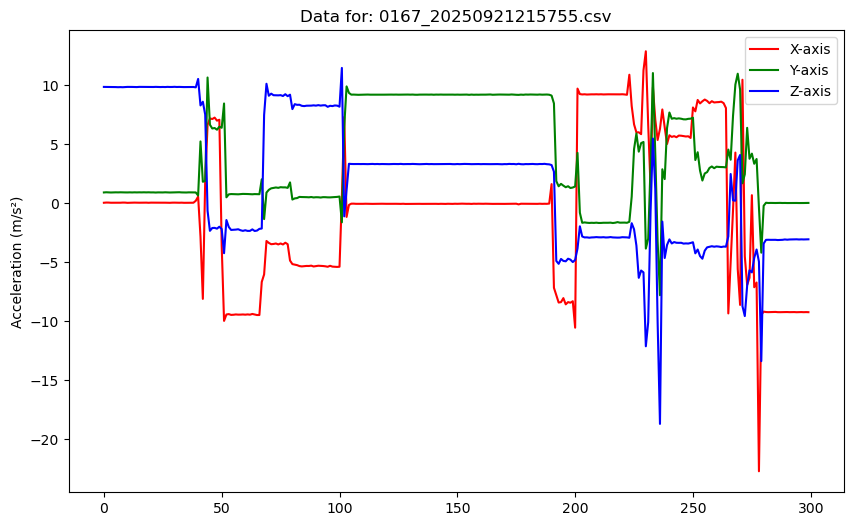

Enter label for 0167_20250921215755 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


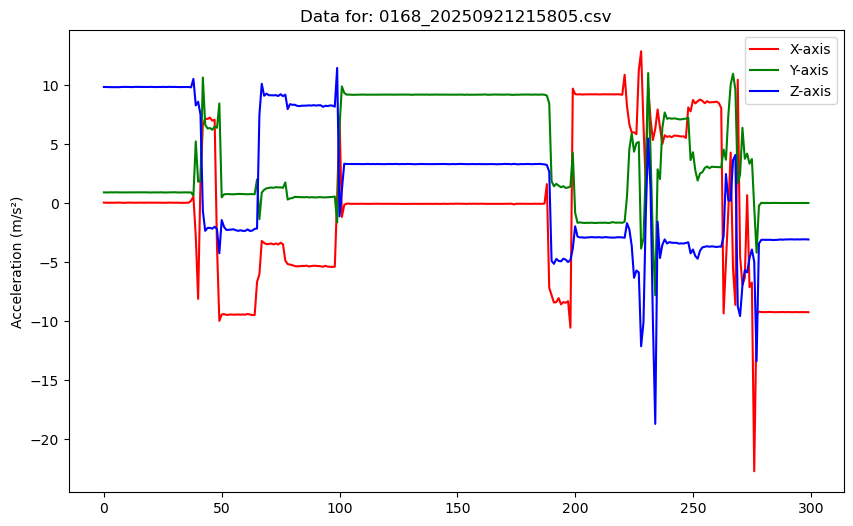

Enter label for 0168_20250921215805 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


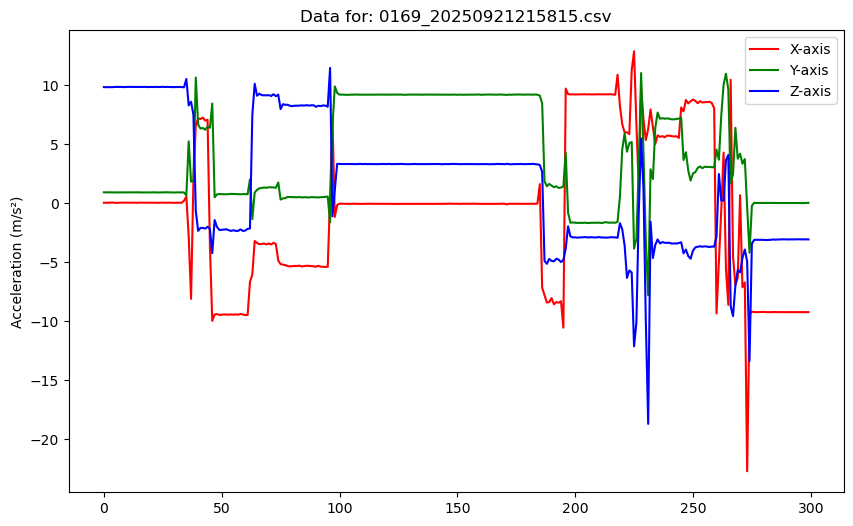

Enter label for 0169_20250921215815 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


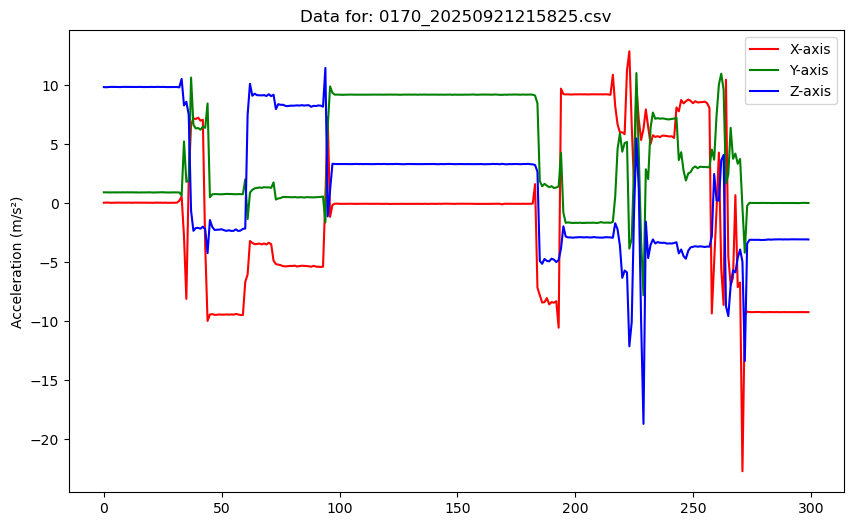

Enter label for 0170_20250921215825 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


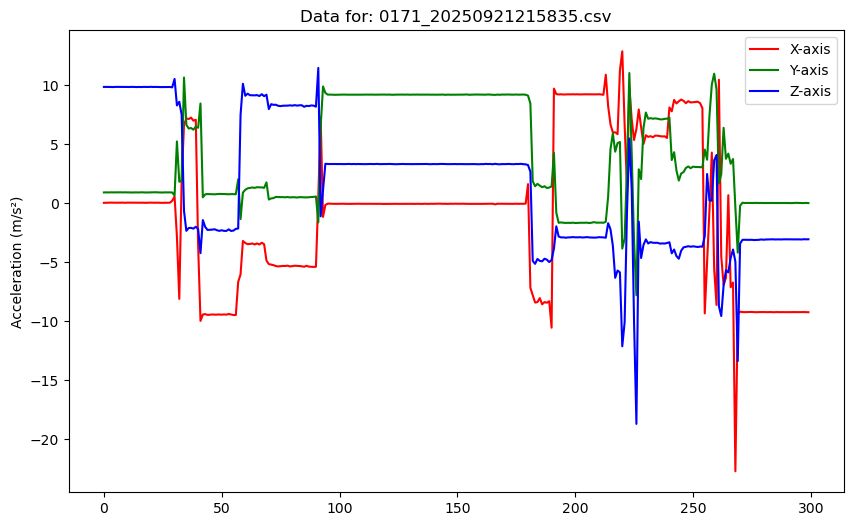

Enter label for 0171_20250921215835 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


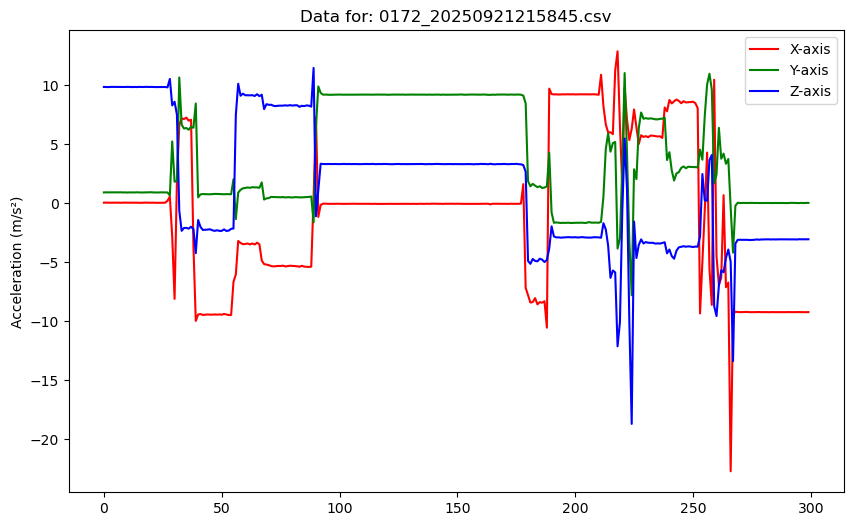

Enter label for 0172_20250921215845 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


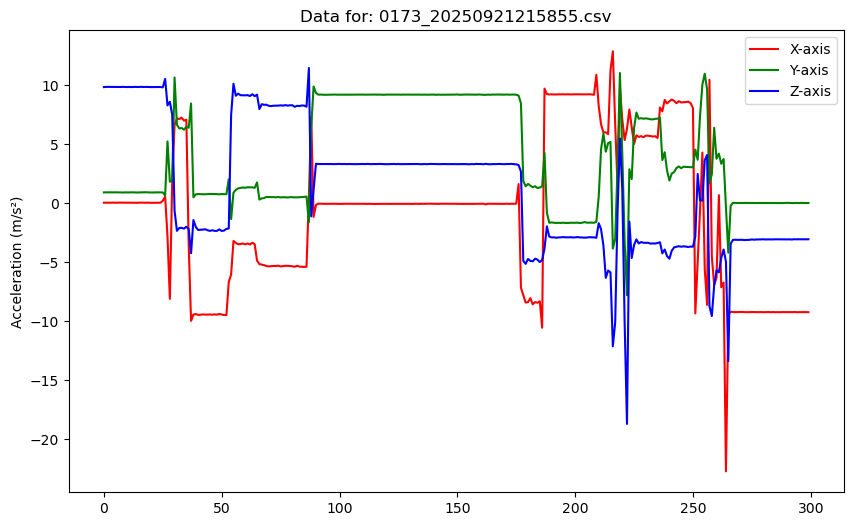

Enter label for 0173_20250921215855 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


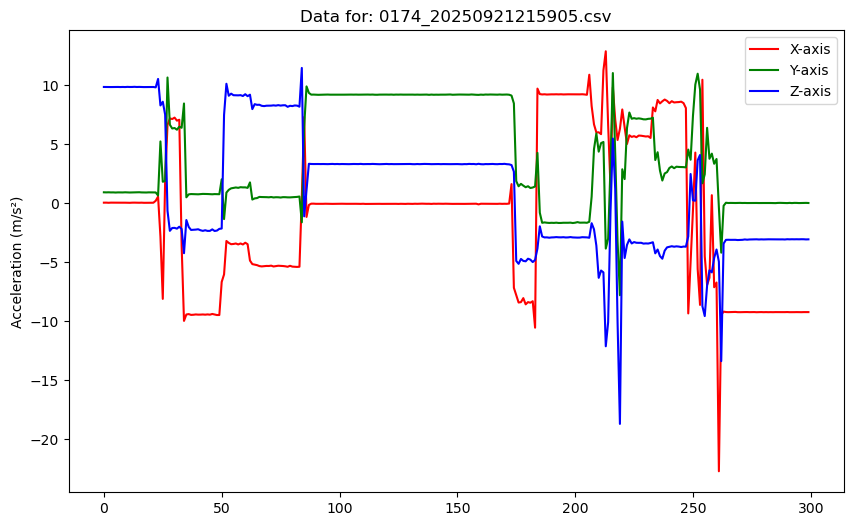

Enter label for 0174_20250921215905 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


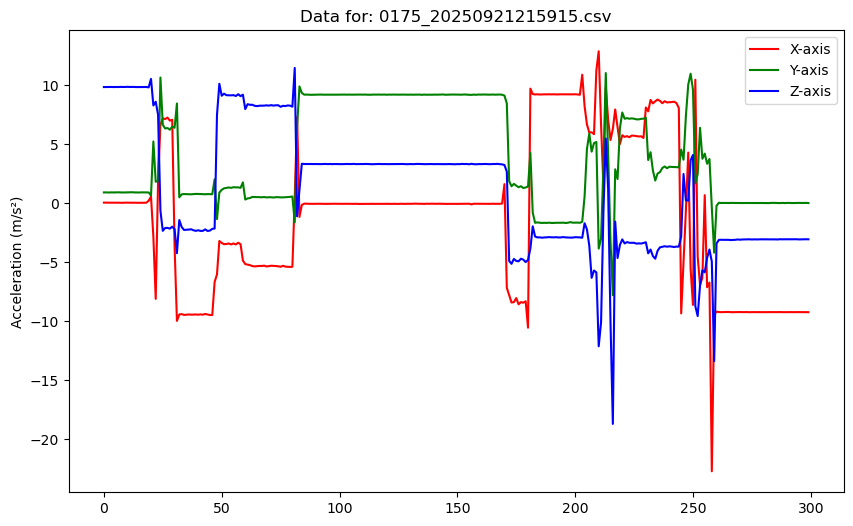

Enter label for 0175_20250921215915 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


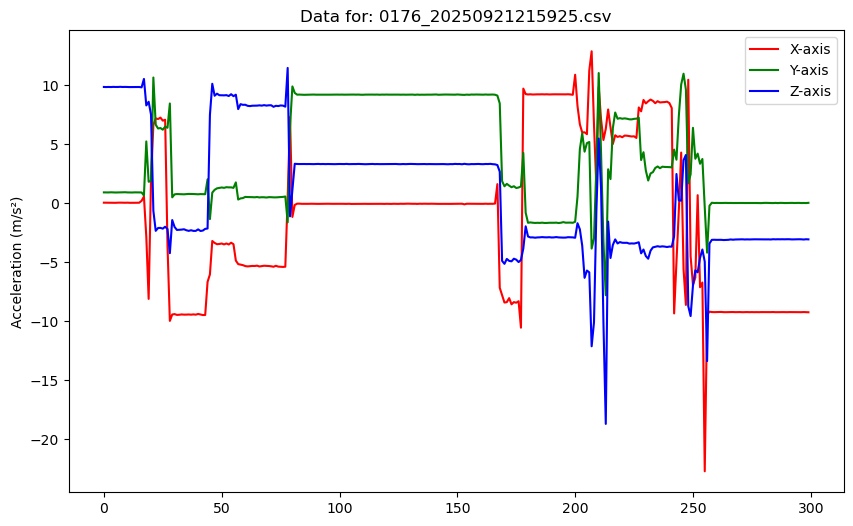

Enter label for 0176_20250921215925 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


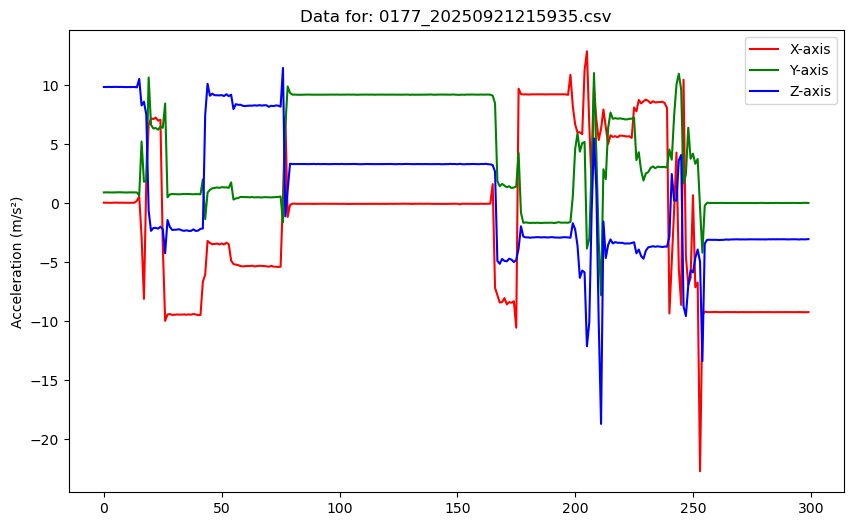

Enter label for 0177_20250921215935 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


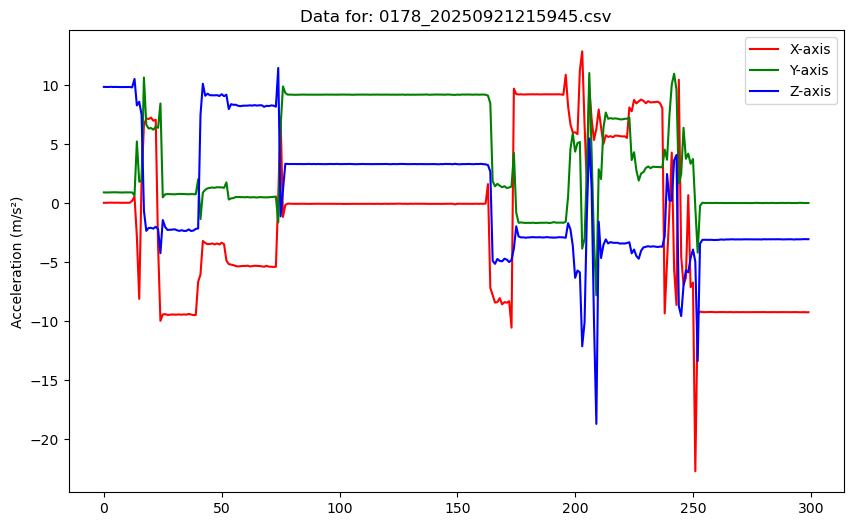

Enter label for 0178_20250921215945 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


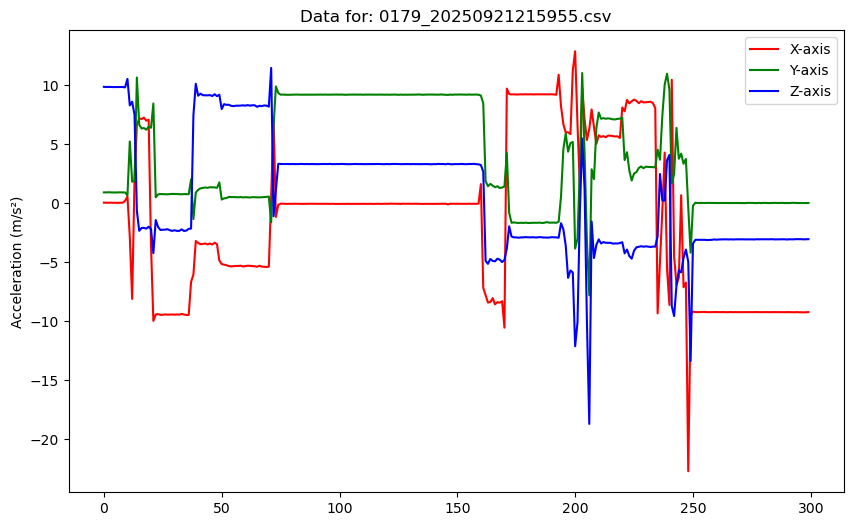

Enter label for 0179_20250921215955 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


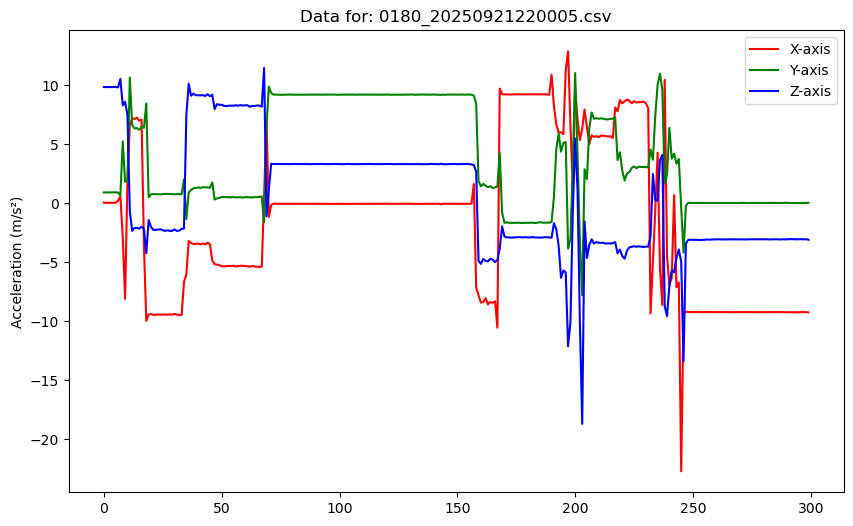

Enter label for 0180_20250921220005 (0, 1, 2, s, q):  0


  -> Labeled as '0'.


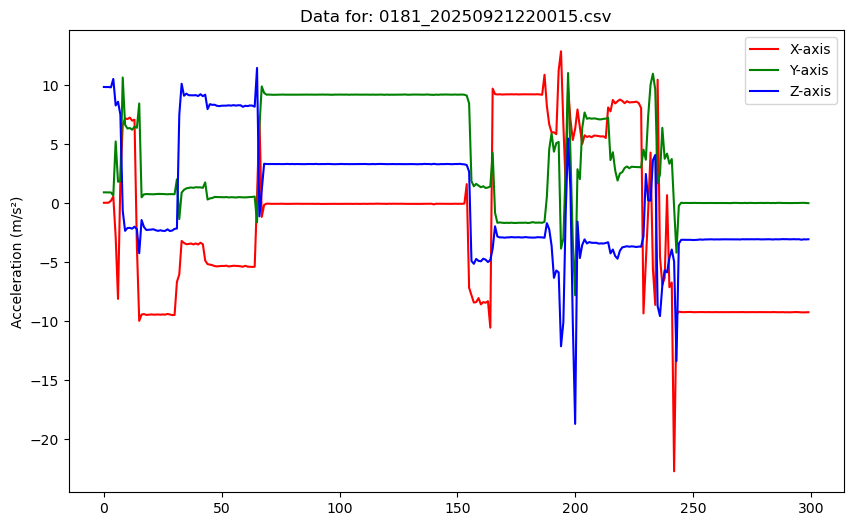

Enter label for 0181_20250921220015 (0, 1, 2, s, q):  0


  -> Labeled as '0'.
save_analysis() not available in this notebook. Run the main notebook cell first.

Annotation complete! All files have been processed and analysis summary updated.


In [1]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

# --- CONFIGURATION ---
DATA_DIR = "activity_data"
ANNOTATION_FILE = os.path.join(DATA_DIR, "annotations.csv")
# ---------------------

def save_analysis():
    """Generate a summary of activity data and save it to a text file."""
    data_files = [f for f in os.listdir(data_dir) if f.endswith('.csv') and not f.startswith('annotations')]
    if not data_files:
        return

    annotations = pd.read_csv(annotation_file)

    # Merge all CSVs into one DataFrame
    all_data = []
    for file in data_files:
        file_path = os.path.join(data_dir, file)
        try:
            df = pd.read_csv(file_path)
            df['filename'] = file
            all_data.append(df)
        except:
            continue

    if not all_data:
        return

    merged = pd.concat(all_data, ignore_index=True)

    # Calculate averages
    avg_x = merged['x'].mean()
    avg_y = merged['y'].mean()
    avg_z = merged['z'].mean()

    # Count activity labels
    label_counts = annotations['activity_label'].value_counts().to_dict()
    count_0 = label_counts.get(0, 0)
    count_1 = label_counts.get(1, 0)
    count_2 = label_counts.get(2, 0)

    summary_path = os.path.join(data_dir, "analysis_summary.txt")
    with open(summary_path, "w") as f:
        f.write("Activity Data Analysis Summary\n")
        f.write("="*40 + "\n\n")
        f.write(f"Average X: {avg_x:.3f}\n")
        f.write(f"Average Y: {avg_y:.3f}\n")
        f.write(f"Average Z: {avg_z:.3f}\n\n")
        f.write("Activity Counts:\n")
        f.write(f"  No Activity (0): {count_0}\n")
        f.write(f"  Waving (1): {count_1}\n")
        f.write(f"  Shaking (2): {count_2}\n")

    print(f"Analysis summary updated: {summary_path}")

def annotate_data():
    """A helper tool to quickly label collected activity data."""
    
    # Check if the annotation file exists
    if not os.path.exists(ANNOTATION_FILE):
        print(f"Error: Annotation file not found at '{ANNOTATION_FILE}'")
        return

    # Load the annotations into a pandas DataFrame
    annotations_df = pd.read_csv(ANNOTATION_FILE)
    
    # Find all rows that haven't been manually annotated yet (assuming '0' is the default)
    # The '.copy()' is used to avoid a SettingWithCopyWarning
    to_annotate = annotations_df[annotations_df['activity_label'] == 0].copy()

    if to_annotate.empty:
        print("All data has already been annotated. Well done!")
        return

    print(f"Found {len(to_annotate)} files to annotate. Let's begin!")
    print("Instructions:")
    print("  - A plot and an image will be displayed for each data file.")
    print("  - In the TERMINAL, enter the correct activity label.")
    print("  - Options: '0' (No Activity), '1' (Waving), '2' (Shaking)")
    print("  - Enter 's' to skip, or 'q' to quit and save progress.")
    print("-" * 30)
    
    # Loop through each row that needs annotation
    for index, row in to_annotate.iterrows():
        filename = row['filename']
        base_name = filename.replace('.csv', '')
        
        csv_path = os.path.join(DATA_DIR, filename)
        img_path = os.path.join(DATA_DIR, f"{base_name}.jpg")
        
        # --- Display Data and Image ---
        # Read and plot the accelerometer data
        try:
            data_df = pd.read_csv(csv_path)
            plt.figure(figsize=(10, 6))
            plt.plot(data_df['x'], label='X-axis', color='red')
            plt.plot(data_df['y'], label='Y-axis', color='green')
            plt.plot(data_df['z'], label='Z-axis', color='blue')
            plt.title(f"Data for: {filename}")
            plt.ylabel("Acceleration (m/s²)")
            plt.legend()
            plt.show(block=False) # Use non-blocking show
            
            # Read and show the image
            image = cv2.imread(img_path)
            cv2.imshow(f"Activity Image for {base_name}", image)

        except Exception as e:
            print(f"Could not load files for {base_name}. Skipping. Error: {e}")
            plt.close()
            cv2.destroyAllWindows()
            continue

        # --- Get User Input ---
        while True:
            # The pause is necessary to allow the windows to render
            plt.pause(0.1)
            cv2.waitKey(1)
            
            user_input = input(f"Enter label for {base_name} (0, 1, 2, s, q): ").strip().lower()

            if user_input in ['0', '1', '2']:
                # Update the label in our main DataFrame
                annotations_df.loc[annotations_df['filename'] == filename, 'activity_label'] = int(user_input)
                print(f"  -> Labeled as '{user_input}'.")
                break
            elif user_input == 's':
                print("  -> Skipped.")
                break
            elif user_input == 'q':
                print("Quitting and saving progress...")
                plt.close()
                cv2.destroyAllWindows()
                annotations_df.to_csv(ANNOTATION_FILE, index=False)
                print("Progress saved. Goodbye!")
                return
            else:
                print("  Invalid input. Please enter 0, 1, 2, s, or q.")
        
        # Clean up windows for the next item
        plt.close()
        cv2.destroyAllWindows()

    # Save the final, updated annotations back to the CSV file
    # Save the final, updated annotations back to the CSV file
    annotations_df.to_csv(ANNOTATION_FILE, index=False)
    
    # Update analysis summary too
    try:
        save_analysis()
    except NameError:
        print("save_analysis() not available in this notebook. Run the main notebook cell first.")
    
    print("\nAnnotation complete! All files have been processed and analysis summary updated.")



if __name__ == '__main__':
    annotate_data()